# Report Anlaysis

This takes the compound report CSVs from the previous steps and procudes PDFs with images.

Currently, we're waiting for the previous step to be re-run while to update a few of the processes and phenotypes examined.

In [1]:
import pandas as pd
from data_tools import graphs as gt
import seaborn as sns
import utils
import json
import matplotlib.pyplot as plt
from data_tools.plotting import prep_node_labels

/opt/mmayers/software/anaconda3/envs/ml/lib/python3.6/site-packages/data_tools/df_processing.py:4: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [2]:
from fpdf import FPDF

In [3]:
from pathlib import Path

In [4]:
pheno_dir = Path('../2_pipeline/AD_Endpoints/out/').resolve()
gene_dir = Path('../2_pipeline/Compound_report_generation/out').resolve()

In [5]:
out_dir = pheno_dir.parent.parent.joinpath('Report_analysis', 'out')
tmp_dir = pheno_dir.parent.parent.joinpath('Report_analysis', 'tmp')

out_dir.mkdir(exist_ok=True, parents=True)
tmp_dir.mkdir(exist_ok=True, parents=True)

In [6]:
probs = pd.read_csv(pheno_dir.joinpath('top_100_probas.csv'))

In [7]:
probs

,chemicalsubstance_id,disease_id,status,proba,cid,did,treat_proba,dementia_proba,apraxia_proba,abnormality_of_mitochondrial_metabolism_proba,...,negative_regulation_of_neuroinflammatory_response_proba,protein_import_into_mitochondrial_matrix_proba,mini_excitatory_postsynaptic_potential_proba,evoked_excitatory_postsynaptic_potential_proba,negative_regulation_of_astrocyte_activation_proba,neuroinflammatory_response_proba,stress-induced_mitochondrial_fusion_proba,positive_regulation_of_nmda_glutamate_receptor_activity_proba,tau-protein_kinase_activity_proba,astrocyte_activation_involved_in_immune_response_proba
0,CHEBI:8354,DOID:10652,0,0.777562,pralidoxime,Alzheimer's disease,1.000000,1.000000,0.038108,0.894264,...,0.068867,0.000000,0.107494,0.090951,0.016399,0.040318,0.000000,0.050407,0.198083,0.058200
1,CHEBI:8892,DOID:10652,0,0.741301,rosiglitazone maleate,Alzheimer's disease,0.916298,0.590014,0.166400,0.060238,...,0.652547,0.437979,0.579645,0.676068,0.508406,0.667096,0.046816,0.469879,0.567980,0.468558
2,CHEBI:45713,DOID:10652,0,0.695434,trans-resveratrol,Alzheimer's disease,0.810423,0.405086,0.085300,0.000000,...,0.939330,1.000000,0.896252,0.865794,1.000000,0.926290,1.000000,0.792862,0.989514,0.775957
3,CHEBI:37537,DOID:10652,0,0.669816,phorbol 13-acetate 12-myristate,Alzheimer's disease,0.751288,0.510366,0.298958,0.167707,...,1.000000,0.703354,0.858391,0.858541,0.640551,0.846217,0.705818,0.798969,1.000000,0.736774
4,CHEBI:16240,DOID:10652,0,0.629672,hydrogen peroxide,Alzheimer's disease,0.658622,0.311229,0.140077,0.112167,...,0.576808,0.661698,0.779146,0.746772,0.589916,0.640563,0.113656,0.631576,0.721190,0.495593
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,CHEBI:6015,DOID:10652,0,0.349868,isoflurane,Alzheimer's disease,0.012744,0.171353,0.123423,0.858273,...,0.373789,0.431337,0.352010,0.396421,0.043657,0.286538,0.286598,0.337679,0.538326,0.258340
96,CHEBI:16842,DOID:10652,0,0.349544,formaldehyde,Alzheimer's disease,0.011996,0.164853,0.411269,0.343079,...,0.668275,0.095468,0.611804,0.673564,0.137650,0.487477,0.045459,0.484539,0.516149,0.435227
97,CHEBI:4480,DOID:10652,0,0.348165,Diacetylmonoxime,Alzheimer's disease,0.008813,0.453783,0.105552,0.963121,...,0.070839,0.000000,0.123326,0.114700,0.000000,0.013749,0.000000,0.035925,0.098757,0.007778
98,CHEBI:8060,DOID:10652,0,0.344817,Phenelzine,Alzheimer's disease,0.001085,0.372471,0.049584,0.523094,...,0.106861,0.078687,0.163292,0.183309,0.009516,0.056453,0.000000,0.033178,0.057370,0.025945


In [8]:
n, e = utils.load_network()

In [9]:
c = gt.combine_nodes_and_edges(n, e)

In [10]:
id_to_name = n.set_index('id')['name'].to_dict()

In [12]:
ep = utils.read_json(pheno_dir.joinpath('endpoints.json'))

In [13]:
for k, v in ep.items():
    print(k)
    for val in v:
        print(' ', val, id_to_name[val])
    print('')

increase_bp
  GO:0006914 autophagy
  GO:0061909 autophagosome-lysosome fusion
  GO:0000422 autophagy of mitochondrion
  GO:0006119 oxidative phosphorylation
  GO:0150079 negative regulation of neuroinflammatory response
  GO:0030150 protein import into mitochondrial matrix
  GO:0098816 mini excitatory postsynaptic potential
  GO:0098817 evoked excitatory postsynaptic potential
  GO:0061889 negative regulation of astrocyte activation

decrease_bp
  GO:0150076 neuroinflammatory response
  GO:1990046 stress-induced mitochondrial fusion
  GO:1904783 positive regulation of NMDA glutamate receptor activity
  GO:0050321 tau-protein kinase activity
  GO:0002265 astrocyte activation involved in immune response

phenotypes
  HP:0003287 Abnormality of mitochondrial metabolism
  HP:0002185 Neurofibrillary tangles
  HP:0002120 Cerebral cortical atrophy
  HP:0002354 Memory impairment
  HP:0002423 Long-tract signs
  HP:0002446 Astrocytosis

diseases
  DOID:1307 dementia
  DOID:0060135 apraxia



In [14]:
cats = utils.read_json(pheno_dir.joinpath('categories.json'))

In [15]:
cats = {k: [id_to_name[v] for v in vals] for k, vals in cats.items()}

In [16]:
cats

{'Autophagy': ['autophagy',
  'autophagosome-lysosome fusion',
  'autophagosome assembly'],
 'Mitochondrial function': ['oxidative phosphorylation',
  'Abnormality of mitochondrial metabolism',
  'stress-induced mitochondrial fusion',
  'protein import into mitochondrial matrix'],
 'Neuroinflammation': ['Neurofibrillary tangles',
  'neuroinflammatory response',
  'negative regulation of neuroinflammatory response',
  'Cerebral cortical atrophy',
  'tau-protein kinase activity'],
 'Synaptic health': ['amyloid-beta formation',
  'positive regulation of NMDA glutamate receptor activity',
  'mini excitatory postsynaptic potential',
  'evoked excitatory postsynaptic potential'],
 'Reactive astrogliosis': ['Astrocytosis',
  'astrocyte activation involved in immune response',
  'negative regulation of astrocyte activation'],
 'Clinical symtopms': ['Memory impairment',
  'Long-tract signs',
  'dementia',
  'apraxia']}

In [17]:
cats = {k: [v.lower().replace(' ','_') for v in vals] for k, vals in cats.items()}

I'm not sure what happened, but the columns in `probas` don't currently match the values in `cats`, so below we've had to use `dataframe.reindex()` indstead of `dataframe.loc[]` to avoid `Indexing with list with missing labels is deprecated` errors.

In [18]:
probs.head(2)

,chemicalsubstance_id,disease_id,status,proba,cid,did,treat_proba,dementia_proba,apraxia_proba,abnormality_of_mitochondrial_metabolism_proba,...,negative_regulation_of_neuroinflammatory_response_proba,protein_import_into_mitochondrial_matrix_proba,mini_excitatory_postsynaptic_potential_proba,evoked_excitatory_postsynaptic_potential_proba,negative_regulation_of_astrocyte_activation_proba,neuroinflammatory_response_proba,stress-induced_mitochondrial_fusion_proba,positive_regulation_of_nmda_glutamate_receptor_activity_proba,tau-protein_kinase_activity_proba,astrocyte_activation_involved_in_immune_response_proba
0,CHEBI:8354,DOID:10652,0,0.777562,pralidoxime,Alzheimer's disease,1.000000,1.000000,0.038108,0.894264,...,0.068867,0.000000,0.107494,0.090951,0.016399,0.040318,0.000000,0.050407,0.198083,0.058200
1,CHEBI:8892,DOID:10652,0,0.741301,rosiglitazone maleate,Alzheimer's disease,0.916298,0.590014,0.166400,0.060238,...,0.652547,0.437979,0.579645,0.676068,0.508406,0.667096,0.046816,0.469879,0.567980,0.468558


In [19]:
gene_cutoff = 0.1

In [20]:
probs

,chemicalsubstance_id,disease_id,status,proba,cid,did,treat_proba,dementia_proba,apraxia_proba,abnormality_of_mitochondrial_metabolism_proba,...,negative_regulation_of_neuroinflammatory_response_proba,protein_import_into_mitochondrial_matrix_proba,mini_excitatory_postsynaptic_potential_proba,evoked_excitatory_postsynaptic_potential_proba,negative_regulation_of_astrocyte_activation_proba,neuroinflammatory_response_proba,stress-induced_mitochondrial_fusion_proba,positive_regulation_of_nmda_glutamate_receptor_activity_proba,tau-protein_kinase_activity_proba,astrocyte_activation_involved_in_immune_response_proba
0,CHEBI:8354,DOID:10652,0,0.777562,pralidoxime,Alzheimer's disease,1.000000,1.000000,0.038108,0.894264,...,0.068867,0.000000,0.107494,0.090951,0.016399,0.040318,0.000000,0.050407,0.198083,0.058200
1,CHEBI:8892,DOID:10652,0,0.741301,rosiglitazone maleate,Alzheimer's disease,0.916298,0.590014,0.166400,0.060238,...,0.652547,0.437979,0.579645,0.676068,0.508406,0.667096,0.046816,0.469879,0.567980,0.468558
2,CHEBI:45713,DOID:10652,0,0.695434,trans-resveratrol,Alzheimer's disease,0.810423,0.405086,0.085300,0.000000,...,0.939330,1.000000,0.896252,0.865794,1.000000,0.926290,1.000000,0.792862,0.989514,0.775957
3,CHEBI:37537,DOID:10652,0,0.669816,phorbol 13-acetate 12-myristate,Alzheimer's disease,0.751288,0.510366,0.298958,0.167707,...,1.000000,0.703354,0.858391,0.858541,0.640551,0.846217,0.705818,0.798969,1.000000,0.736774
4,CHEBI:16240,DOID:10652,0,0.629672,hydrogen peroxide,Alzheimer's disease,0.658622,0.311229,0.140077,0.112167,...,0.576808,0.661698,0.779146,0.746772,0.589916,0.640563,0.113656,0.631576,0.721190,0.495593
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,CHEBI:6015,DOID:10652,0,0.349868,isoflurane,Alzheimer's disease,0.012744,0.171353,0.123423,0.858273,...,0.373789,0.431337,0.352010,0.396421,0.043657,0.286538,0.286598,0.337679,0.538326,0.258340
96,CHEBI:16842,DOID:10652,0,0.349544,formaldehyde,Alzheimer's disease,0.011996,0.164853,0.411269,0.343079,...,0.668275,0.095468,0.611804,0.673564,0.137650,0.487477,0.045459,0.484539,0.516149,0.435227
97,CHEBI:4480,DOID:10652,0,0.348165,Diacetylmonoxime,Alzheimer's disease,0.008813,0.453783,0.105552,0.963121,...,0.070839,0.000000,0.123326,0.114700,0.000000,0.013749,0.000000,0.035925,0.098757,0.007778
98,CHEBI:8060,DOID:10652,0,0.344817,Phenelzine,Alzheimer's disease,0.001085,0.372471,0.049584,0.523094,...,0.106861,0.078687,0.163292,0.183309,0.009516,0.056453,0.000000,0.033178,0.057370,0.025945


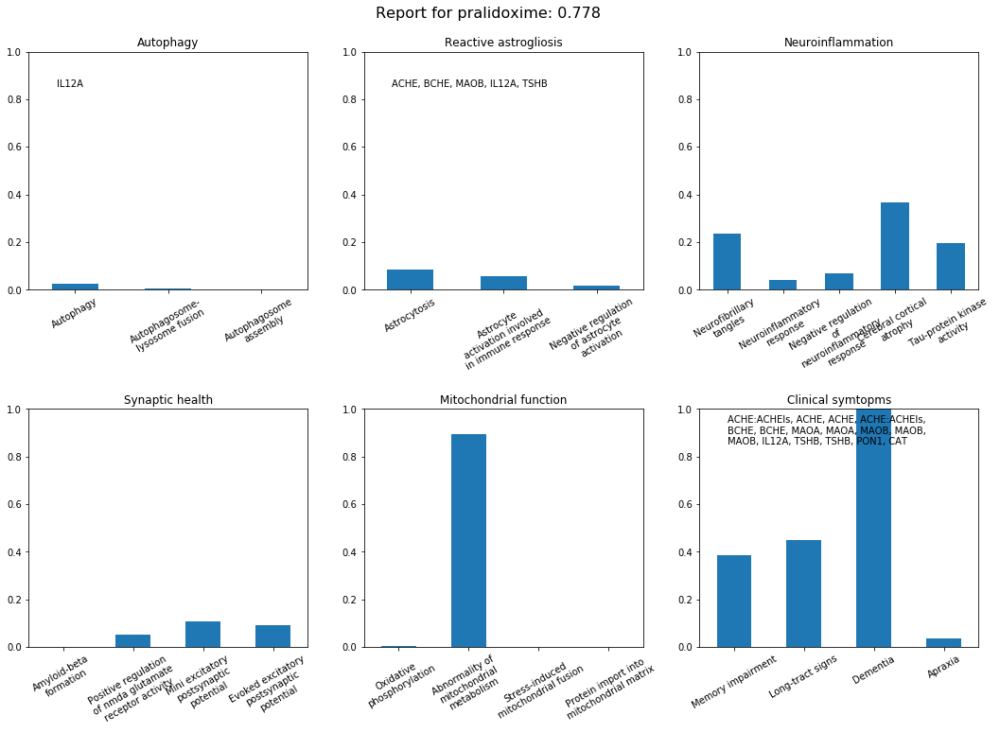

In [25]:
idx = 0

row = 2
col = (len(cats) // 2)

fig, ax = plt.subplots(row, col)
fig.set_size_inches(6*col, 4*row+3)

name = probs.loc[idx, 'cid']
prob = probs.loc[idx, 'proba']

gene_info = pd.read_csv(gene_dir.joinpath(name.replace(' ', '_') + '_tgt_genes.csv'))

plt.suptitle('Report for {}: {:0.3}'.format(name, prob), size=16)
plt.subplots_adjust(top=.92, hspace=.5)

for i, (cat, vals) in enumerate(cats.items()):
    
    gene_vals = gene_info.set_index('node_name').reindex(columns=[v + '_metric' for v in vals])
    genes = gene_vals[gene_vals > gene_cutoff].stack().index
    if type(genes) == pd.MultiIndex:
        genes = [g[0] for g in genes.tolist()]
    else:
        genes = genes.tolist()
        
    genes = prep_node_labels(', '.join(genes), 40)
    
    sub = (i%row, i%col)
    ax[sub].set_title(cat)
    probs.loc[idx].reindex([v+'_proba' for v in vals]).plot(kind='bar', ax=ax[sub])
    ax[sub].set_ylim(0, 1)
    ax[sub].text(.1, .85, genes, transform=ax[sub].transAxes)
    
    
    names = [prep_node_labels(v.replace('_', ' ').capitalize(), 20) for v in vals]
    
    ax[sub].set_xticklabels(names, rotation=30)
    



In [26]:
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.patches import Circle, RegularPolygon
from matplotlib.path import Path
from matplotlib.projections.polar import PolarAxes
from matplotlib.projections import register_projection
from matplotlib.spines import Spine
from matplotlib.transforms import Affine2D


def radar_factory(num_vars, frame='circle'):
    """Create a radar chart with `num_vars` axes.

    This function creates a RadarAxes projection and registers it.

    Parameters
    ----------
    num_vars : int
        Number of variables for radar chart.
    frame : {'circle' | 'polygon'}
        Shape of frame surrounding axes.

    """
    # calculate evenly-spaced axis angles
    theta = np.linspace(0, 2*np.pi, num_vars, endpoint=False)

    class RadarAxes(PolarAxes):

        name = 'radar'

        def __init__(self, *args, **kwargs):
            super().__init__(*args, **kwargs)
            # rotate plot such that the first axis is at the top
            self.set_theta_zero_location('N')

        def fill(self, *args, closed=True, **kwargs):
            """Override fill so that line is closed by default"""
            return super().fill(closed=closed, *args, **kwargs)

        def plot(self, *args, **kwargs):
            """Override plot so that line is closed by default"""
            lines = super().plot(*args, **kwargs)
            for line in lines:
                self._close_line(line)

        def _close_line(self, line):
            x, y = line.get_data()
            # FIXME: markers at x[0], y[0] get doubled-up
            if x[0] != x[-1]:
                x = np.concatenate((x, [x[0]]))
                y = np.concatenate((y, [y[0]]))
                line.set_data(x, y)

        def set_varlabels(self, labels):
            self.set_thetagrids(np.degrees(theta), labels)

        def _gen_axes_patch(self):
            # The Axes patch must be centered at (0.5, 0.5) and of radius 0.5
            # in axes coordinates.
            if frame == 'circle':
                return Circle((0.5, 0.5), 0.5)
            elif frame == 'polygon':
                return RegularPolygon((0.5, 0.5), num_vars,
                                      radius=.5, edgecolor="k")
            else:
                raise ValueError("unknown value for 'frame': %s" % frame)

        def draw(self, renderer):
            """ Draw. If frame is polygon, make gridlines polygon-shaped """
            if frame == 'polygon':
                gridlines = self.yaxis.get_gridlines()
                for gl in gridlines:
                    gl.get_path()._interpolation_steps = num_vars
            super().draw(renderer)


        def _gen_axes_spines(self):
            if frame == 'circle':
                return super()._gen_axes_spines()
            elif frame == 'polygon':
                # spine_type must be 'left'/'right'/'top'/'bottom'/'circle'.
                spine = Spine(axes=self,
                              spine_type='circle',
                              path=Path.unit_regular_polygon(num_vars))
                # unit_regular_polygon gives a polygon of radius 1 centered at
                # (0, 0) but we want a polygon of radius 0.5 centered at (0.5,
                # 0.5) in axes coordinates.
                spine.set_transform(Affine2D().scale(.5).translate(.5, .5)
                                    + self.transAxes)


                return {'polar': spine}
            else:
                raise ValueError("unknown value for 'frame': %s" % frame)

    register_projection(RadarAxes)
    return theta


In [27]:
idx = 1

chem_id = probs.loc[idx, 'chemicalsubstance_id']

n_genes = len(c.query('start_id == @chem_id and end_label == "MacromolecularMachine"'))
n_treats = len(c.query('start_id == @chem_id and type == "treats_CtD"'))

In [28]:
n_genes

3001

In [29]:
n_treats

32

## PDF generation testing

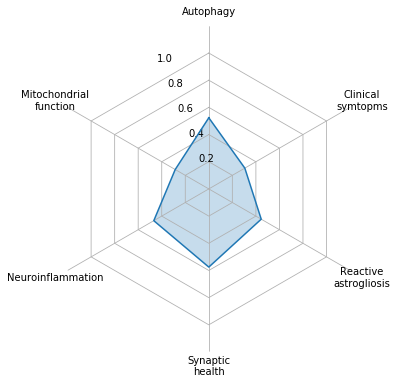

In [31]:
idx = 1

spoke_labels, data = list(cats.keys()), list(cats.values())
spoke_labels = [s.replace(' ', '\n') for s in spoke_labels]
data = [probs.loc[idx].reindex([sg+'_proba' for sg in subgroups]).mean() for subgroups in data] 

theta = radar_factory(len(data), 'polygon')

fig, ax = plt.subplots(1, 1, figsize=(6, 6), subplot_kw=dict(projection='radar'))

ax.set_rgrids([0.2, 0.4, 0.6, 0.8, 1])
ax.set_ylim(0, 1.2)
ax.plot(theta, data, color=sns.color_palette()[0])
ax.fill(theta, data, facecolor=sns.color_palette()[0], alpha=0.25)
ax.set_varlabels(spoke_labels)
ax.spines['polar'].set_visible(False) 
plt.savefig('rad.png')

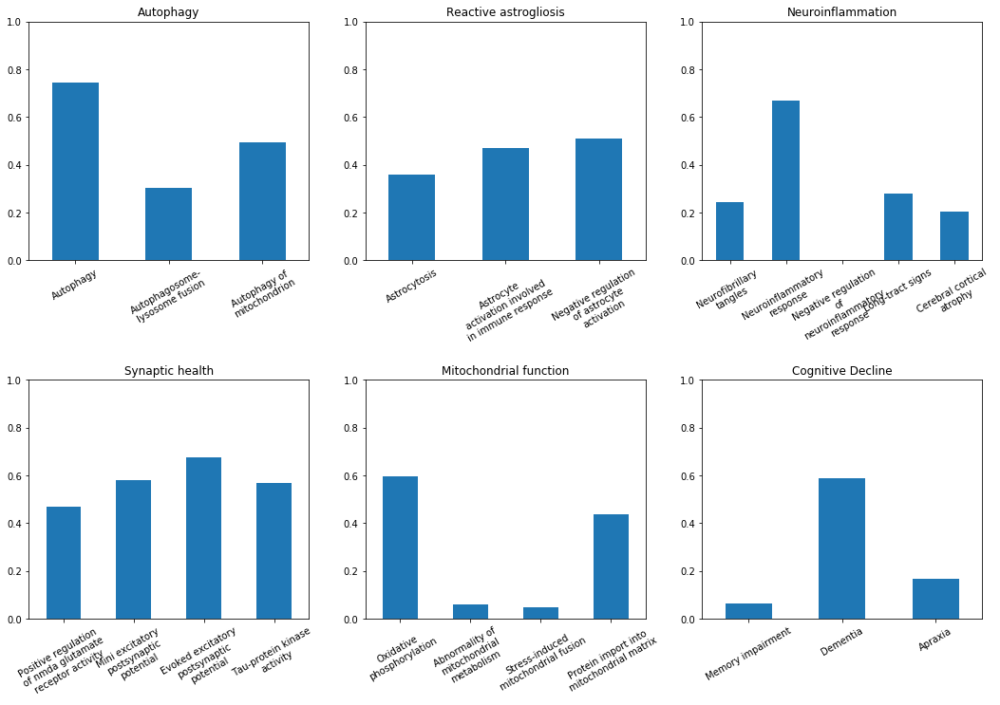

In [141]:
idx = 1

row = 2
col = (len(cats) // 2)

fig, ax = plt.subplots(row, col)
fig.set_size_inches(6*col, 4*row+3)

name = probs.loc[idx, 'cid']
prob = probs.loc[idx, 'proba']

gene_info = pd.read_csv(gene_dir.joinpath(name.replace(' ', '_') + '_tgt_genes.csv'))

#plt.suptitle('Report for {}: {:0.3}'.format(name, prob), size=16)
plt.subplots_adjust(top=.92, hspace=.5)

for i, (cat, vals) in enumerate(cats.items()):
    
    gene_vals = gene_info.set_index('node_name').reindex(columns=[v + '_metric' for v in vals])
    # genes = gene_vals[gene_vals > gene_cutoff].stack().index
    # if type(genes) == pd.MultiIndex:
    #     genes = [g[0] for g in genes.tolist()]
    # else:
    #     genes = genes.tolist()
        
    # genes = prep_node_labels(', '.join(genes), 40)
    
    sub = (i%row, i%col)
    ax[sub].set_title(cat)
    probs.loc[idx].reindex([v+'_proba' for v in vals]).plot(kind='bar', ax=ax[sub])
    ax[sub].set_ylim(0, 1)
    #ax[sub].text(.1, .85, genes, transform=ax[sub].transAxes)
    
    
    names = [prep_node_labels(v.replace('_', ' ').capitalize(), 20) for v in vals]
    
    ax[sub].set_xticklabels(names, rotation=30)
    

plt.savefig('full.png')

In [177]:
name = probs.loc[idx, 'cid']
gene_info = pd.read_csv(gene_dir.joinpath(name.replace(' ', '_') + '_tgt_genes.csv'))

out_dat = dict()

for i, (cat, vals) in enumerate(cats.items()):
    
    gene_vals = gene_info.set_index('node_name').reindex(columns=[v + '_metric' for v in vals])
    
    
    genes = (gene_vals[gene_vals > gene_cutoff].stack()
                                               .sort_values(ascending=False)
                                               .reset_index()
                                               .drop_duplicates(['node_name'])['node_name']
                                               .tolist())
        
    genes = ', '.join(genes)
    
    out_dat[cat] = [genes]



,0
Autophagy,
Mitochondrial function,
Neuroinflammation,ADCY1
Synaptic health,"BRSK1, PINK1"
Reactive astrogliosis,"ITGB1, MAPK1, ITGA2, LRP1, GFAP, MAPK3, TNFRSF..."
Cognitive Decline,"CP, AHR, ABAT, ALDH3B1, KL, ALDH2, OSTN, BCHE,..."


In [143]:
for k, v in out_dat.items():
    print(', '.join(v))



ADCY1
BRSK1, PINK1
ITGB1, MAPK1, ITGA2, LRP1, GFAP, MAPK3, TNFRSF21, ITGA5, KCNK3
CP, AHR, ABAT, ALDH3B1, KL, ALDH2, OSTN, BCHE, VEGFA, INS, NPY, CYP2A7, PINK1, BCL2, ERBIN, PTEN


In [214]:
pdf = FPDF(orientation='P', unit='in', format='letter')
pdf.add_page()

pdf.set_xy(0, 0)
pdf.set_font('arial', 'B', 18)
pdf.cell(0.5)
pdf.cell(7.5, h=.8, txt=name.title(), ln=1, align='L')
pdf.cell(3.5, .4, " ", 0, 2, 'C')

headers = ['Treatment Probability', '# of Gene interactions', '# of other Diseases Treated']
values = ['{:1.3f}'.format(prob), '{:,}'.format(n_genes), '{:,}'.format(n_treats)]


for header, val in zip(headers, values):
    pdf.set_font('arial', 'B', 12)
    pdf.cell(2.9, .4, header, 1, 0, 'L')
    pdf.set_font('arial', '', 12)
    pdf.cell(.85, .4, val, 1, 1, 'R')

# Bottom picture before top, so top can overlap some whitespace from bottom...
pdf.set_xy(.4, 3)
pdf.image('full.png', w = 7, h = 0, type = '', link = '')

pdf.set_xy(4.75, 0)
pdf.image('rad.png', w = 3.25, h = 0, type = '', link = '')

# Reset the pointer
pdf.set_xy(.4, 7.25)

pdf.set_font('arial', '', 14)
pdf.cell(7.5, h=.4, txt='Significant Gene Interactions', ln=1, align='C')

for k, v in out_dat.items():
    val =  prep_node_labels(', '.join(v), 60).split('\n')
    h_val = .25
    
    h = len(val) * h_val
    
    pdf.set_font('arial', 'B', 10)
    pdf.cell(2, h, k, 1, 0, 'L')
    
    pdf.set_font('arial', '', 10)
    pdf.cell(5.5, h, '', 1, 0)
    pdf.cell(-5.5)
    for value in val[:-1]:
        pdf.cell(5.5, h_val, value, 0, 2, 'L')
    else:
        pdf.cell(5.5, h_val, val[-1], 0, 1, 'L')
        

    
pdf.output('test.pdf', 'F')

''

In [188]:
b = ['1']
for a in b[:-1]:
    print(a)
else:
    print(b[-1])

1


In [157]:
pdf = FPDF()
pdf.add_page()
pdf.set_xy(0, 0)
pdf.set_font('arial', 'B', 12)
pdf.cell(60)
pdf.cell(75, 10, "A Test Report for the compund and disease in question", 0, 2, 'C')
pdf.cell(90, 10, " ", 0, 2, 'C')
pdf.cell(-40)
pdf.cell(50, 10, 'Chemical', 1, 0, 'C')
pdf.cell(40, 10, 'Identifier', 1, 0, 'C')
pdf.cell(40, 10, 'Proba', 1, 2, 'C')
pdf.cell(-90)
pdf.set_font('arial', '', 12)
for i in range(0, len(probs.head(4))):
    pdf.cell(50, 10, '%s' % (probs['cid'].iloc[i]), 1, 0, 'C')
    pdf.cell(40, 10, '%s' % (str(probs['chemicalsubstance_id'].iloc[i])), 1, 0, 'C')
    pdf.cell(40, 10, '%s' % ('{:1.3f}'.format(probs['proba'].iloc[i])), 1, 2, 'C')
    pdf.cell(-90)
pdf.cell(90, 10, " ", 0, 2, 'C')
pdf.cell(-30)
pdf.output('test1.pdf', 'F')


''

## Write all the PDFs

In [ ]:
def draw_table(pdf, n_row, n_col, data, w, h, pos=(0, 0), bold='h'):
    # Catch an error with for leass data than cells
    if len(data) < n_row * n_col:
        pass
    
    # Bold horizontal or vertical
    assert bold in ['h', 'v', None]
    

    
    for i range(n_row):
        
    
    for d in data

/opt/mmayers/software/anaconda3/envs/ml/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app
/opt/mmayers/software/anaconda3/envs/ml/lib/python3.6/site-packages/ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<Figure size 432x432 with 0 Axes>

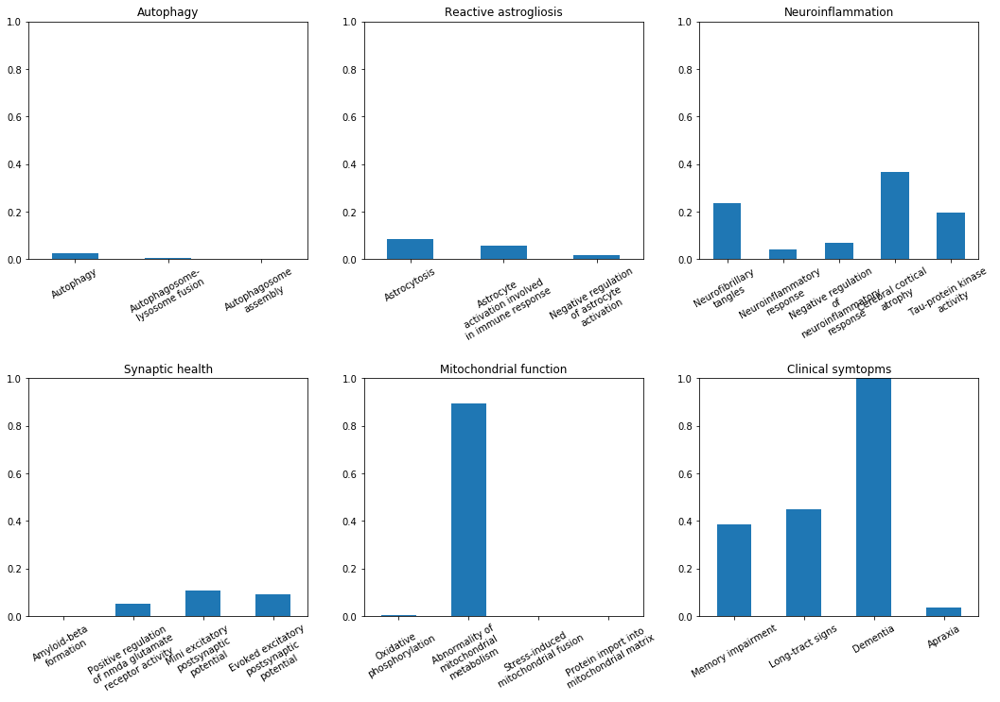

<Figure size 432x432 with 0 Axes>

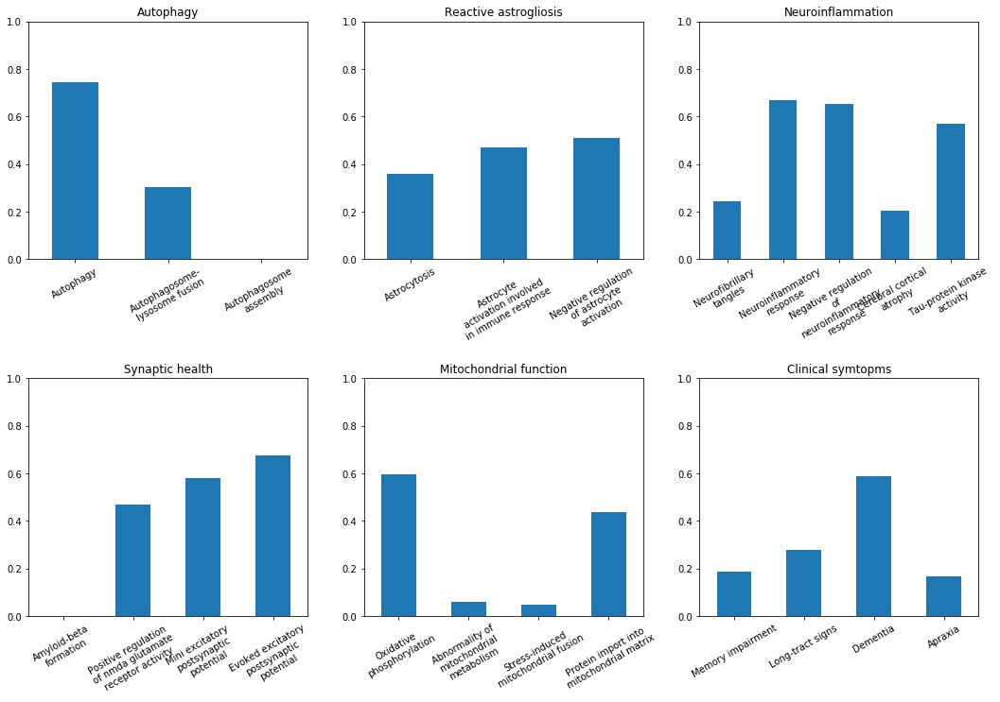

<Figure size 432x432 with 0 Axes>

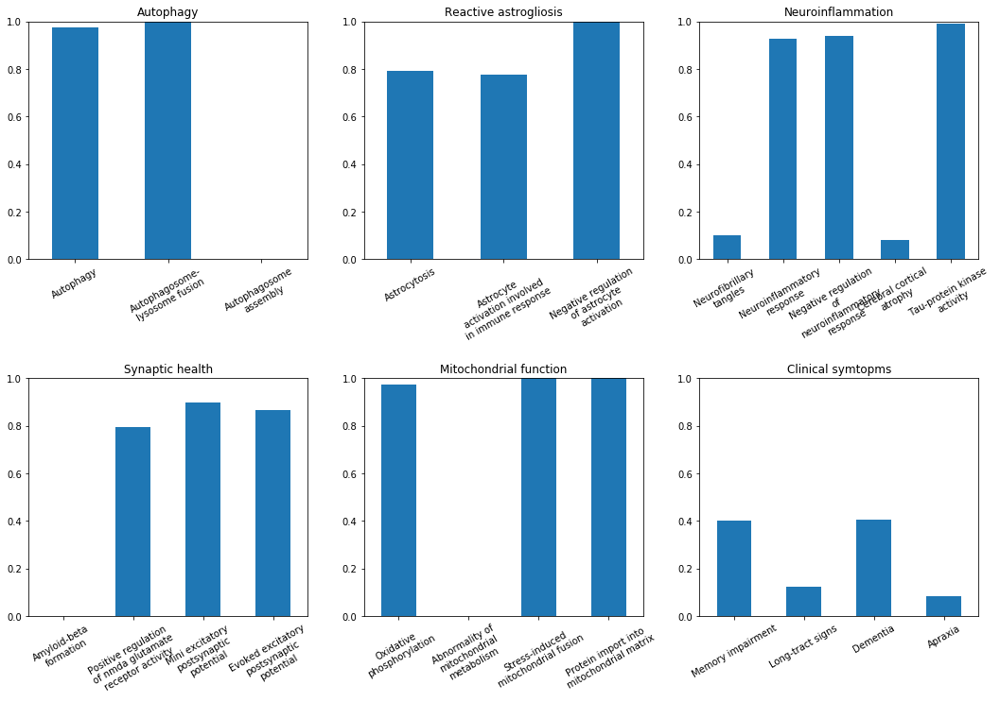

<Figure size 432x432 with 0 Axes>

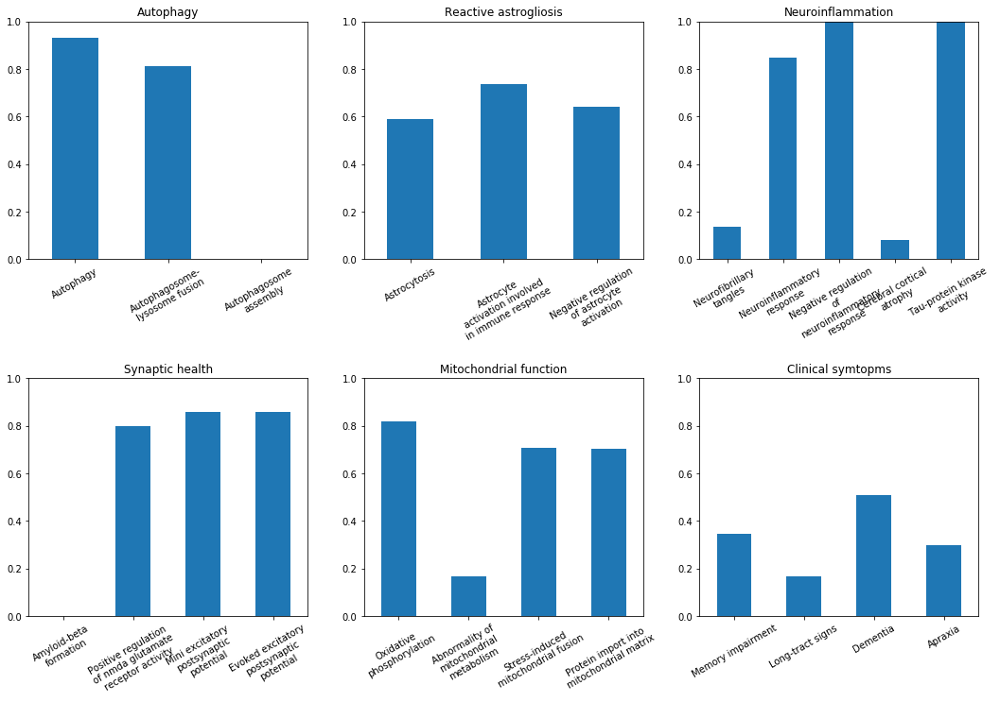

<Figure size 432x432 with 0 Axes>

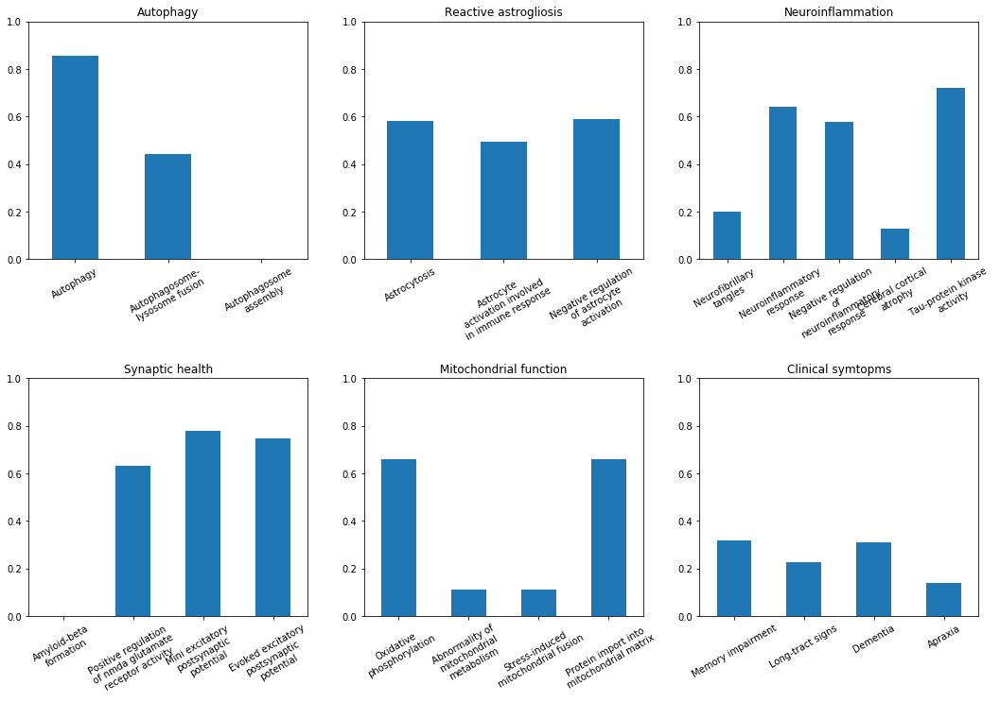

<Figure size 432x432 with 0 Axes>

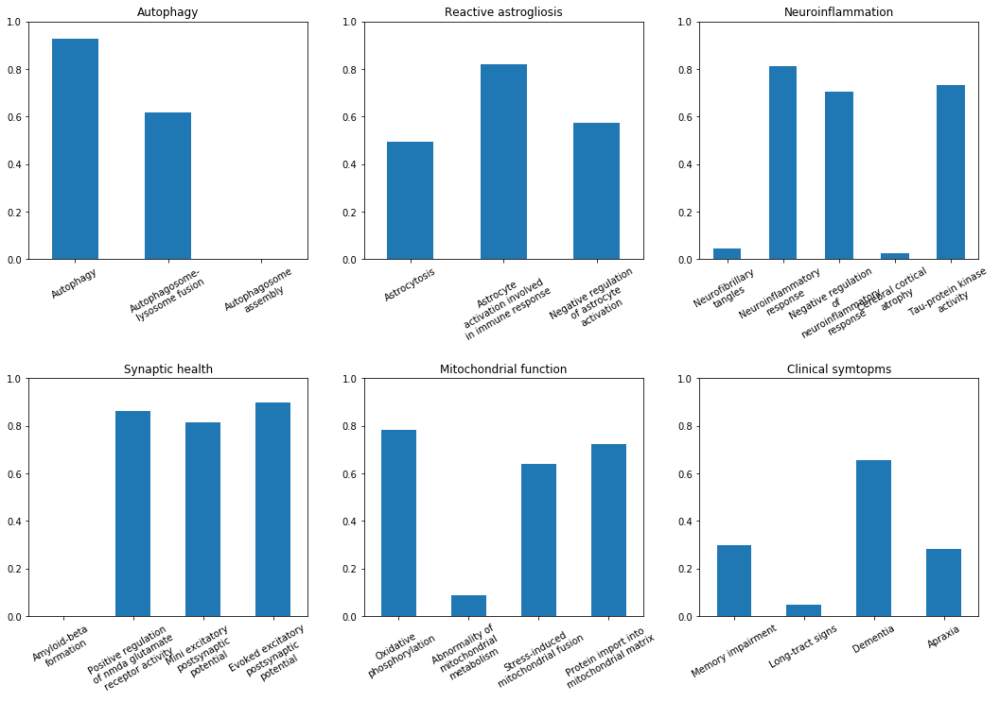

<Figure size 432x432 with 0 Axes>

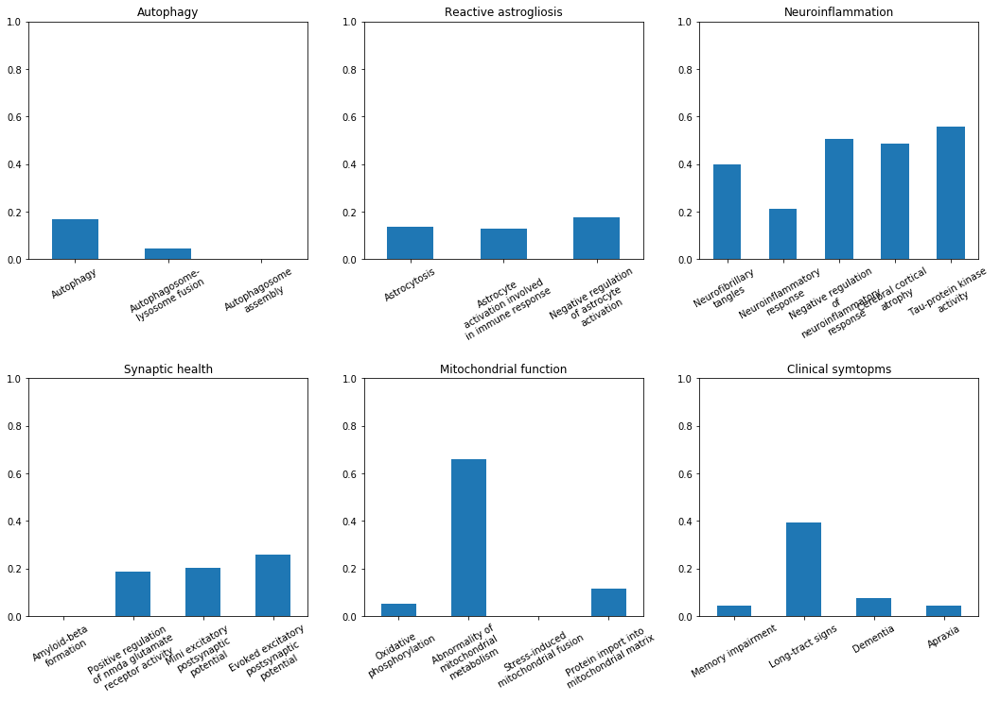

<Figure size 432x432 with 0 Axes>

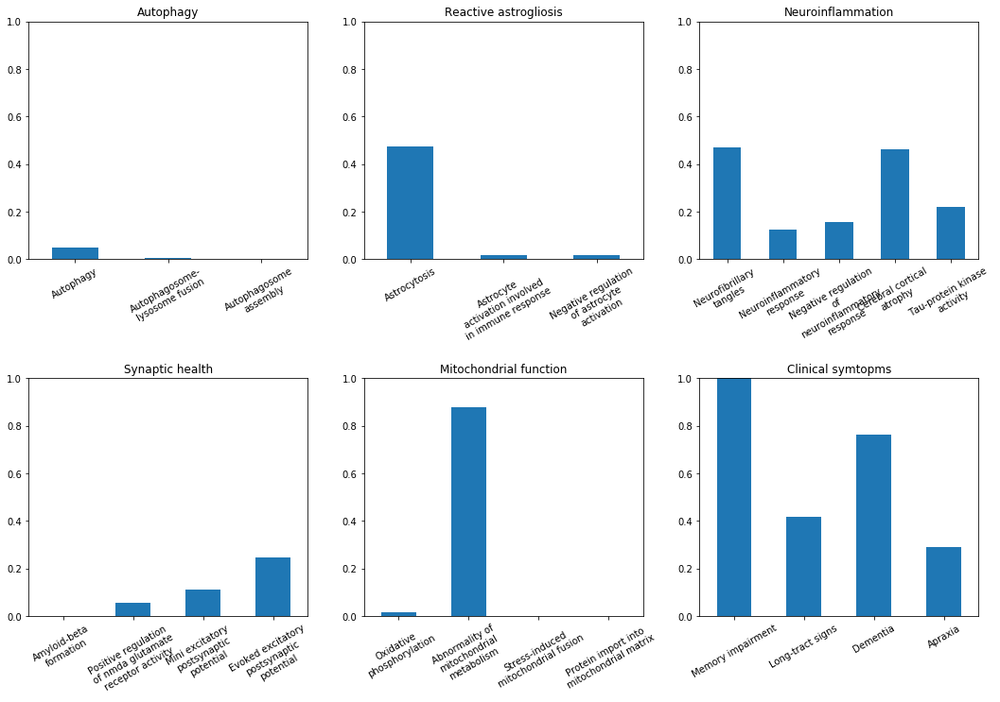

<Figure size 432x432 with 0 Axes>

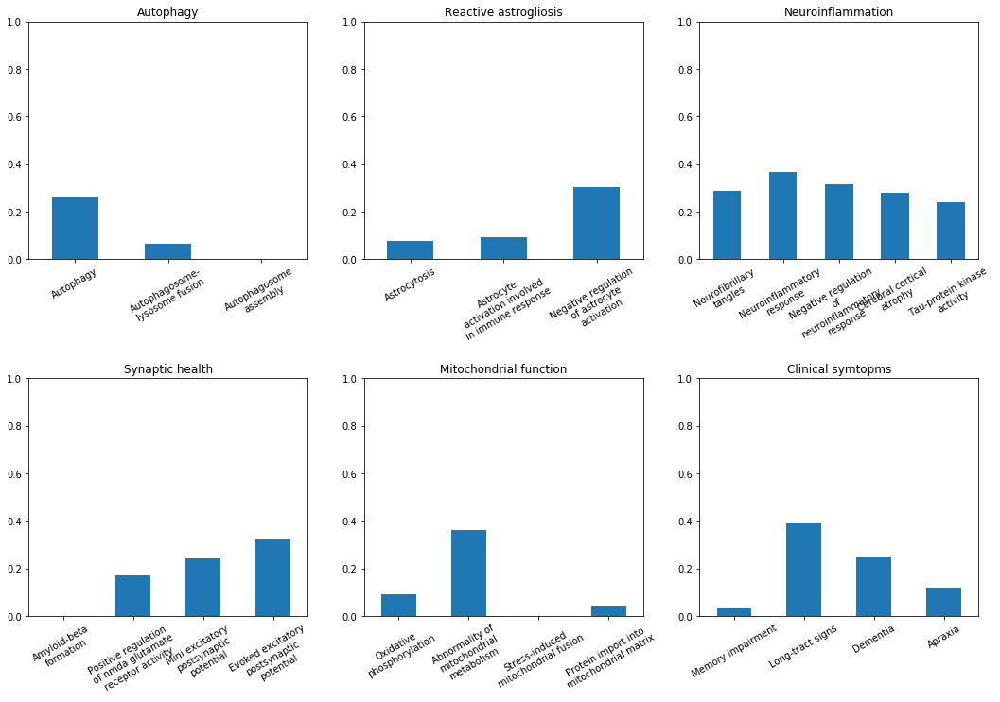

<Figure size 432x432 with 0 Axes>

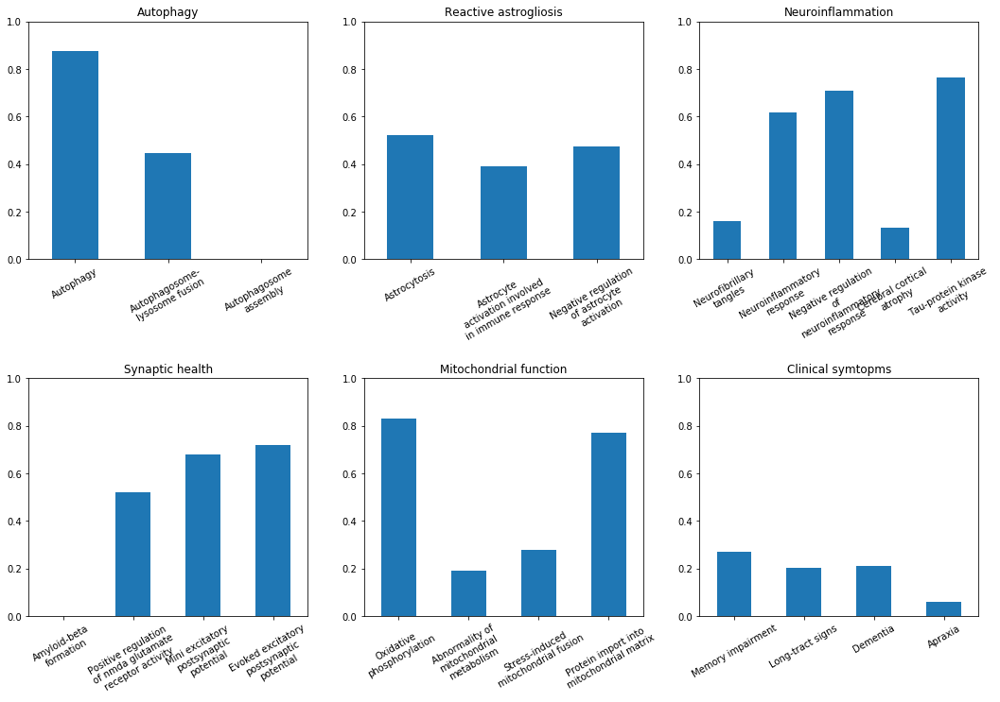

<Figure size 432x432 with 0 Axes>

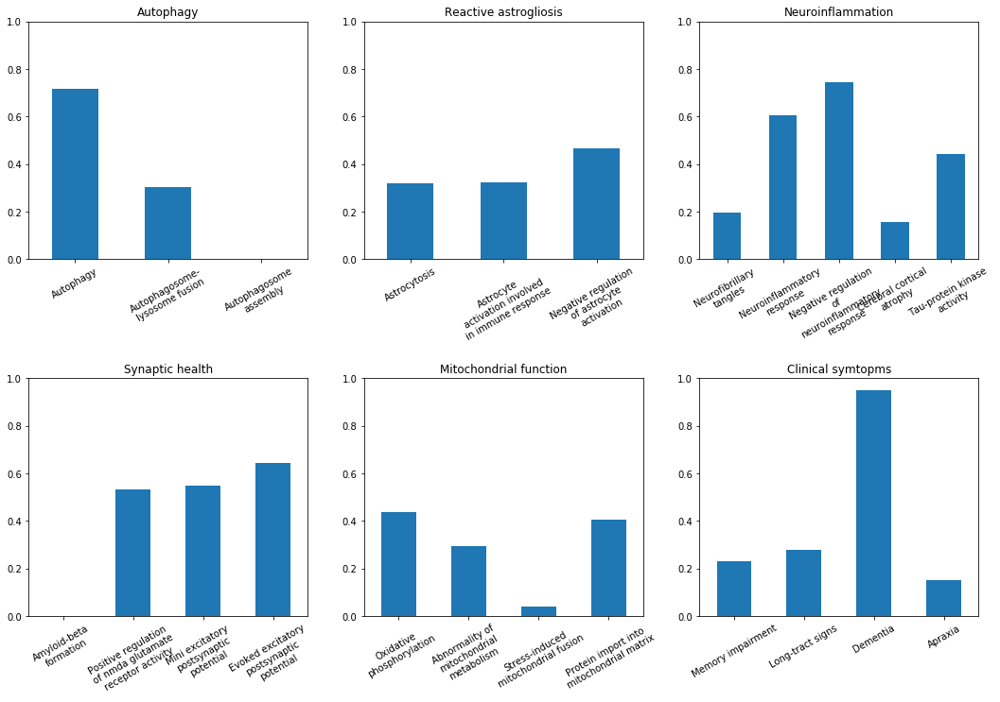

<Figure size 432x432 with 0 Axes>

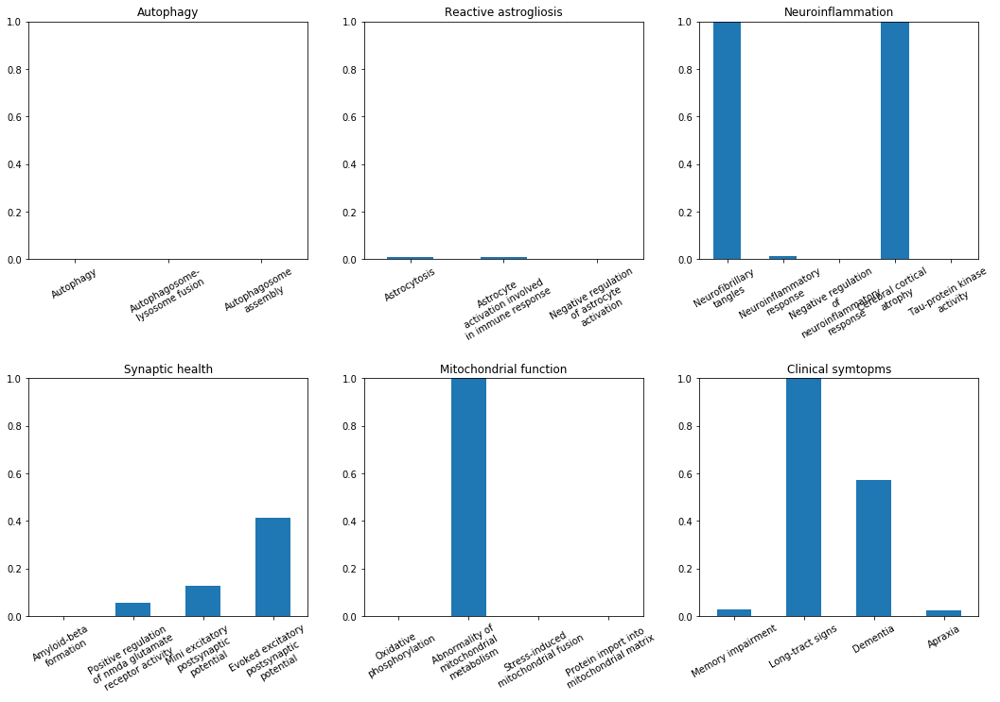

<Figure size 432x432 with 0 Axes>

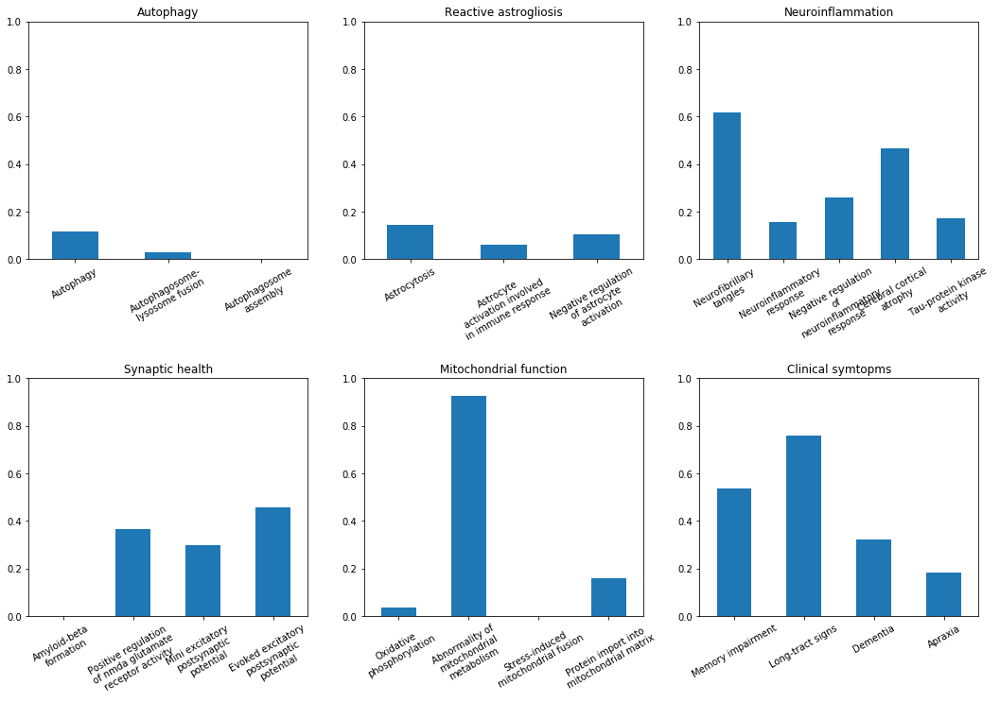

<Figure size 432x432 with 0 Axes>

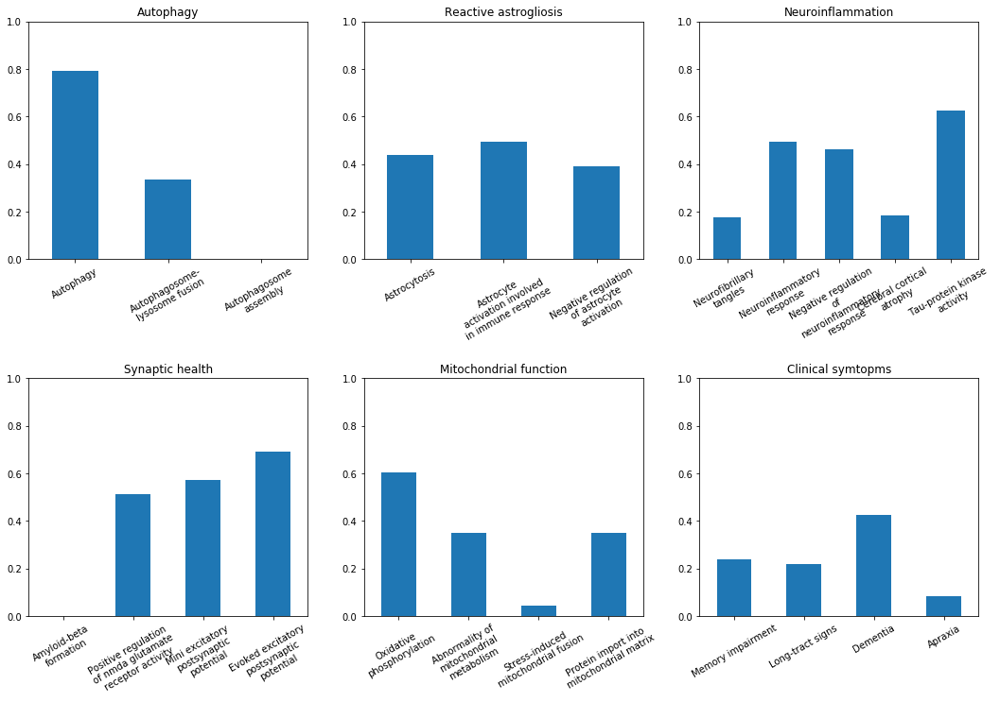

<Figure size 432x432 with 0 Axes>

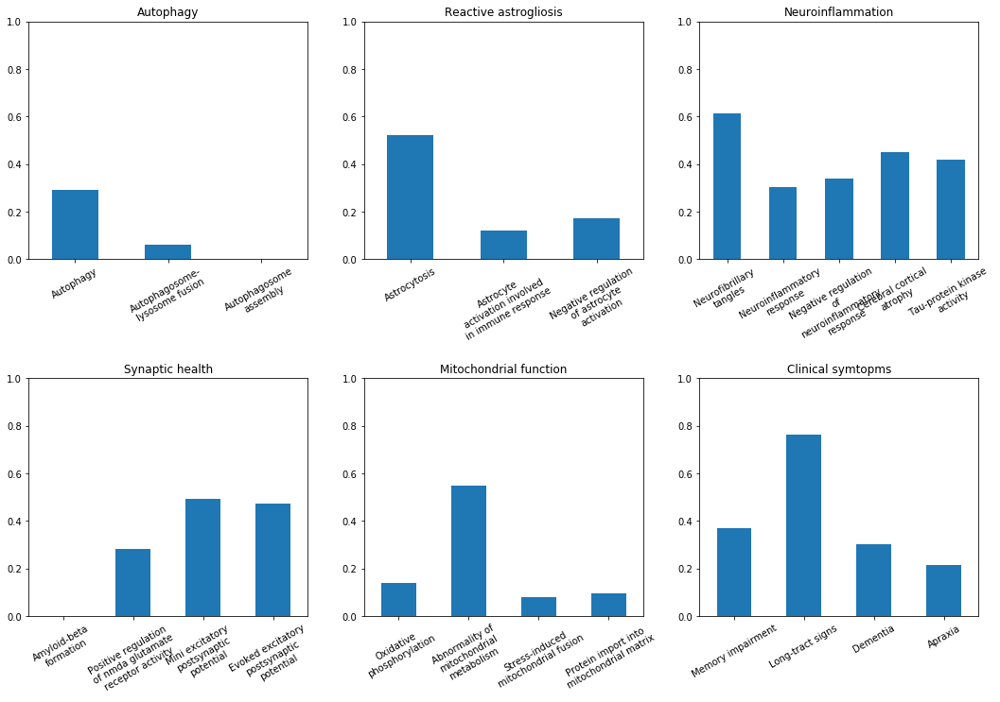

<Figure size 432x432 with 0 Axes>

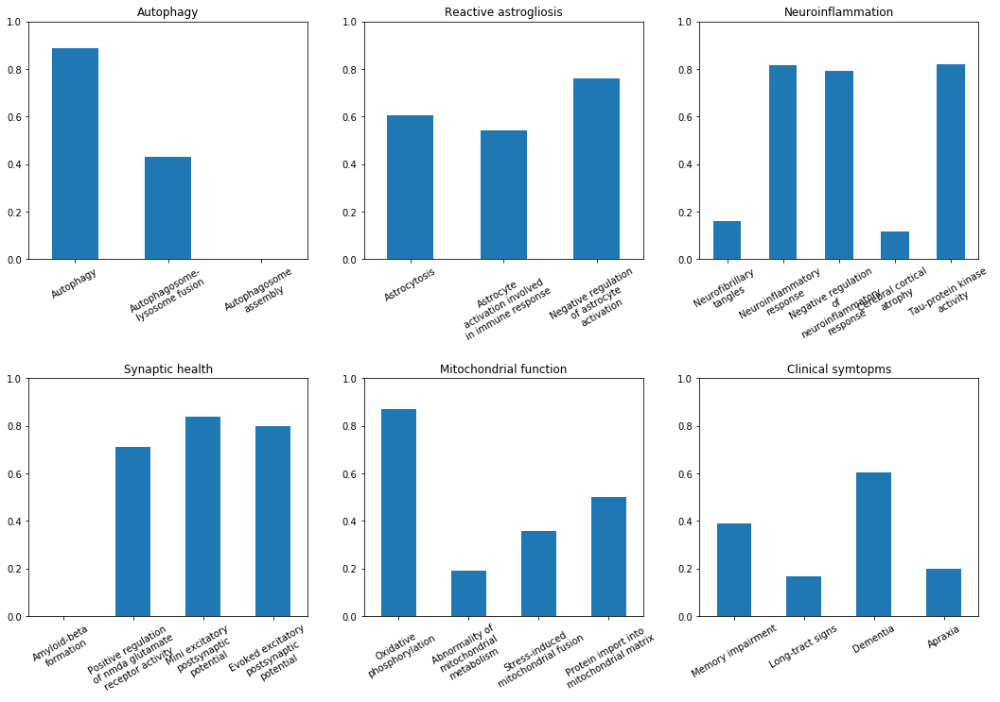

<Figure size 432x432 with 0 Axes>

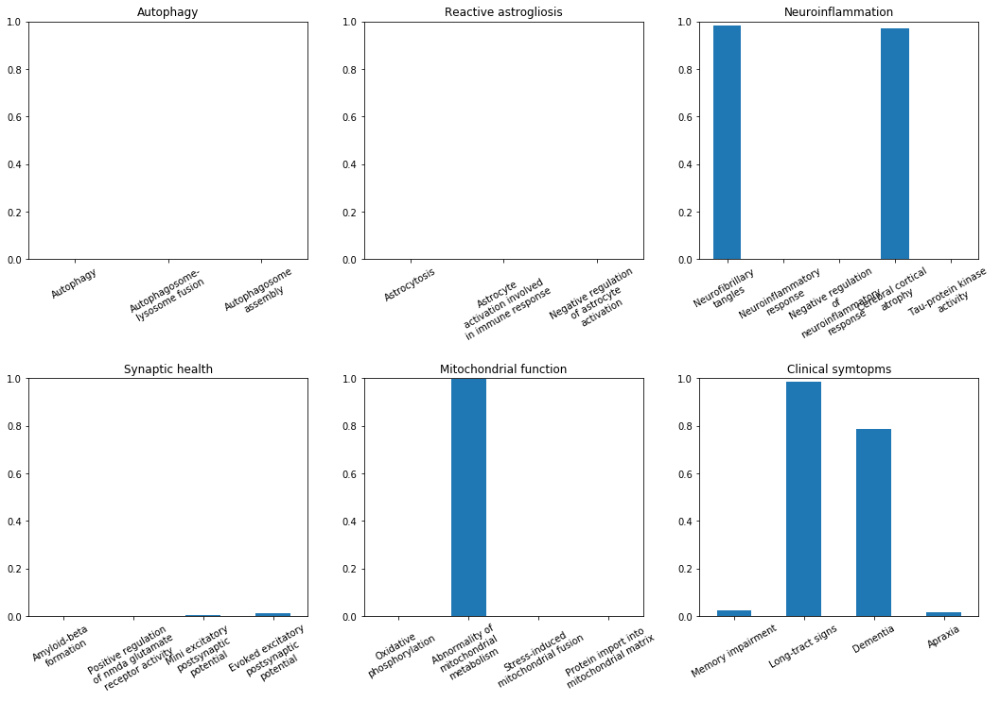

<Figure size 432x432 with 0 Axes>

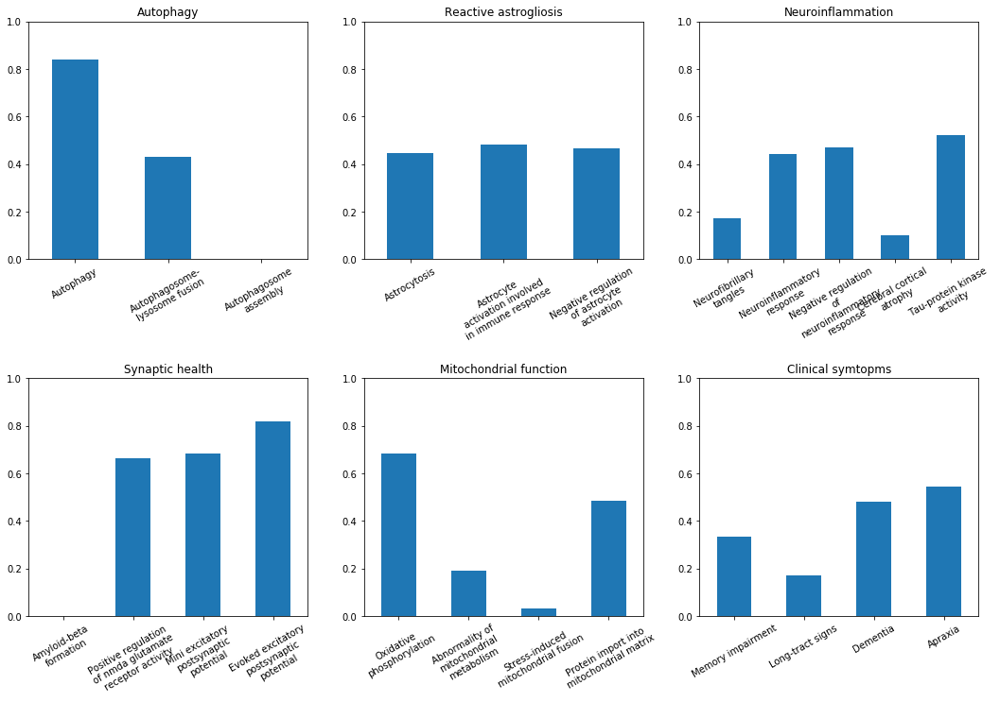

<Figure size 432x432 with 0 Axes>

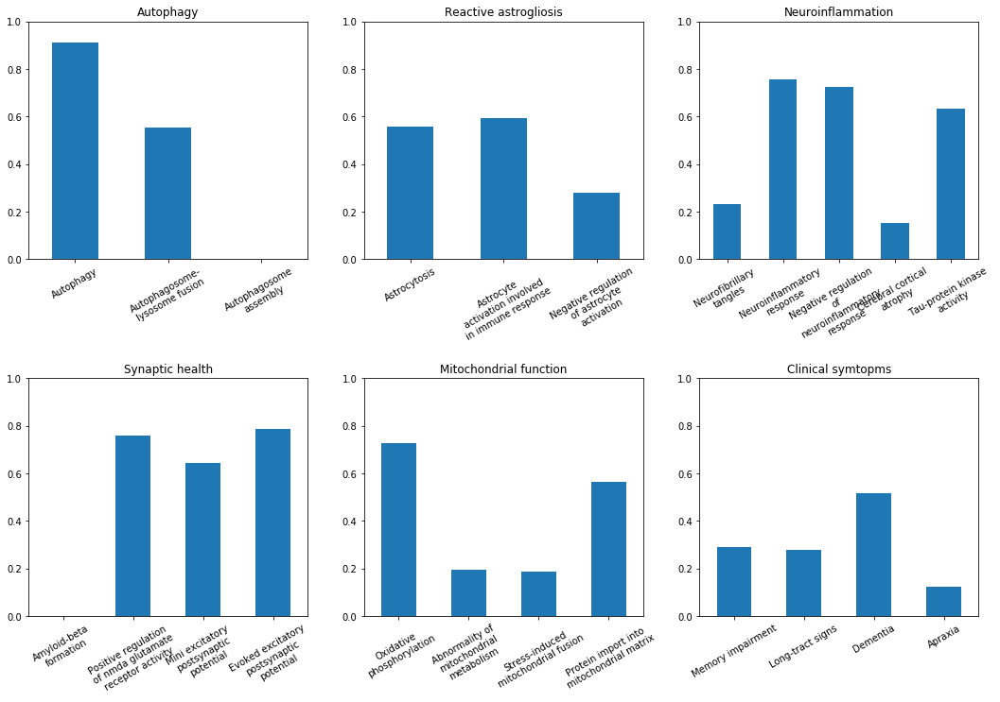

<Figure size 432x432 with 0 Axes>

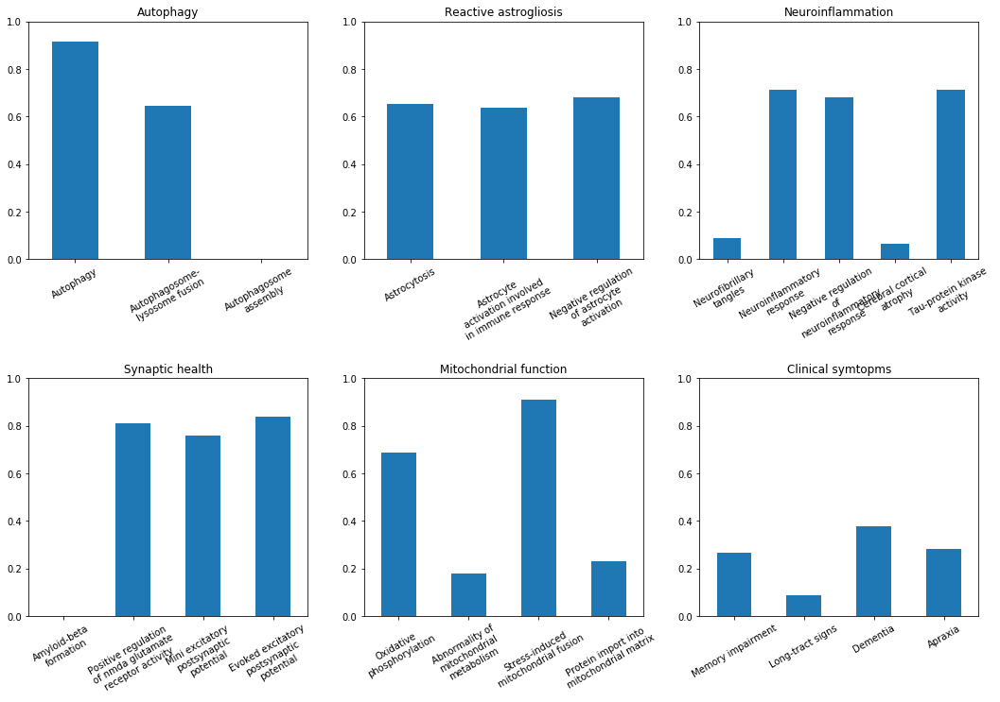

<Figure size 432x432 with 0 Axes>

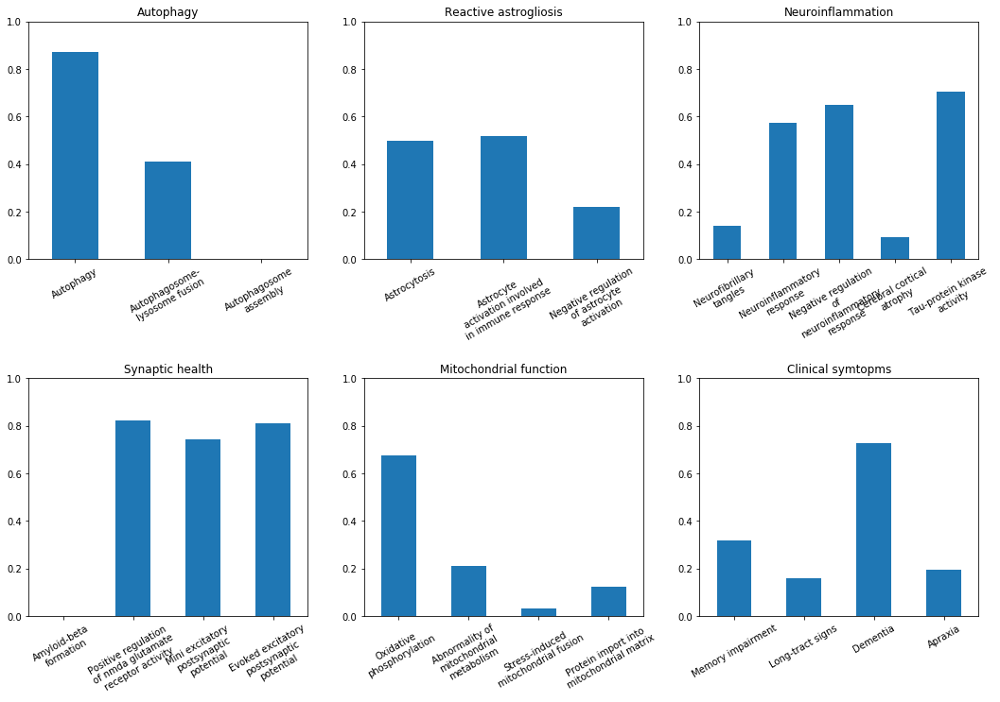

<Figure size 432x432 with 0 Axes>

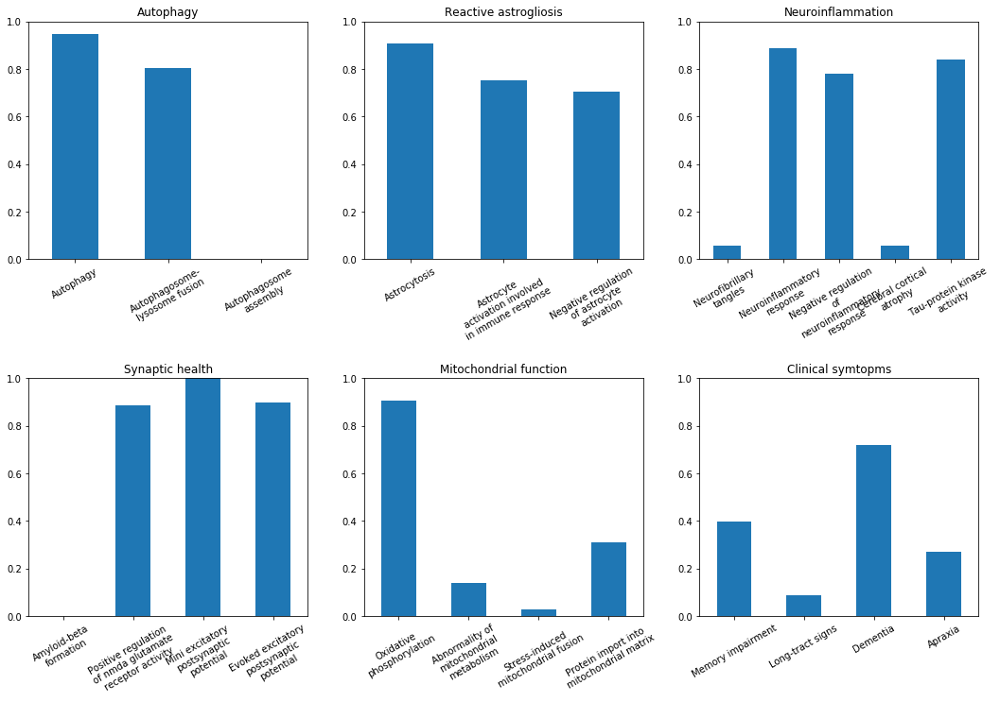

<Figure size 432x432 with 0 Axes>

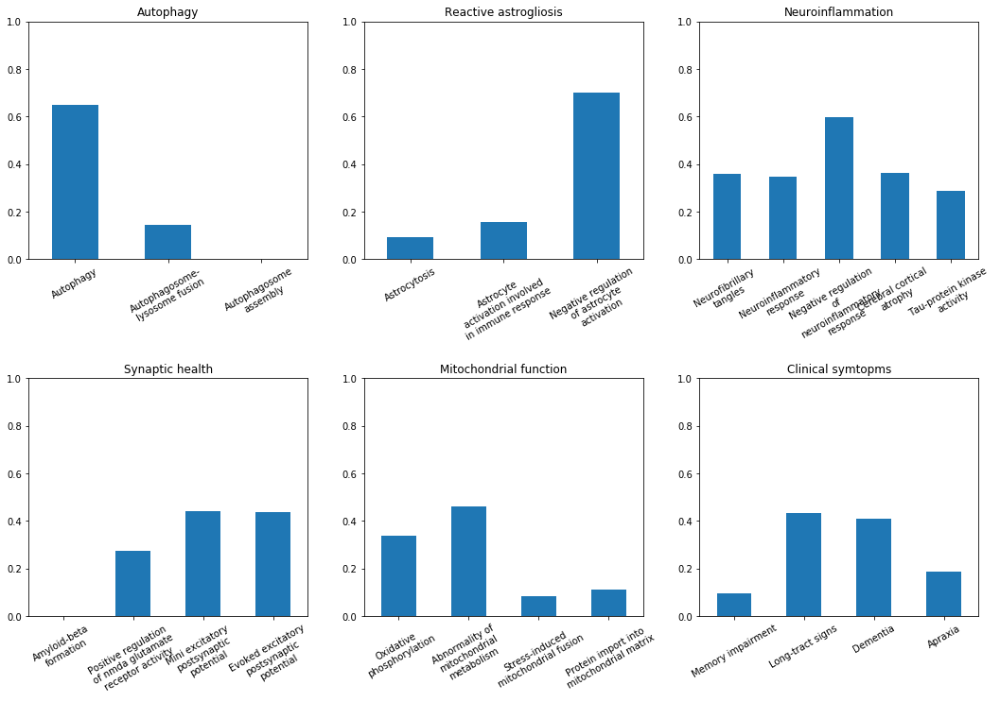

<Figure size 432x432 with 0 Axes>

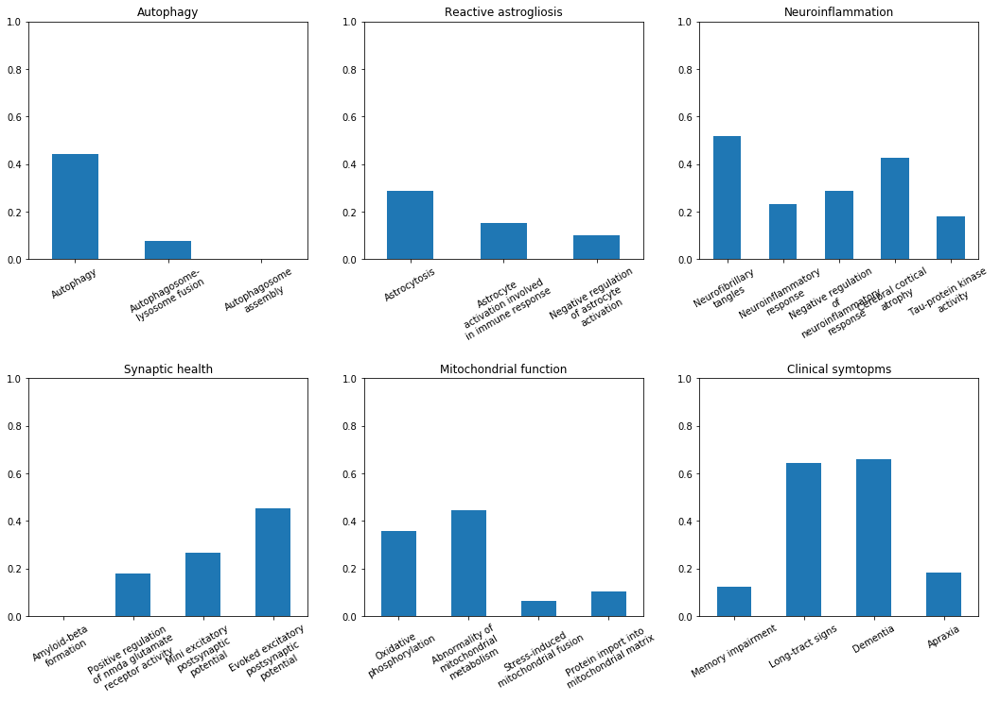

<Figure size 432x432 with 0 Axes>

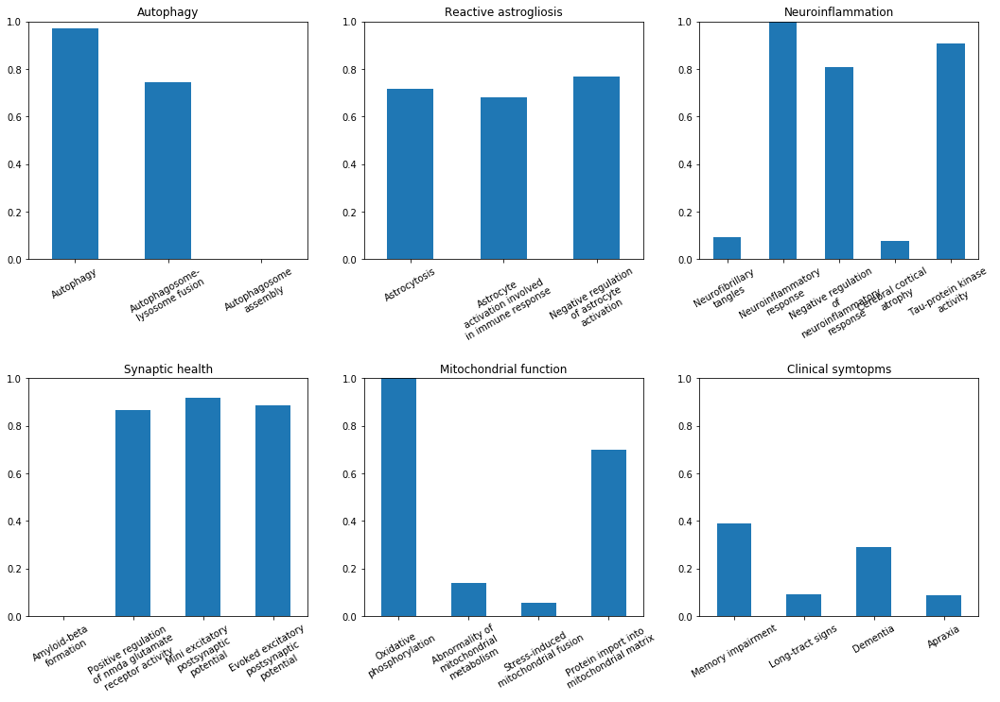

<Figure size 432x432 with 0 Axes>

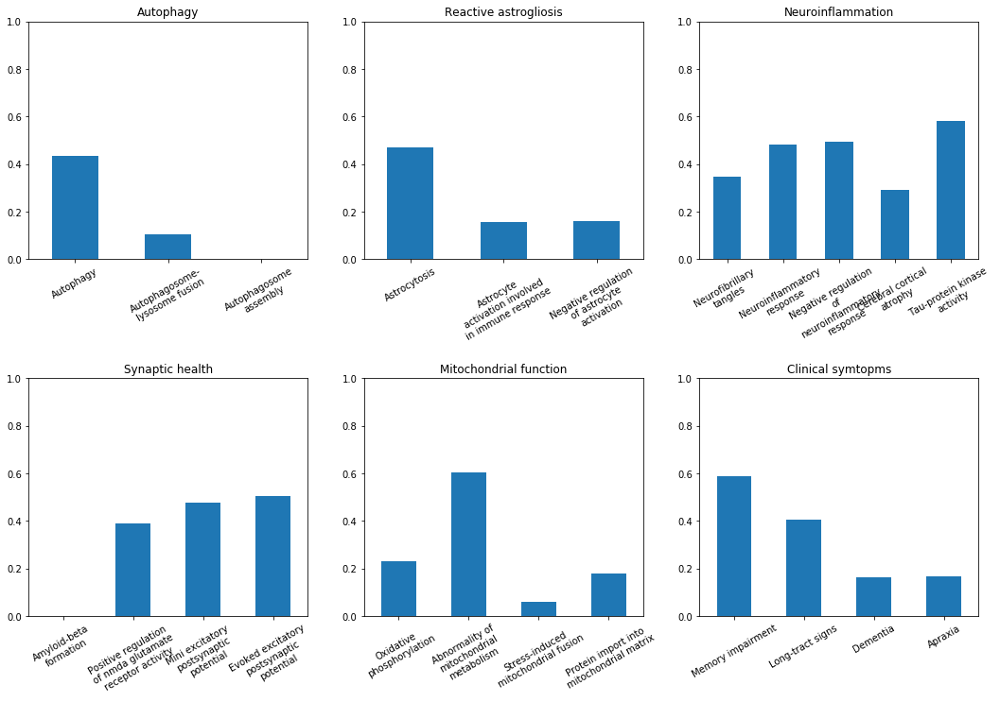

<Figure size 432x432 with 0 Axes>

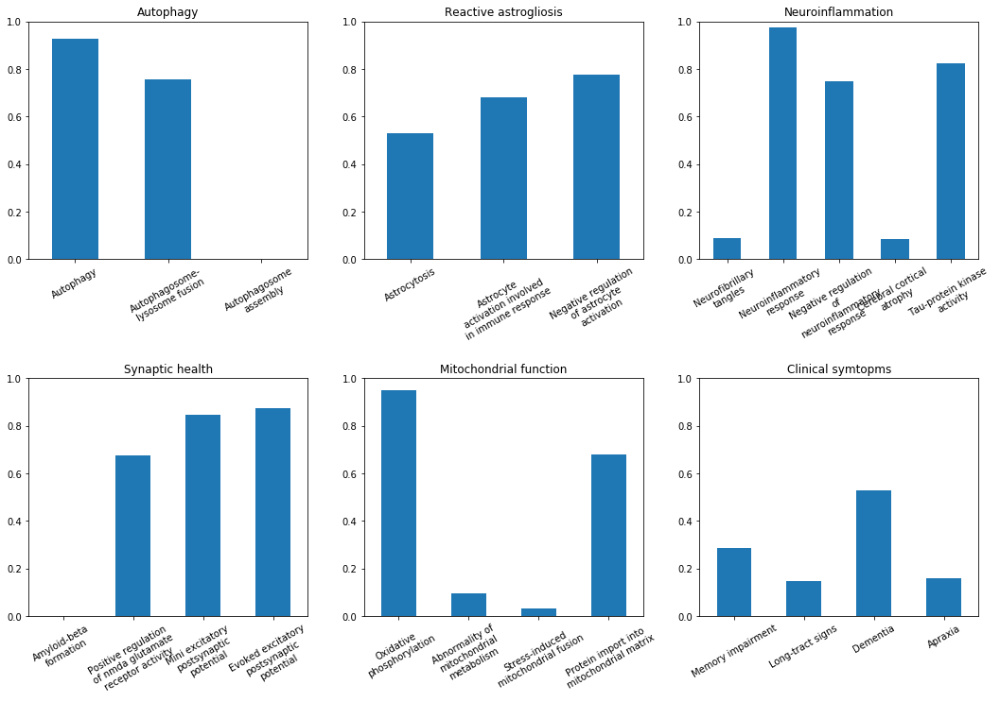

<Figure size 432x432 with 0 Axes>

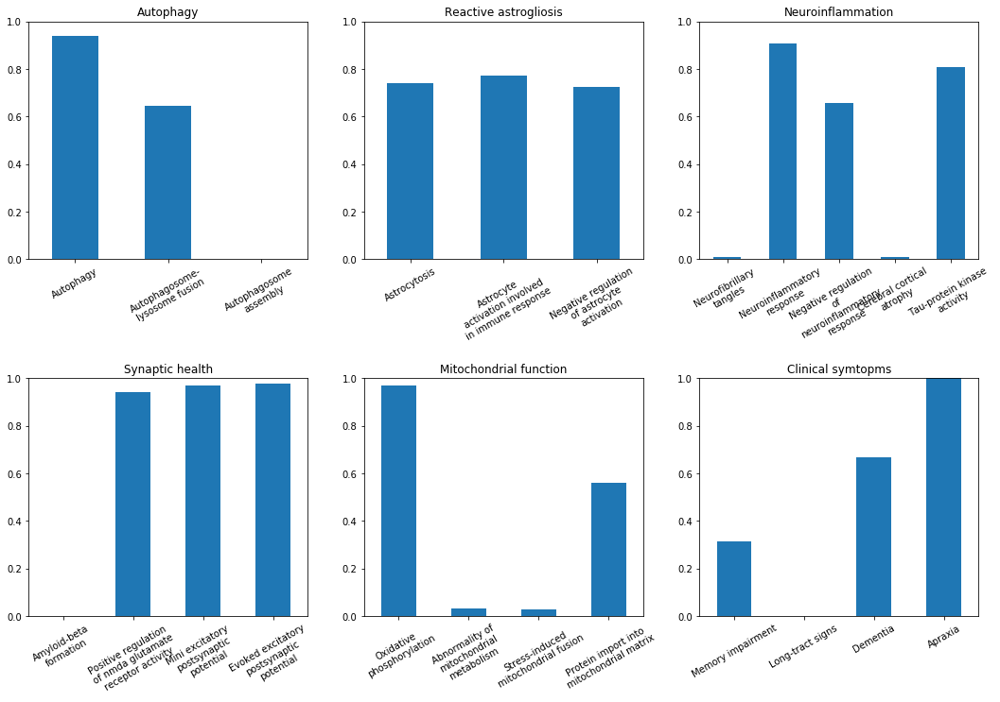

<Figure size 432x432 with 0 Axes>

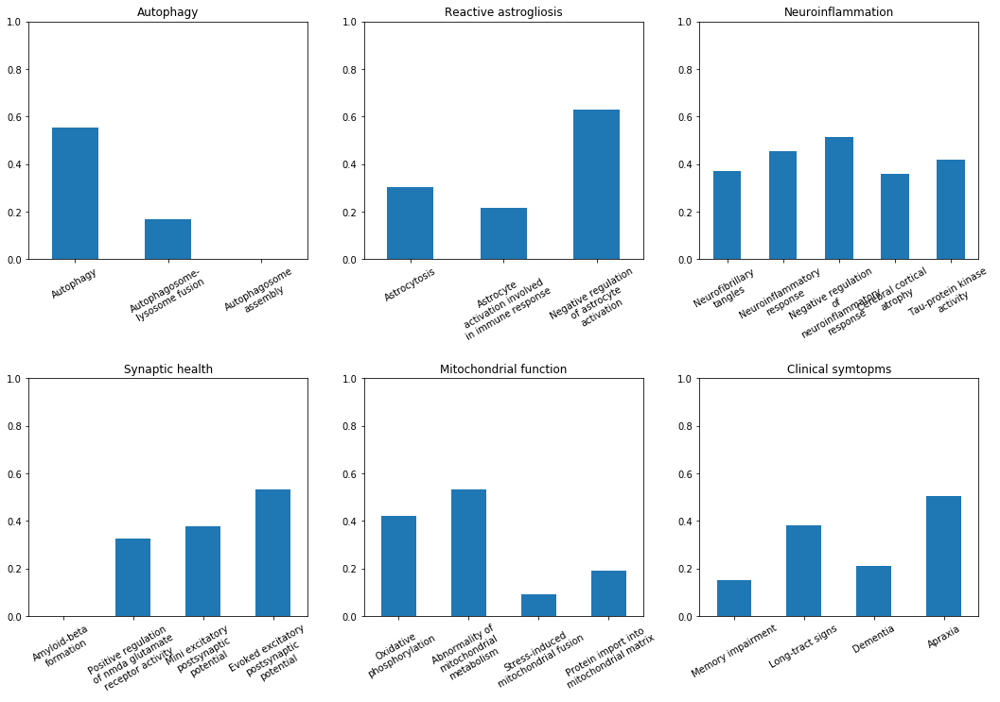

<Figure size 432x432 with 0 Axes>

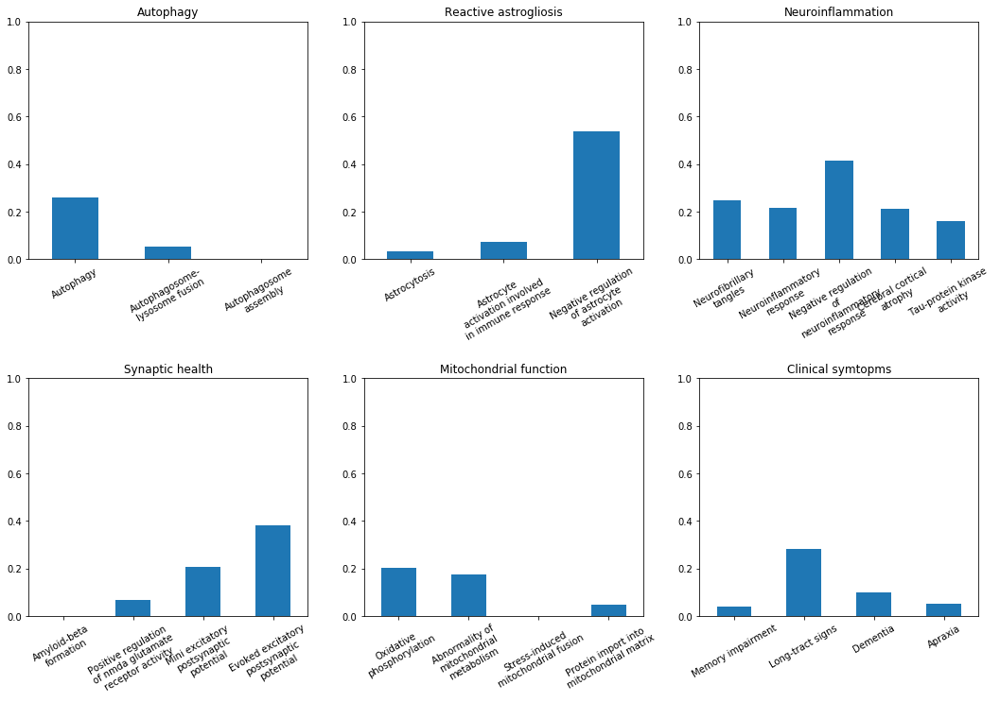

<Figure size 432x432 with 0 Axes>

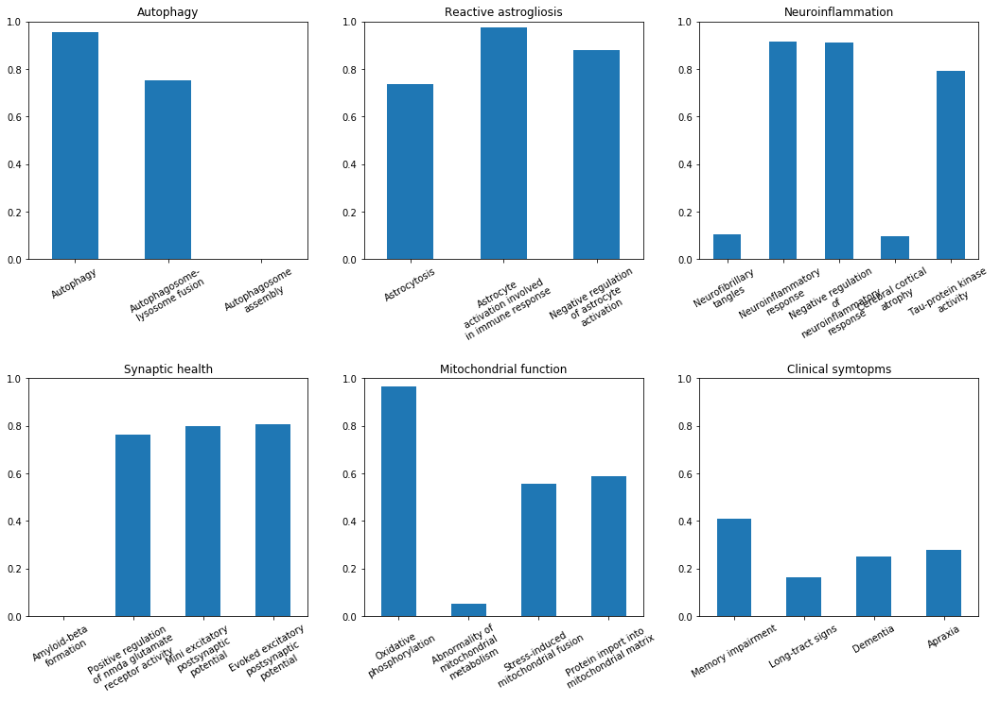

<Figure size 432x432 with 0 Axes>

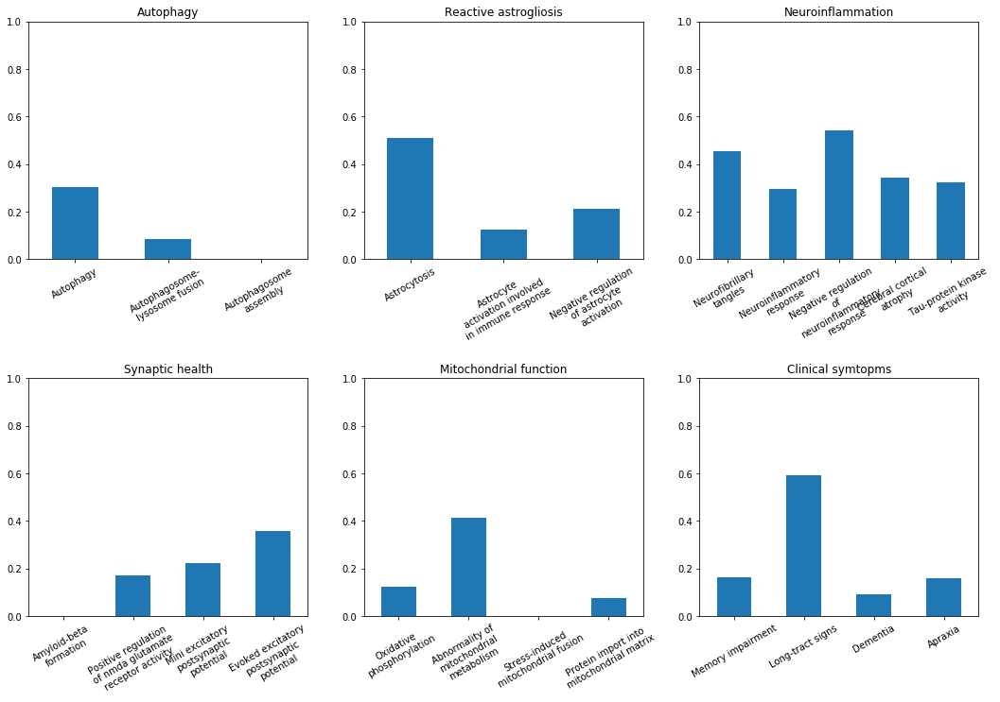

<Figure size 432x432 with 0 Axes>

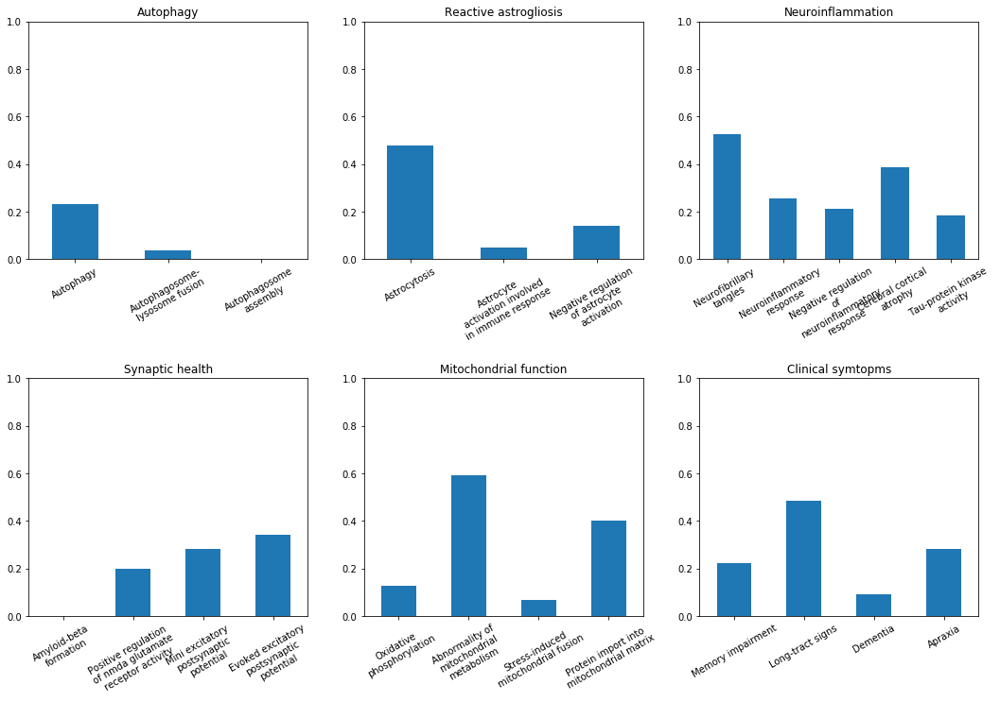

<Figure size 432x432 with 0 Axes>

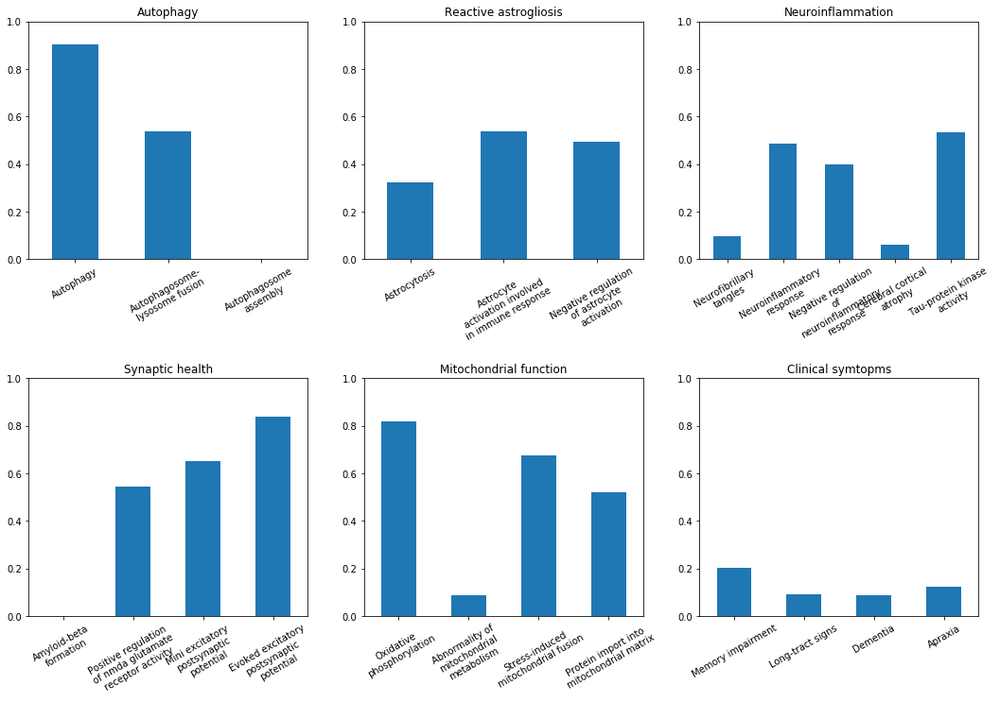

<Figure size 432x432 with 0 Axes>

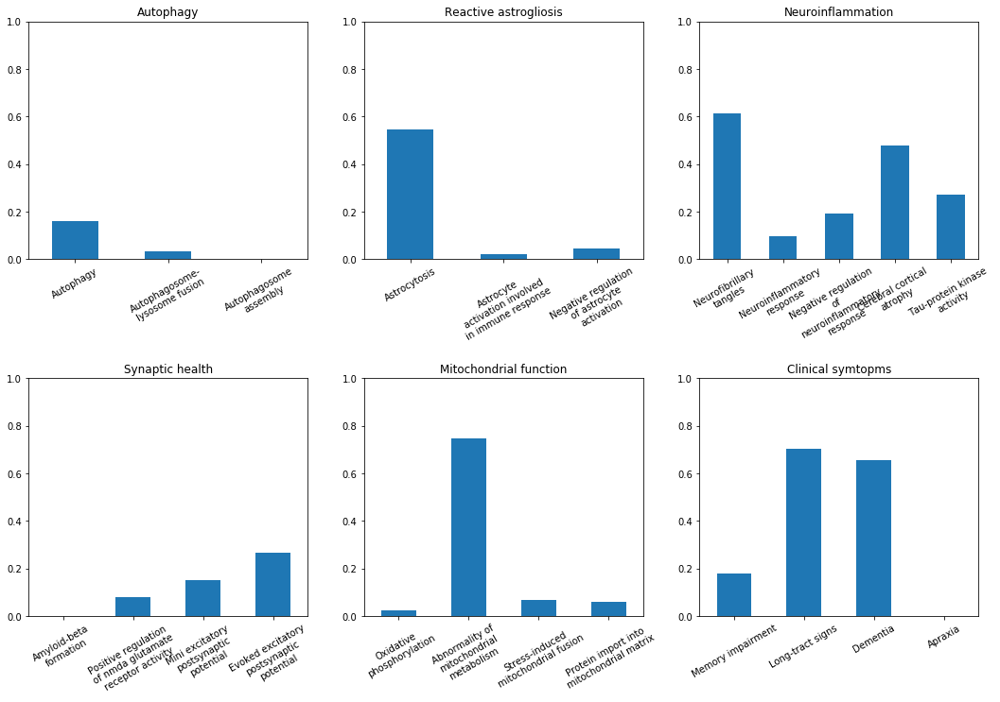

<Figure size 432x432 with 0 Axes>

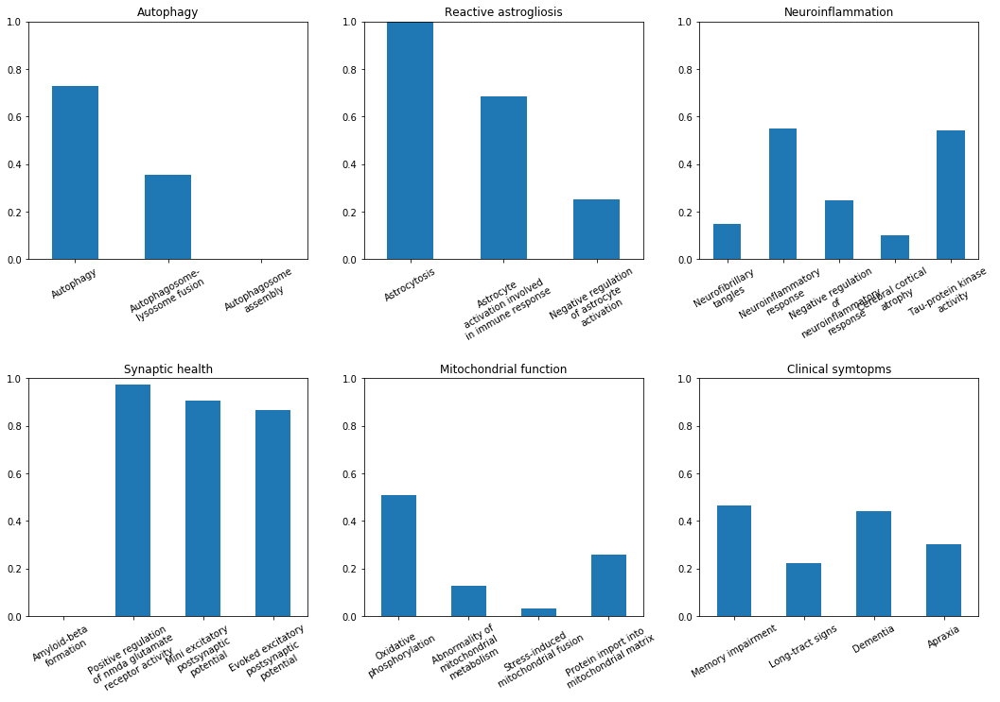

<Figure size 432x432 with 0 Axes>

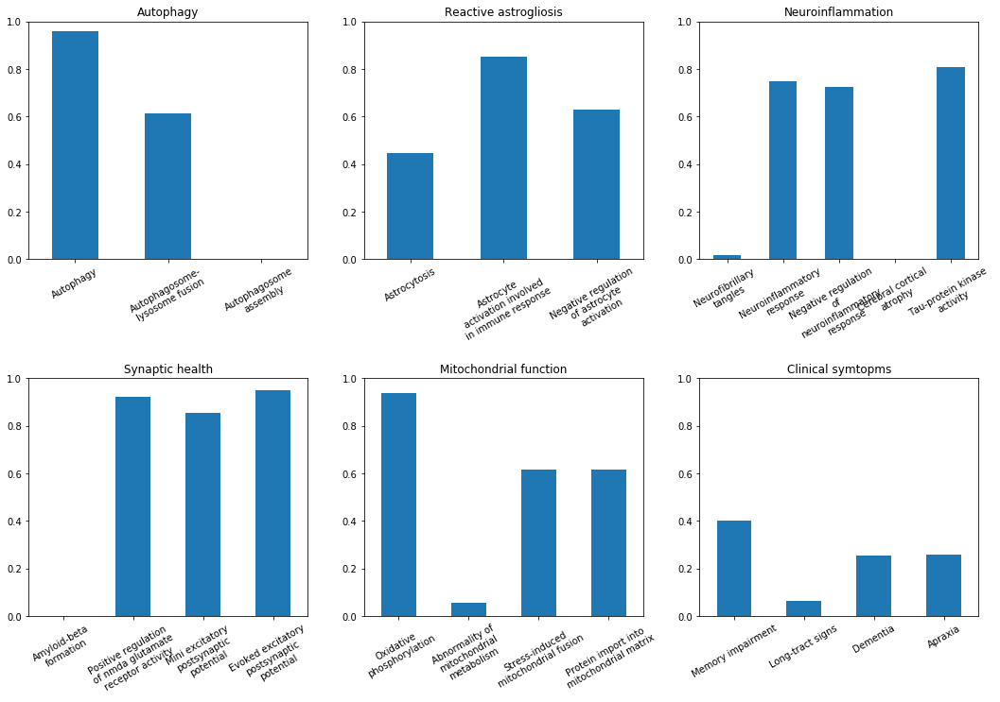

<Figure size 432x432 with 0 Axes>

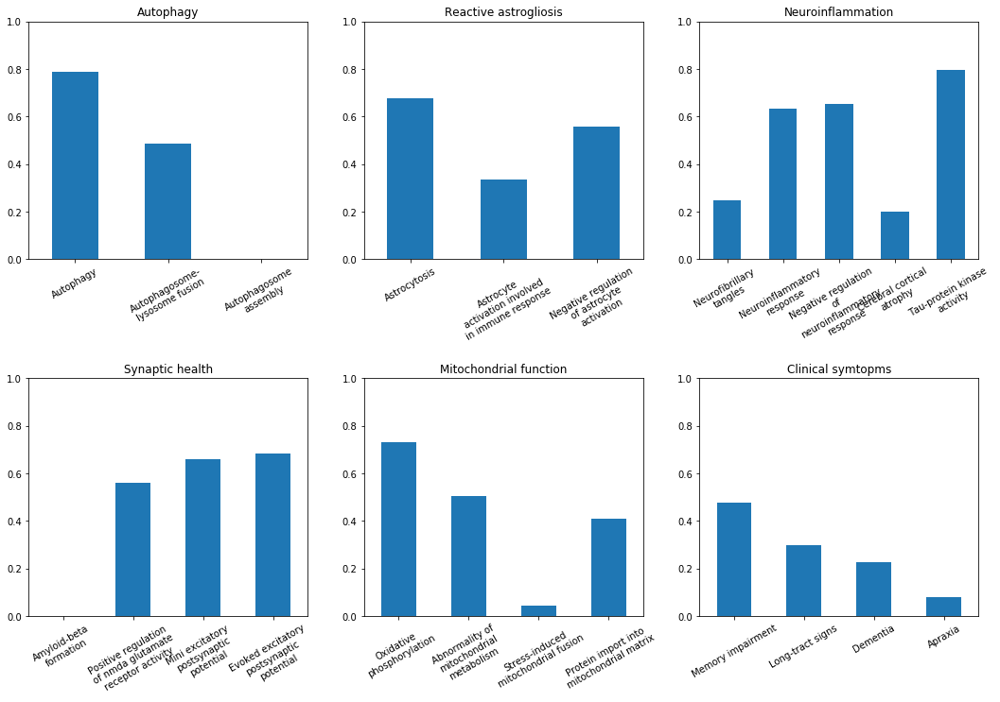

<Figure size 432x432 with 0 Axes>

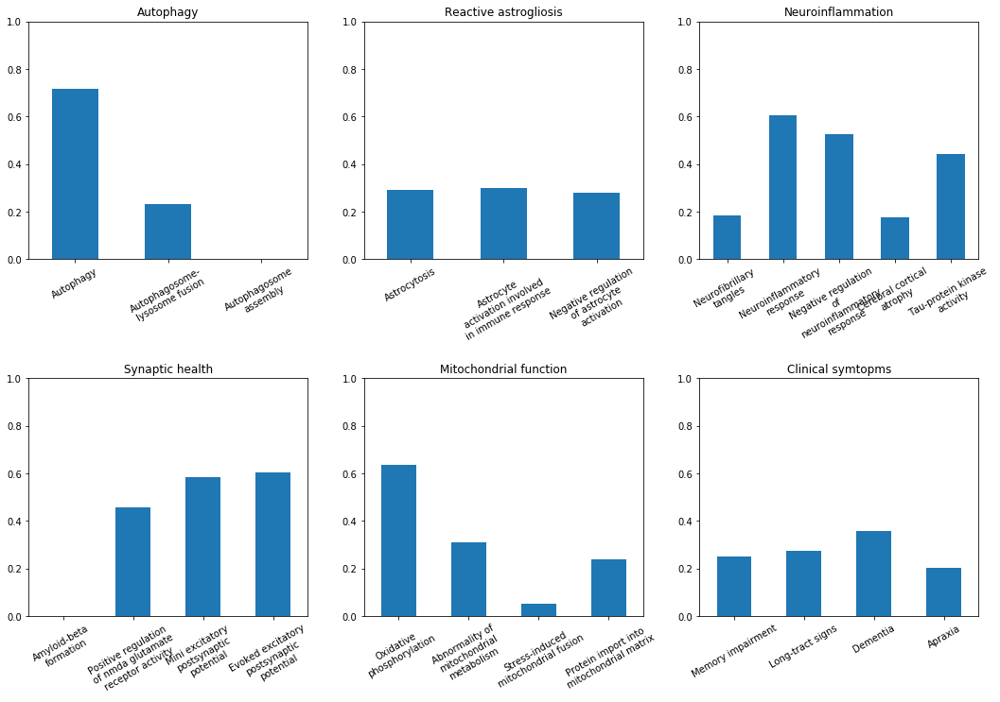

<Figure size 432x432 with 0 Axes>

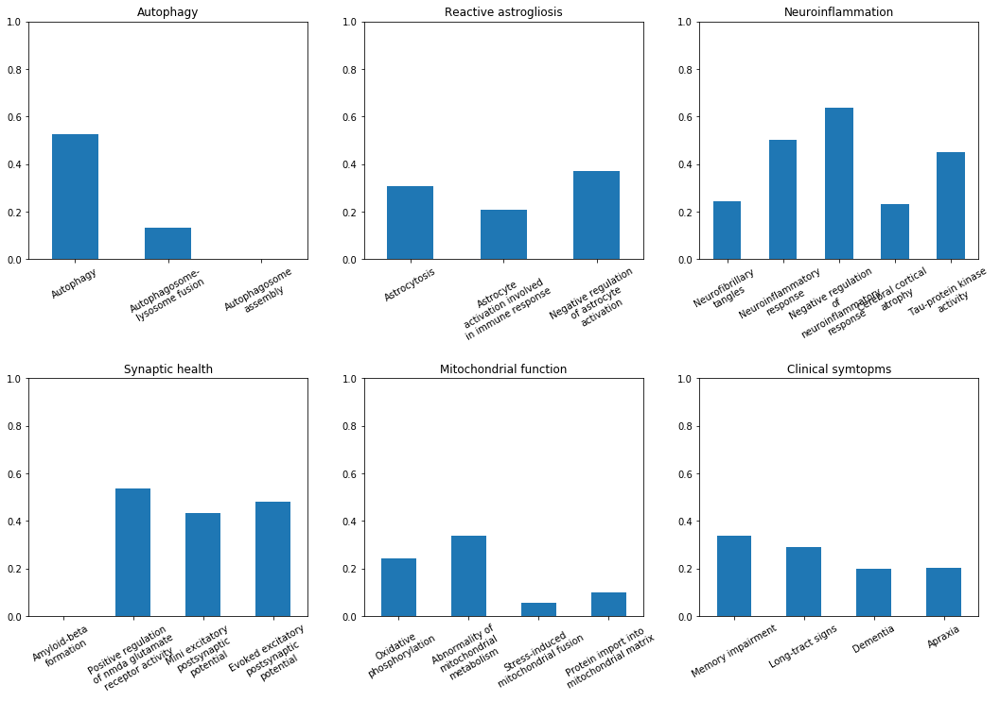

<Figure size 432x432 with 0 Axes>

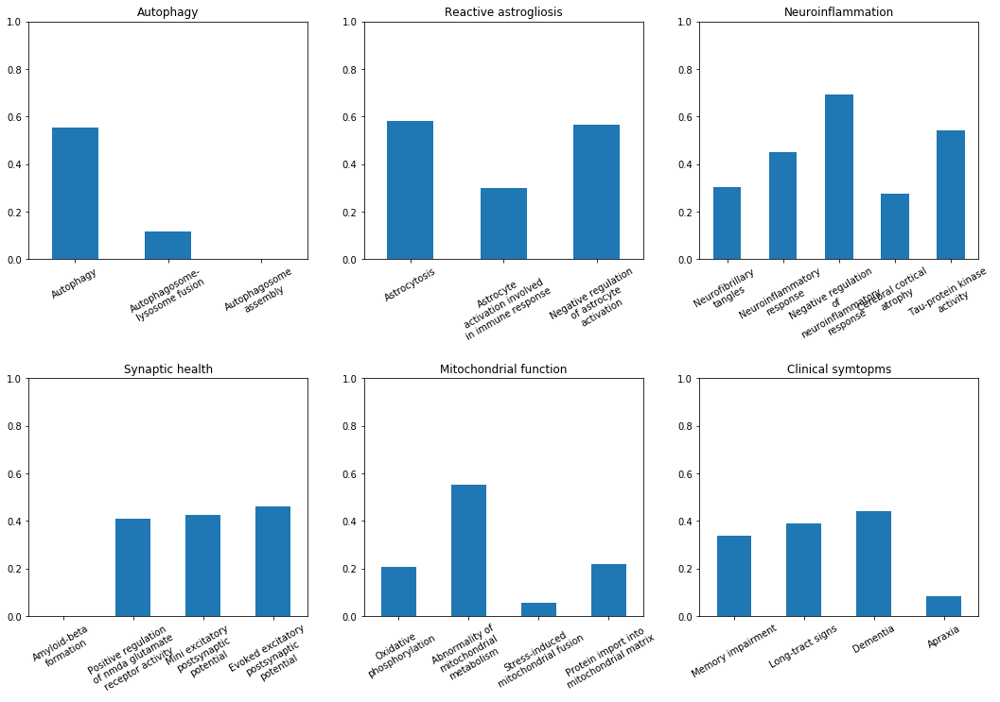

<Figure size 432x432 with 0 Axes>

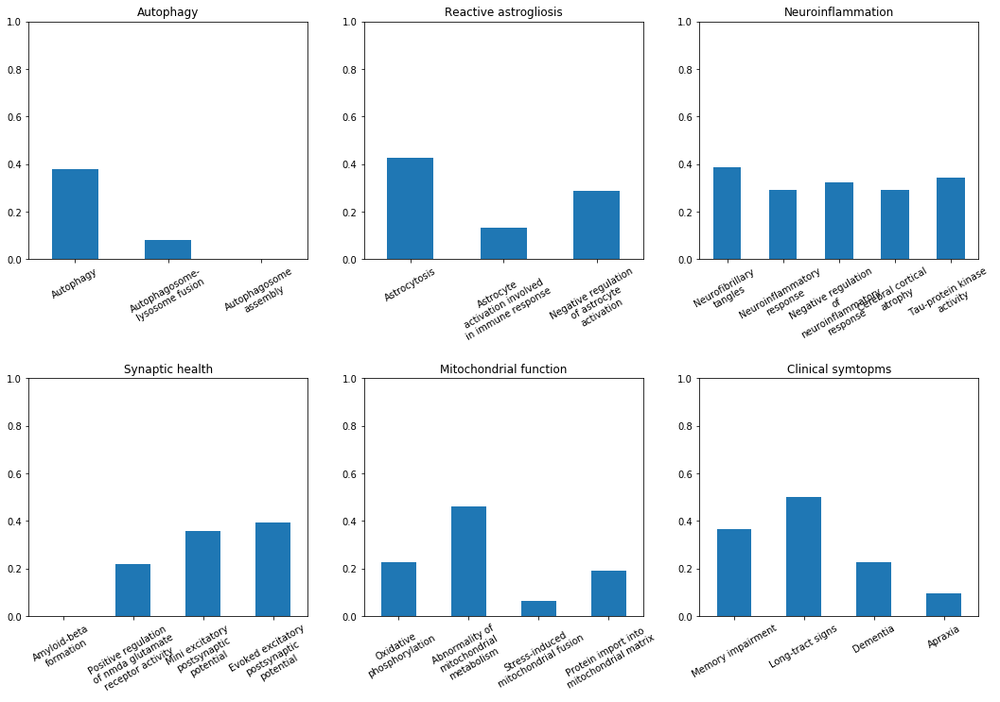

<Figure size 432x432 with 0 Axes>

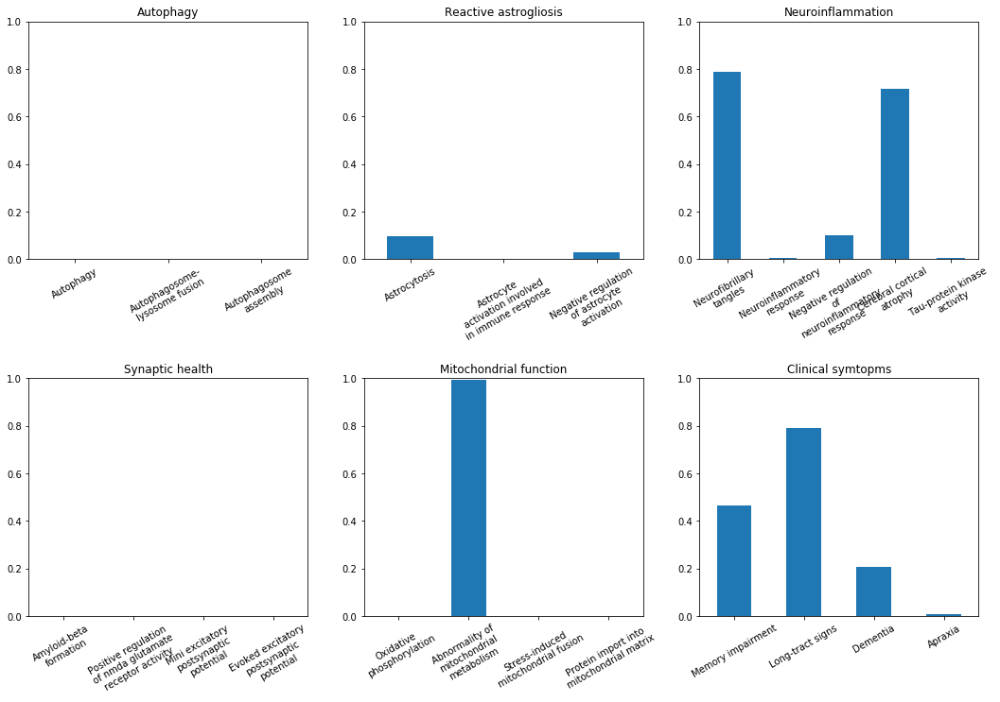

<Figure size 432x432 with 0 Axes>

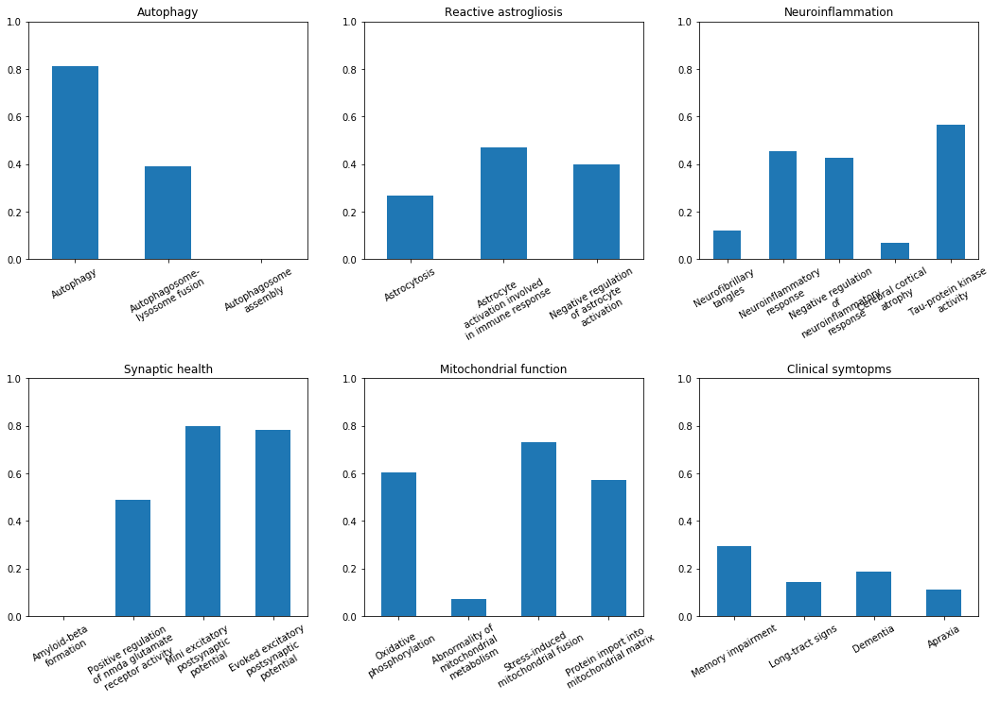

<Figure size 432x432 with 0 Axes>

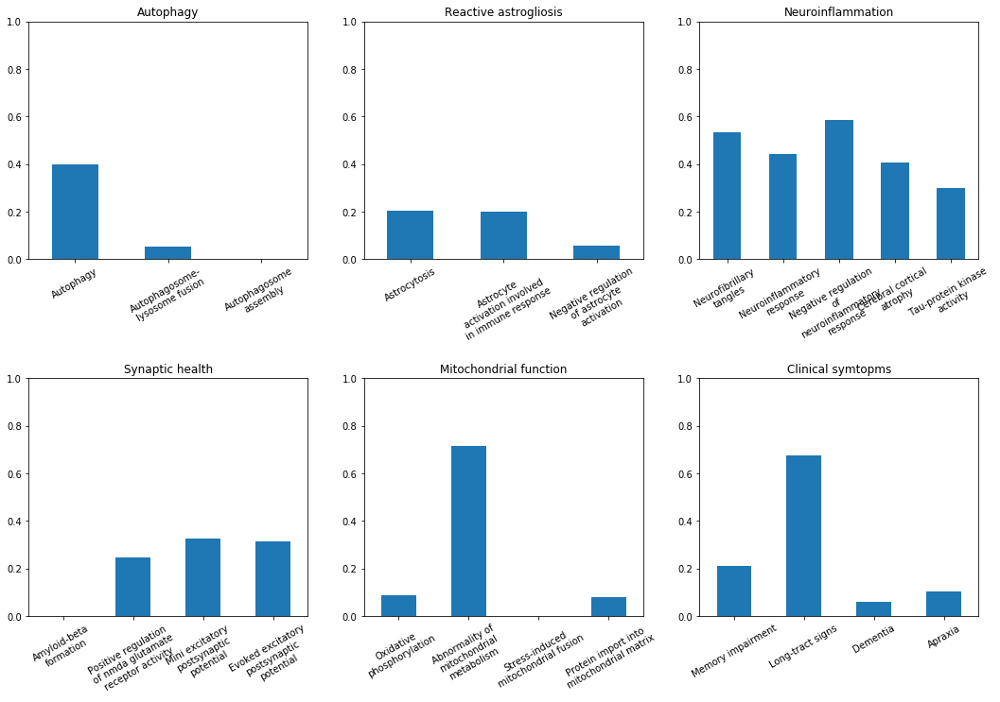

<Figure size 432x432 with 0 Axes>

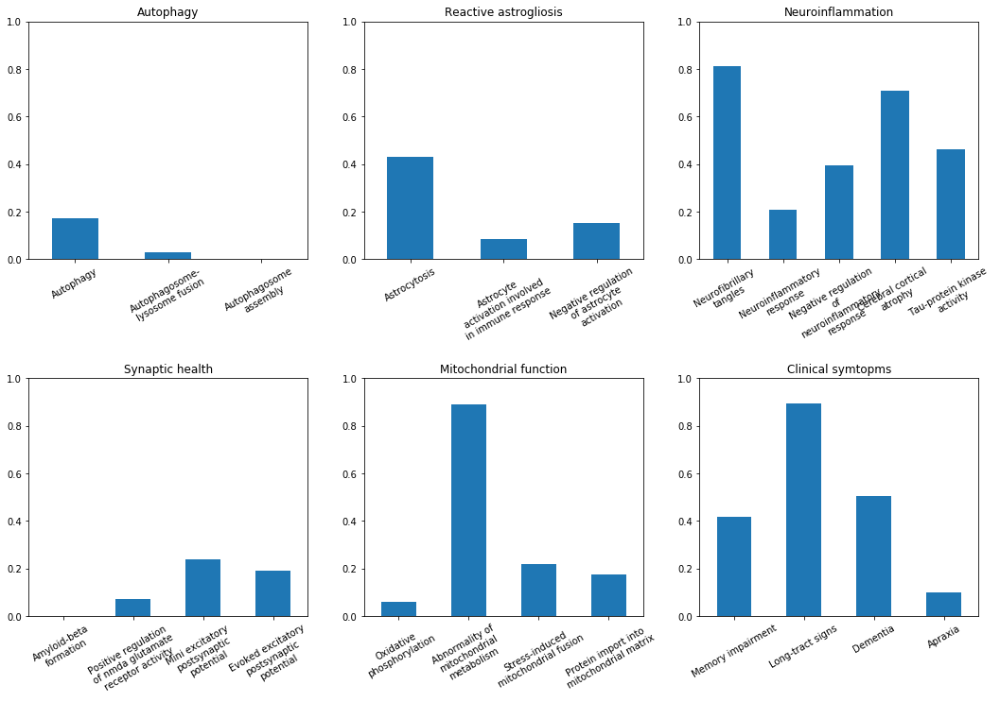

<Figure size 432x432 with 0 Axes>

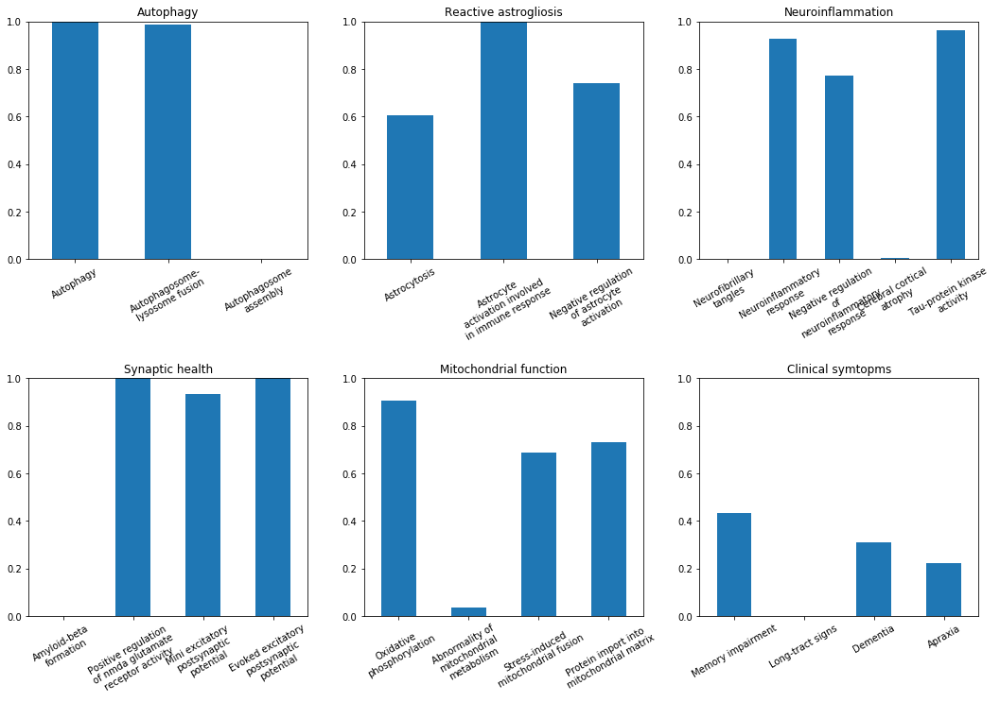

<Figure size 432x432 with 0 Axes>

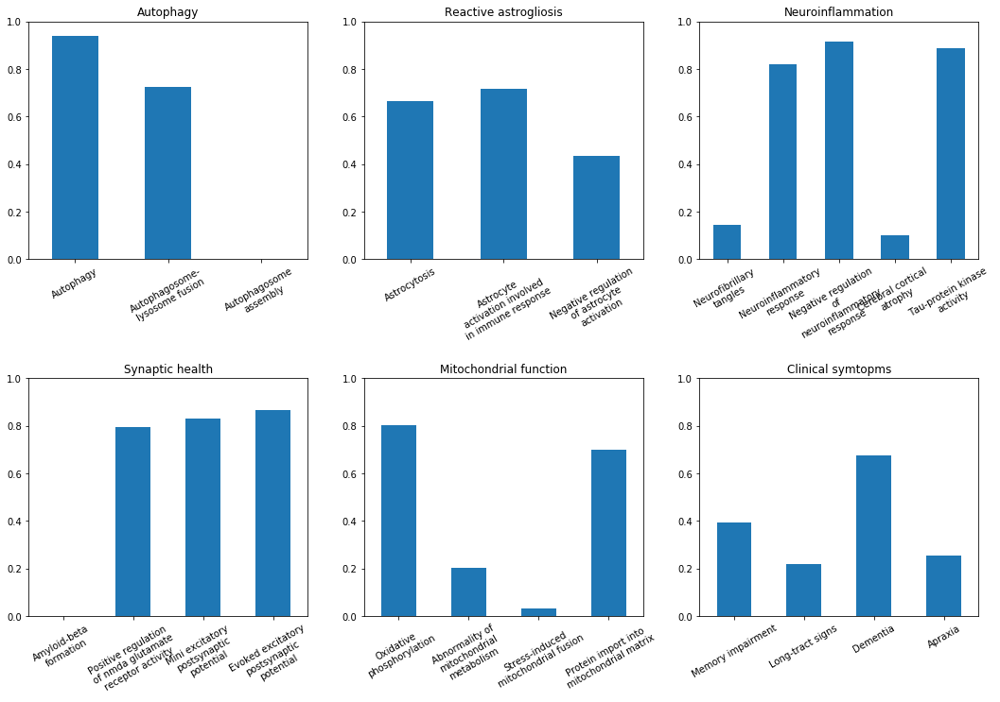

<Figure size 432x432 with 0 Axes>

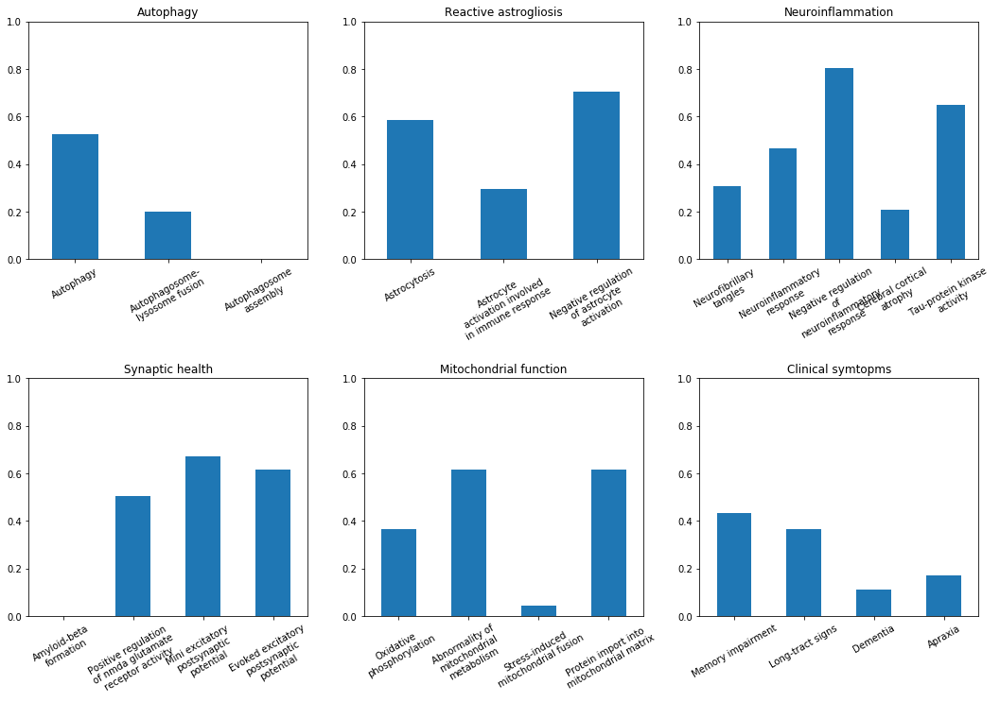

<Figure size 432x432 with 0 Axes>

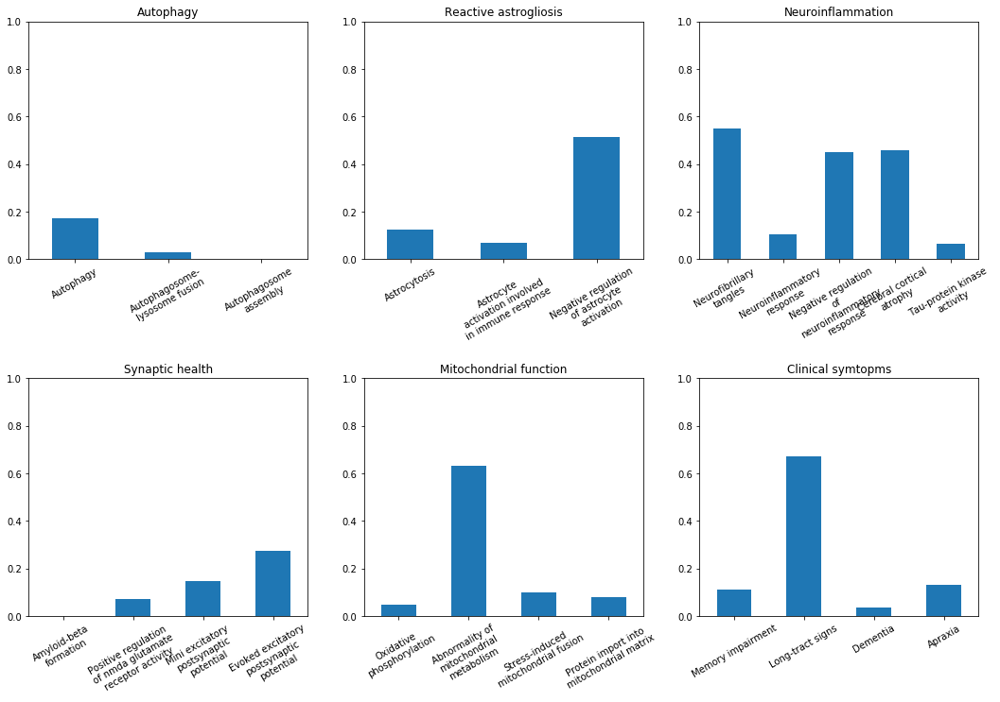

<Figure size 432x432 with 0 Axes>

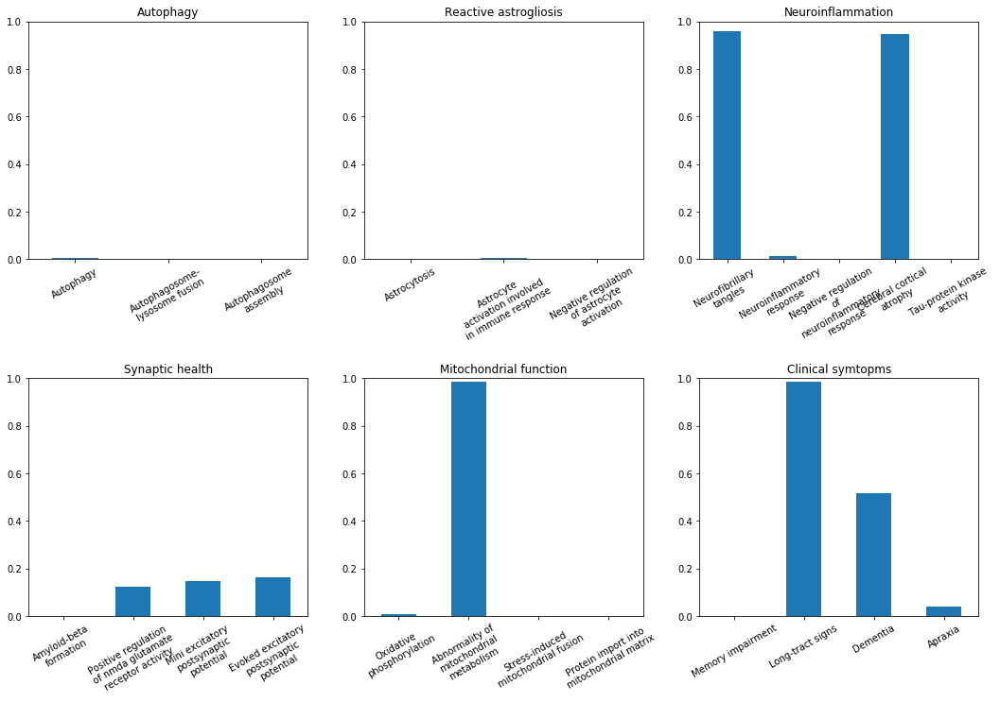

<Figure size 432x432 with 0 Axes>

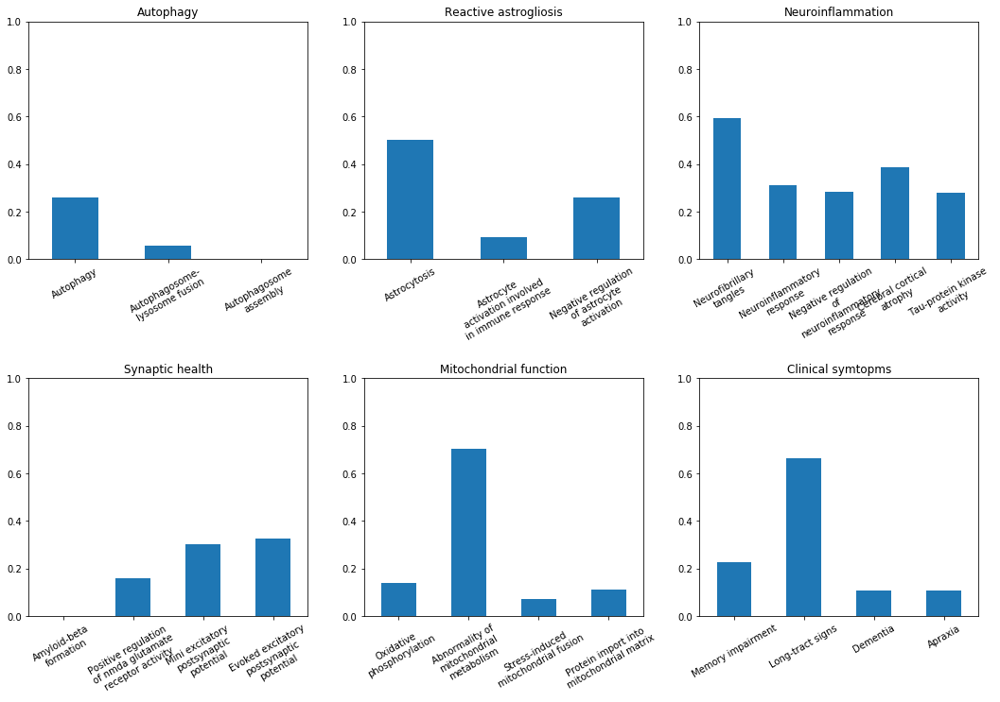

<Figure size 432x432 with 0 Axes>

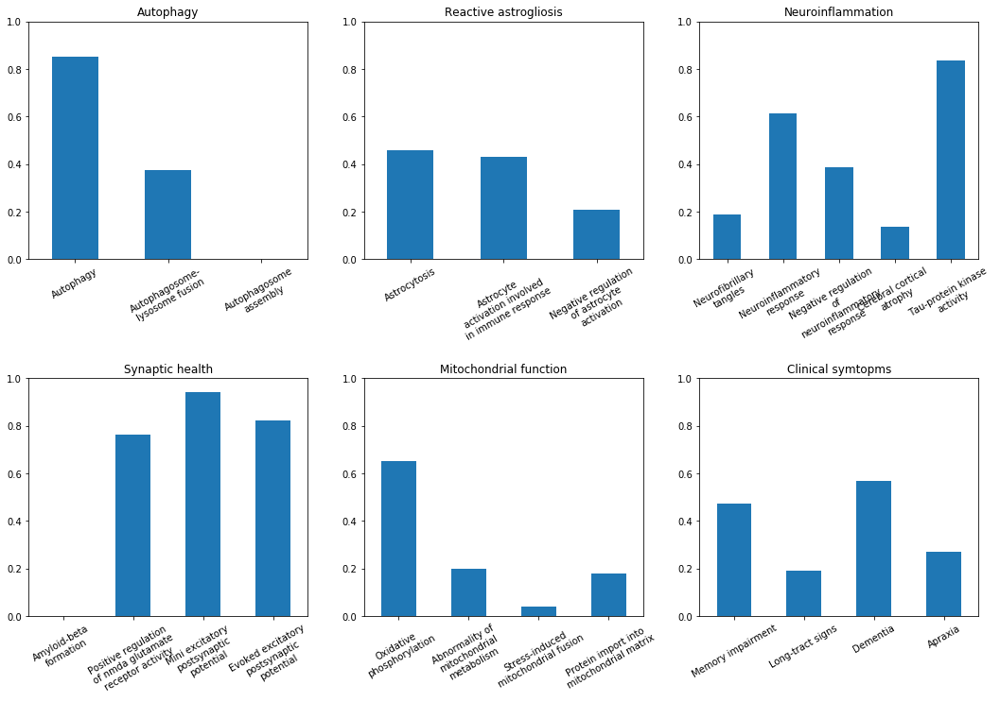

<Figure size 432x432 with 0 Axes>

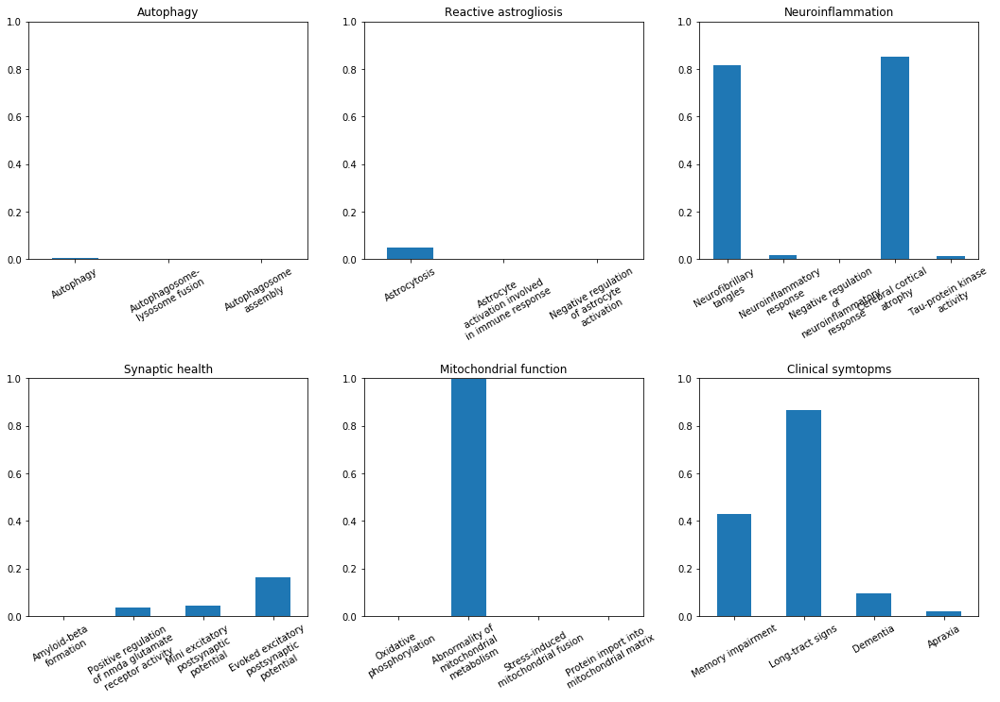

<Figure size 432x432 with 0 Axes>

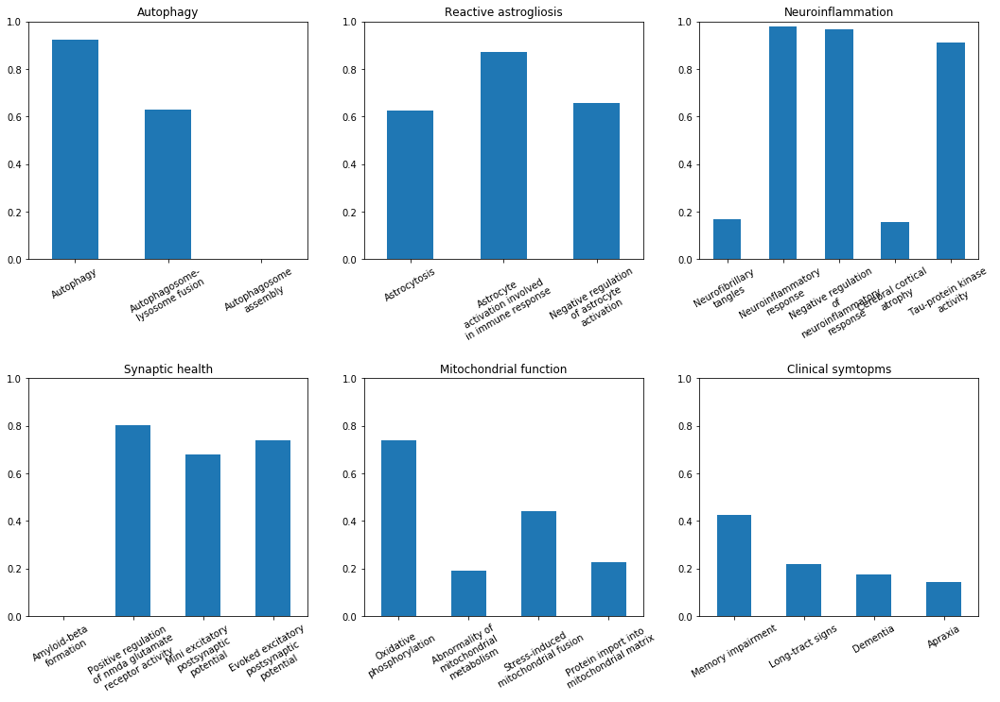

<Figure size 432x432 with 0 Axes>

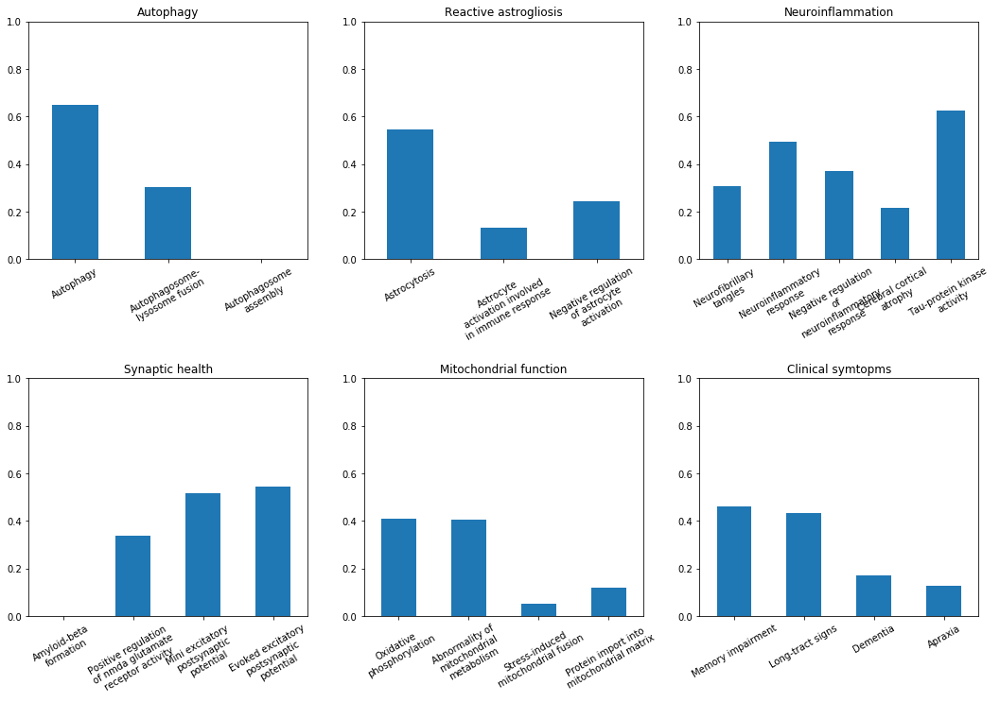

<Figure size 432x432 with 0 Axes>

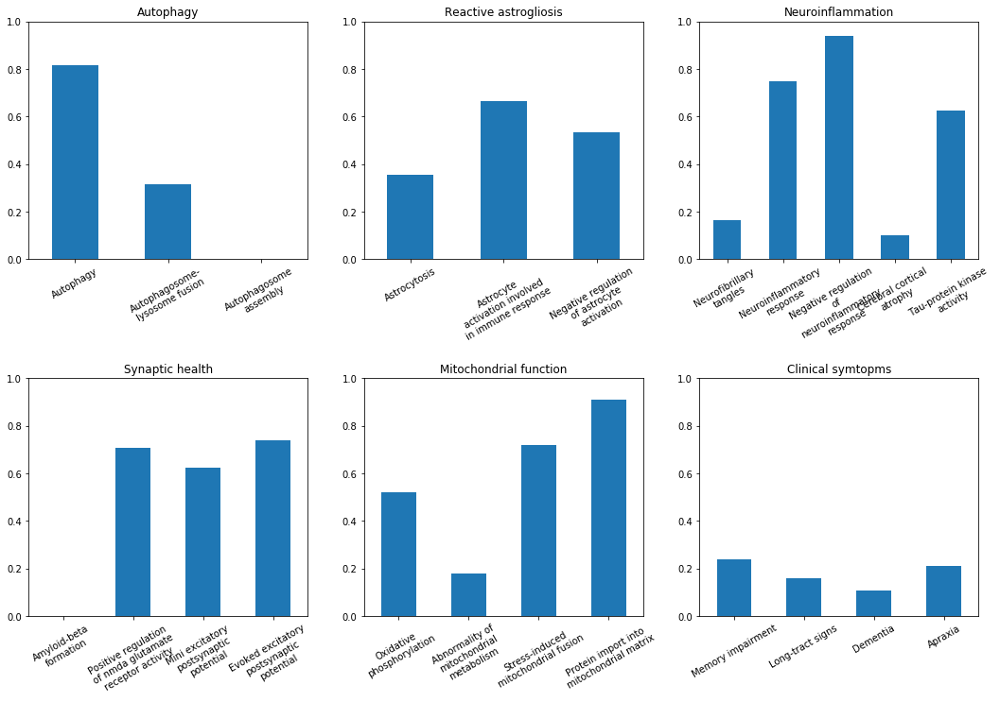

<Figure size 432x432 with 0 Axes>

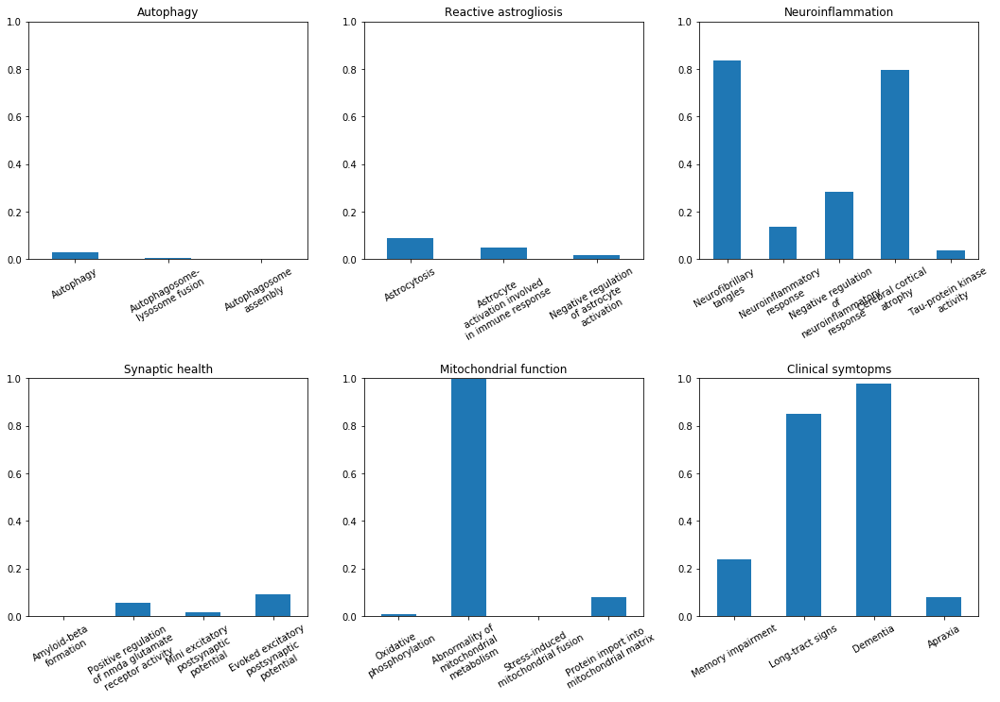

<Figure size 432x432 with 0 Axes>

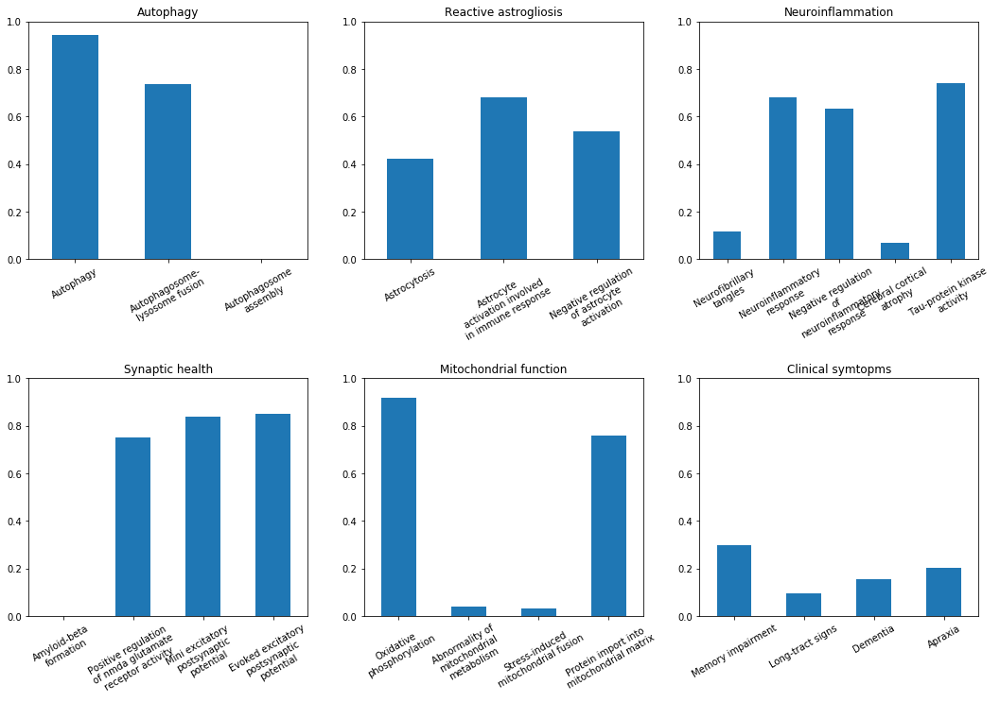

<Figure size 432x432 with 0 Axes>

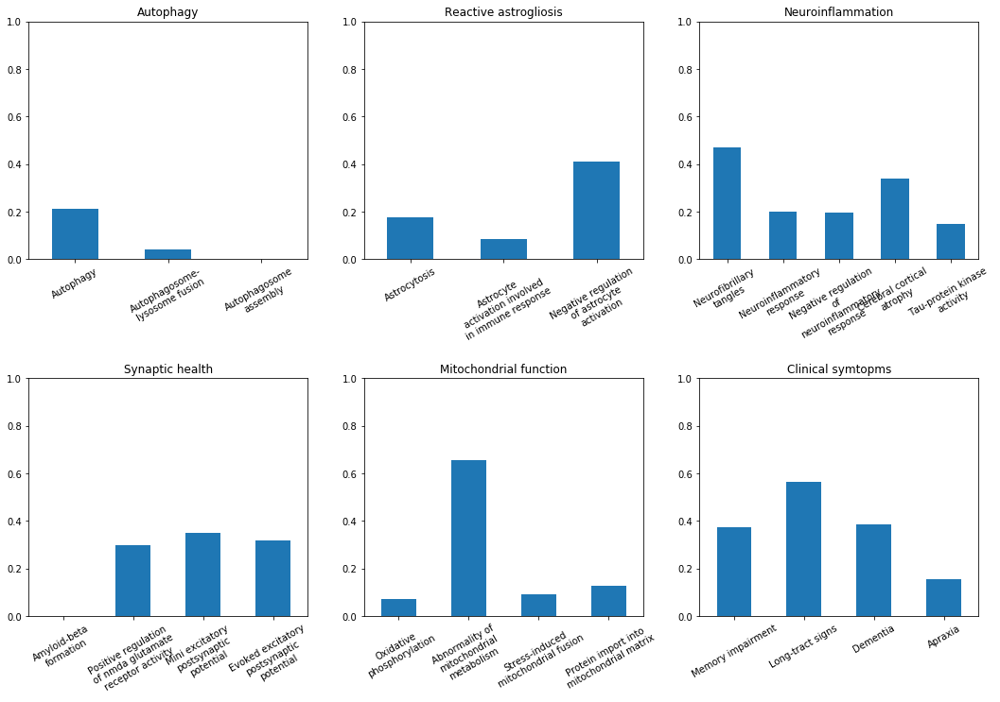

<Figure size 432x432 with 0 Axes>

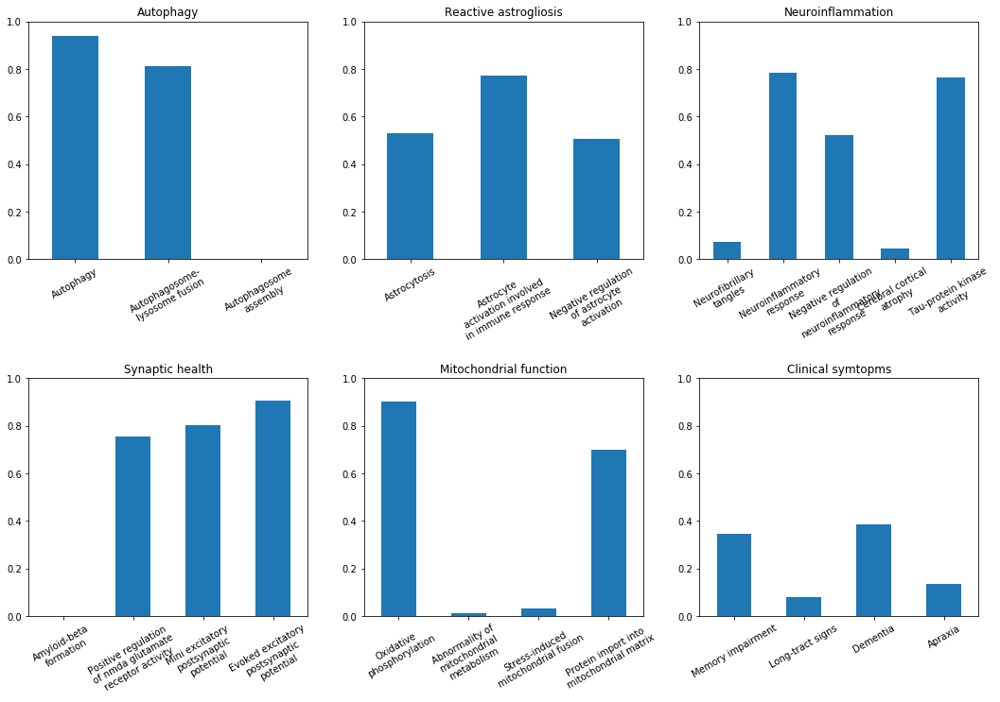

<Figure size 432x432 with 0 Axes>

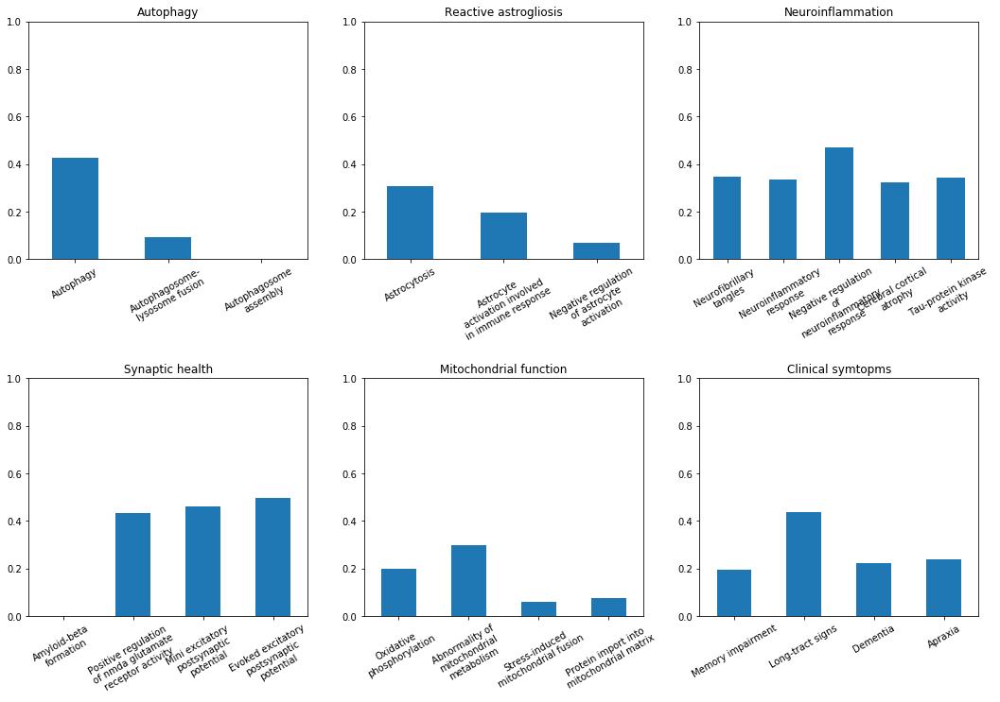

<Figure size 432x432 with 0 Axes>

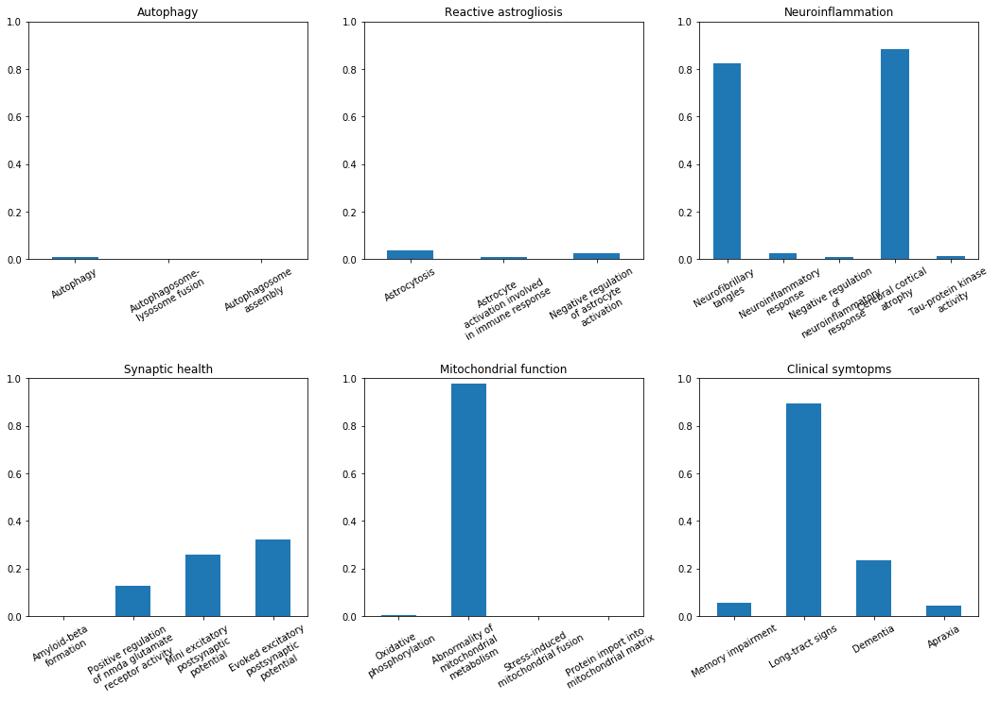

<Figure size 432x432 with 0 Axes>

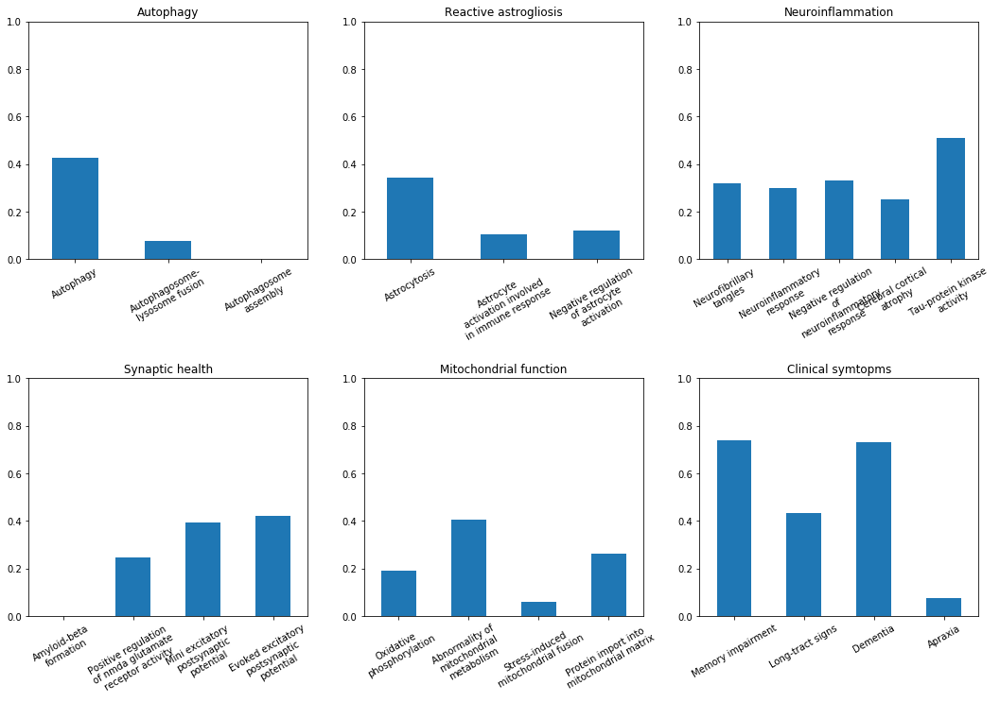

<Figure size 432x432 with 0 Axes>

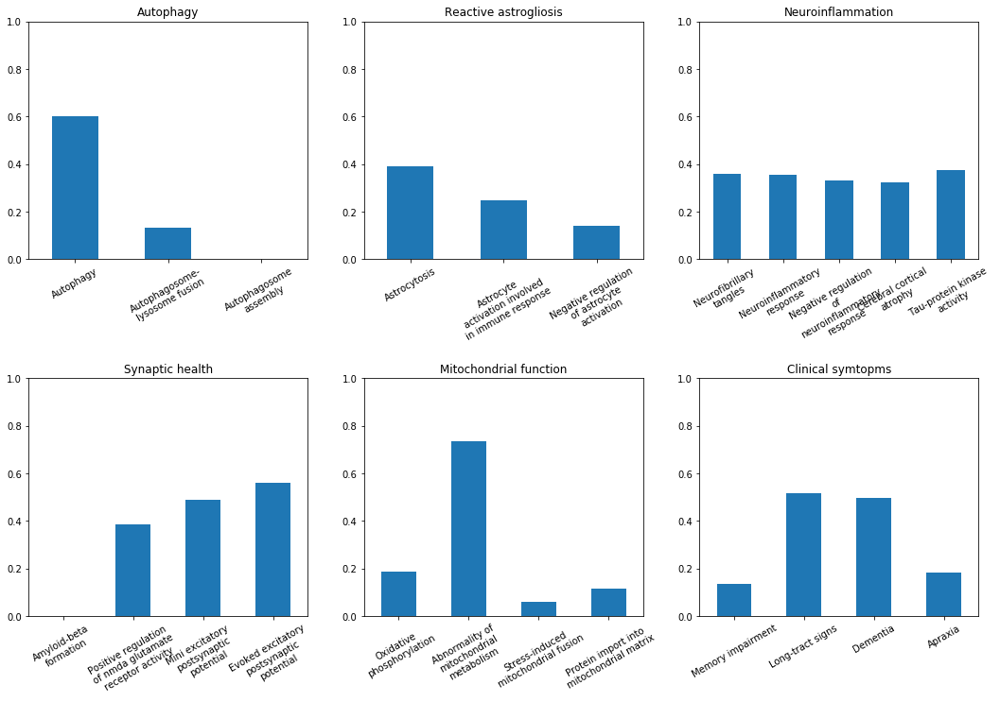

<Figure size 432x432 with 0 Axes>

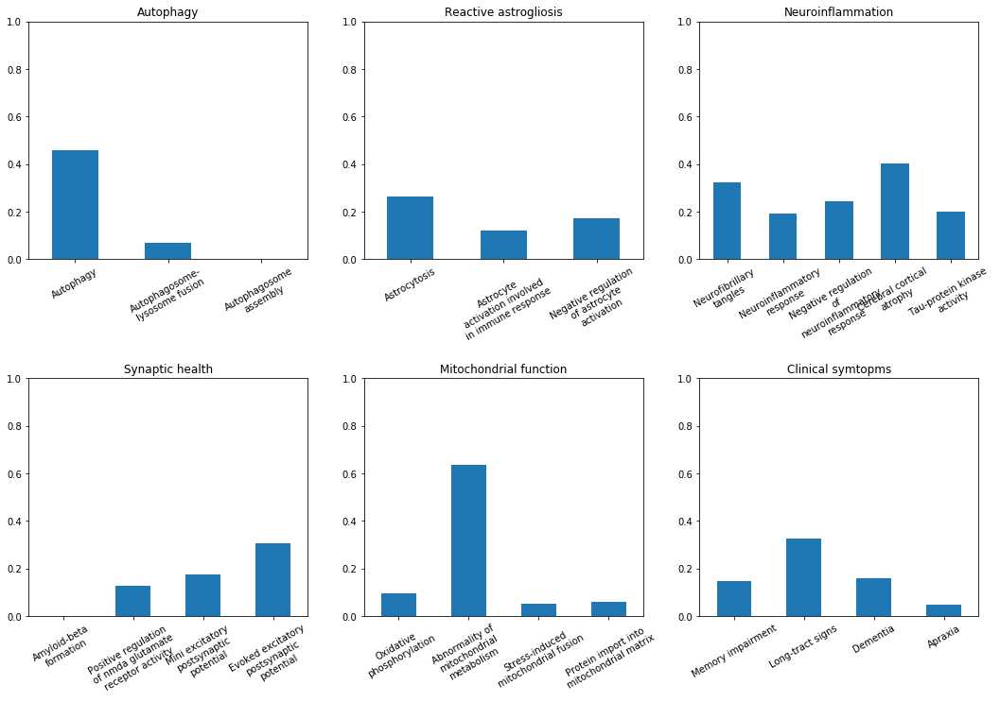

<Figure size 432x432 with 0 Axes>

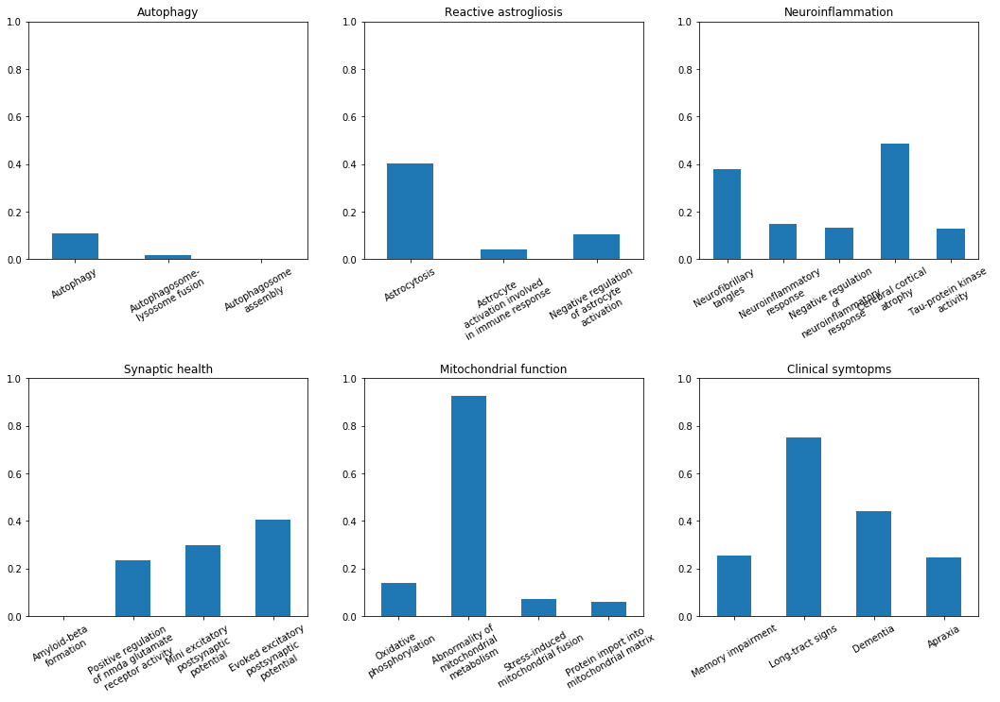

<Figure size 432x432 with 0 Axes>

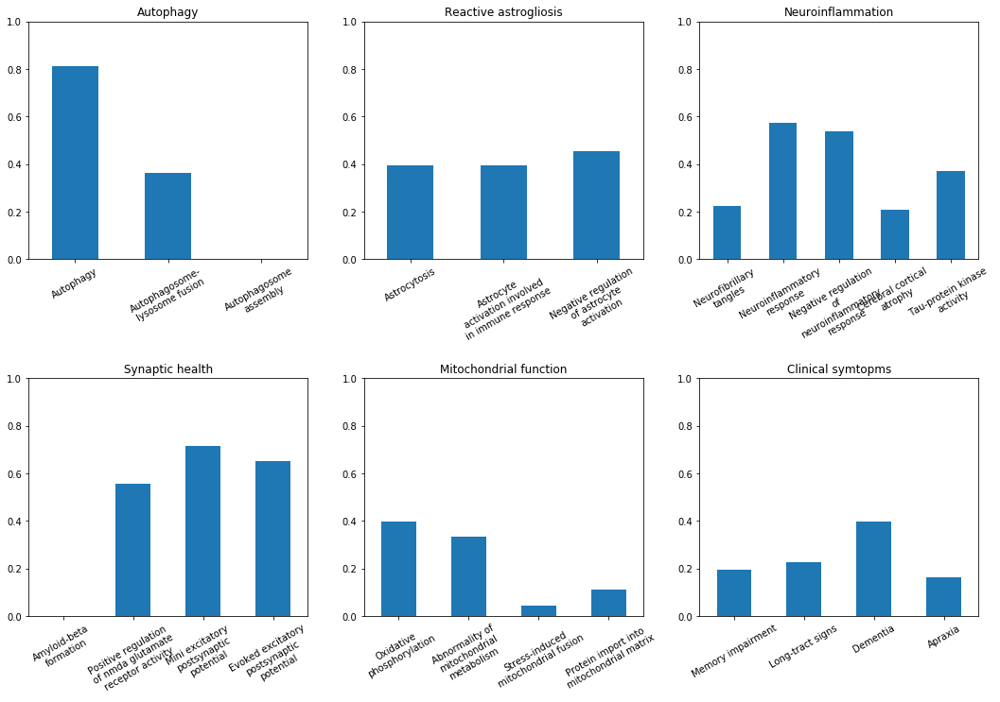

<Figure size 432x432 with 0 Axes>

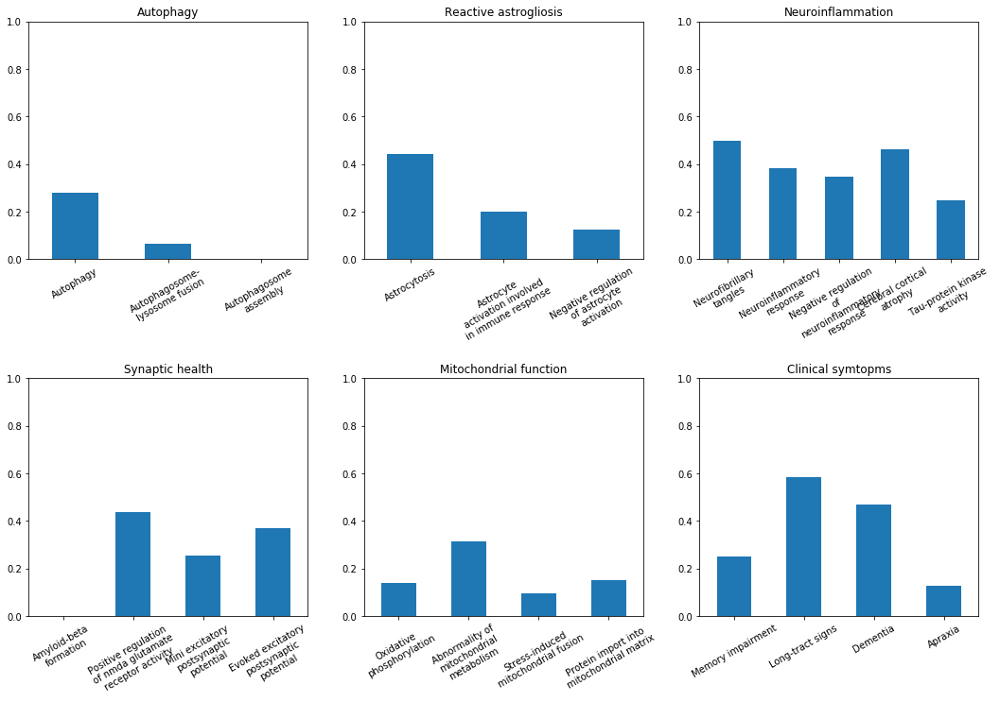

<Figure size 432x432 with 0 Axes>

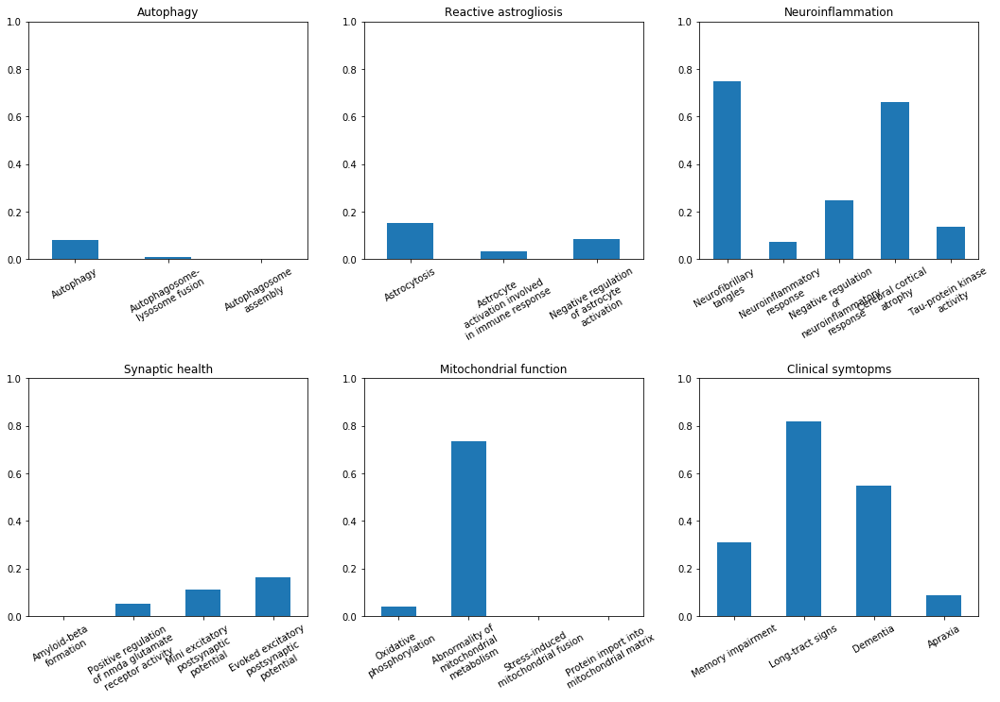

<Figure size 432x432 with 0 Axes>

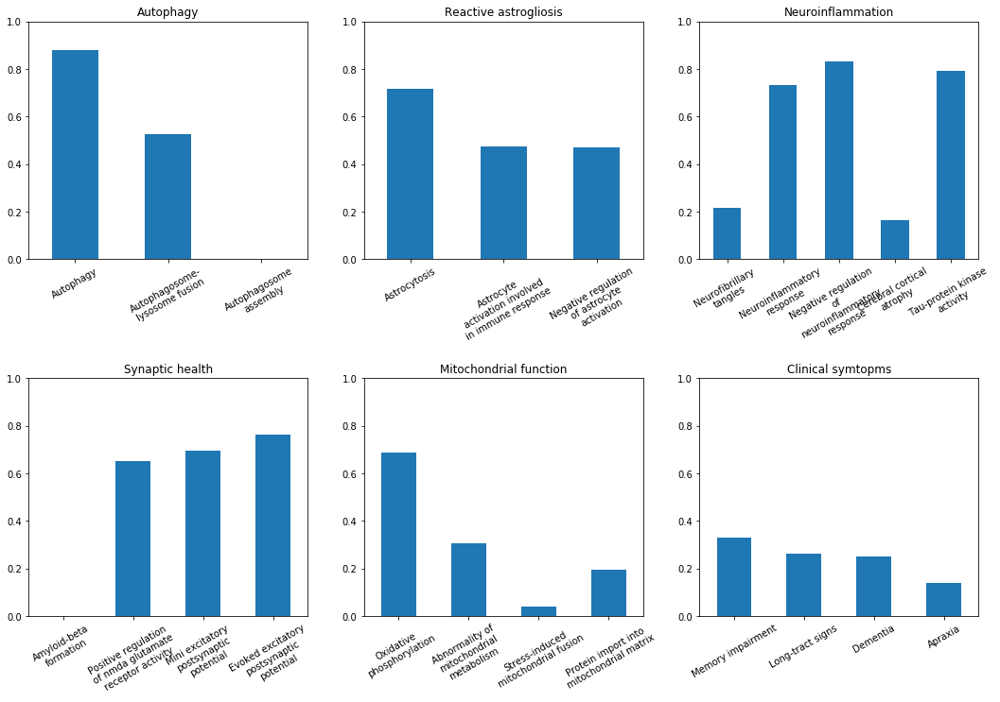

<Figure size 432x432 with 0 Axes>

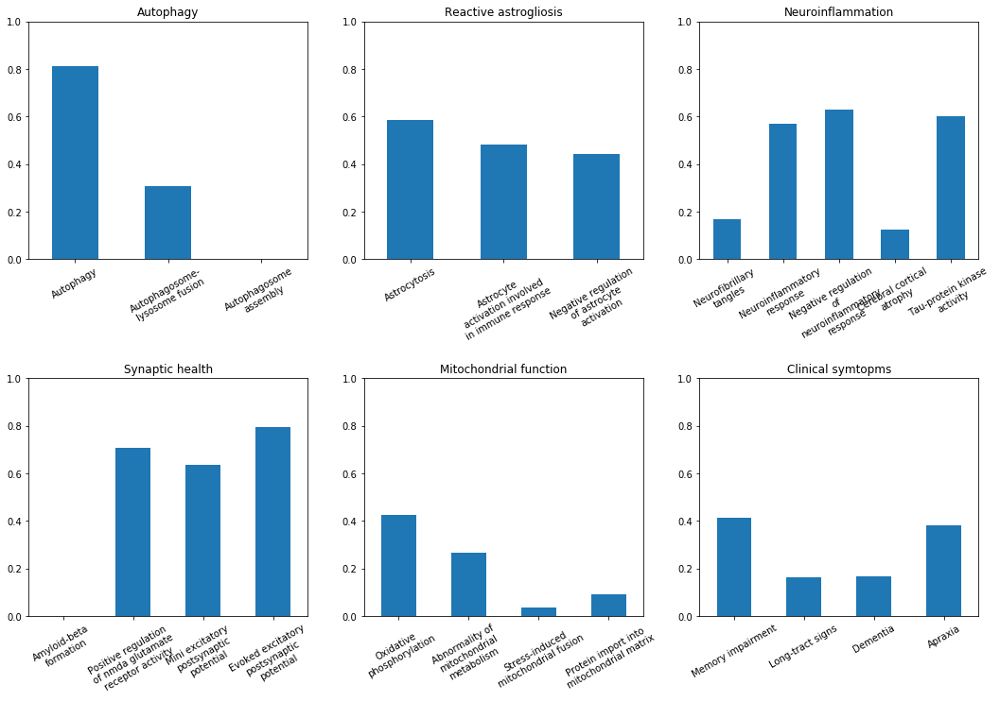

<Figure size 432x432 with 0 Axes>

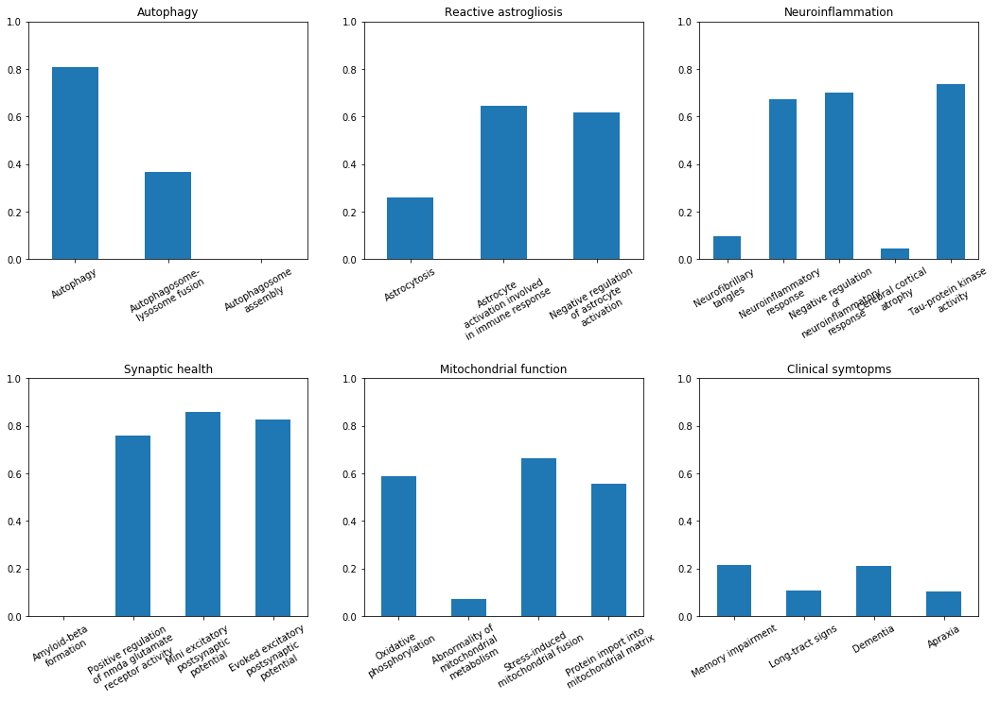

<Figure size 432x432 with 0 Axes>

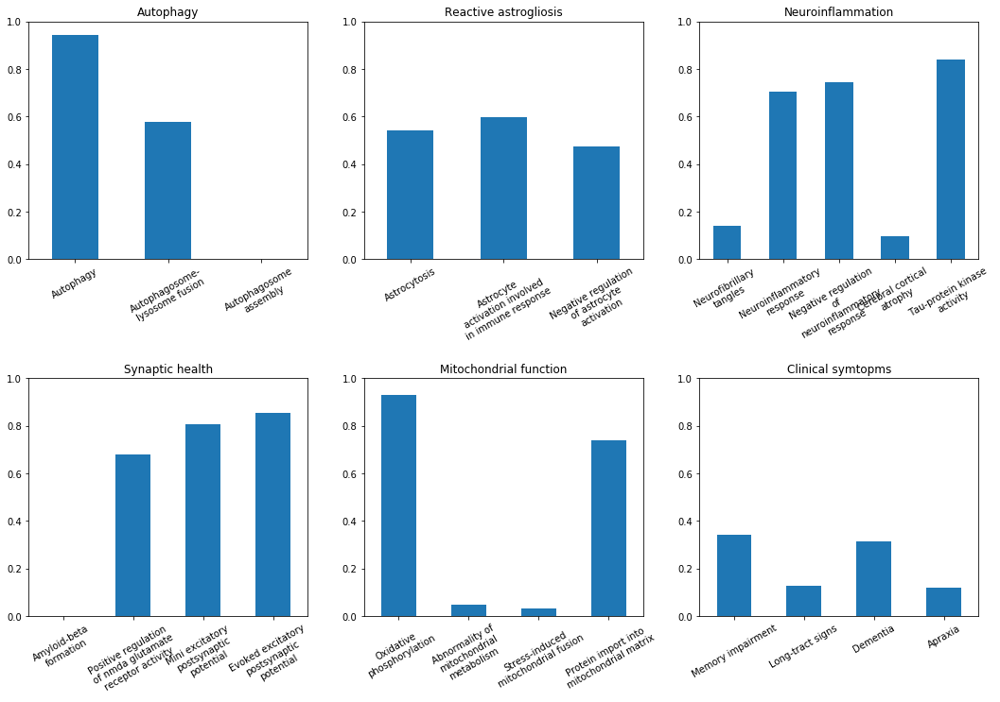

<Figure size 432x432 with 0 Axes>

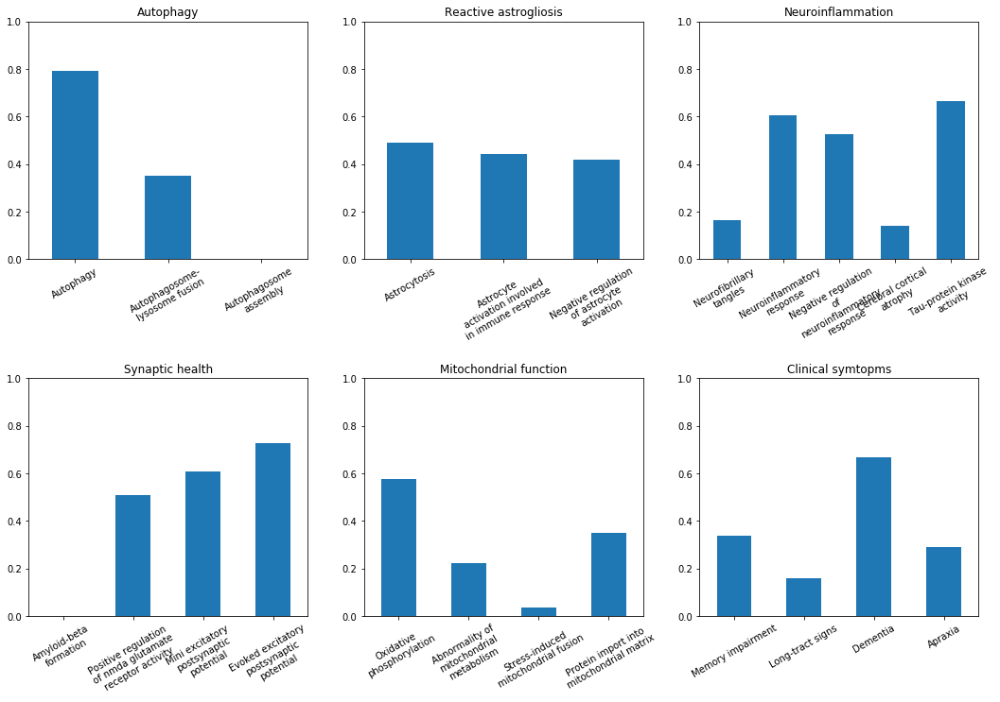

<Figure size 432x432 with 0 Axes>

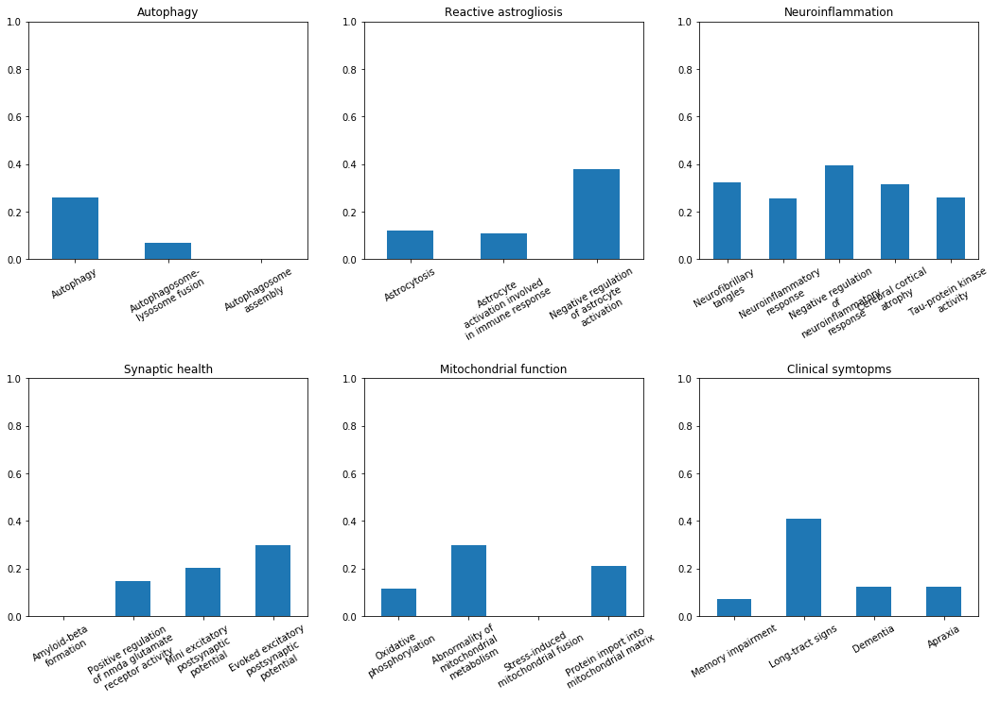

<Figure size 432x432 with 0 Axes>

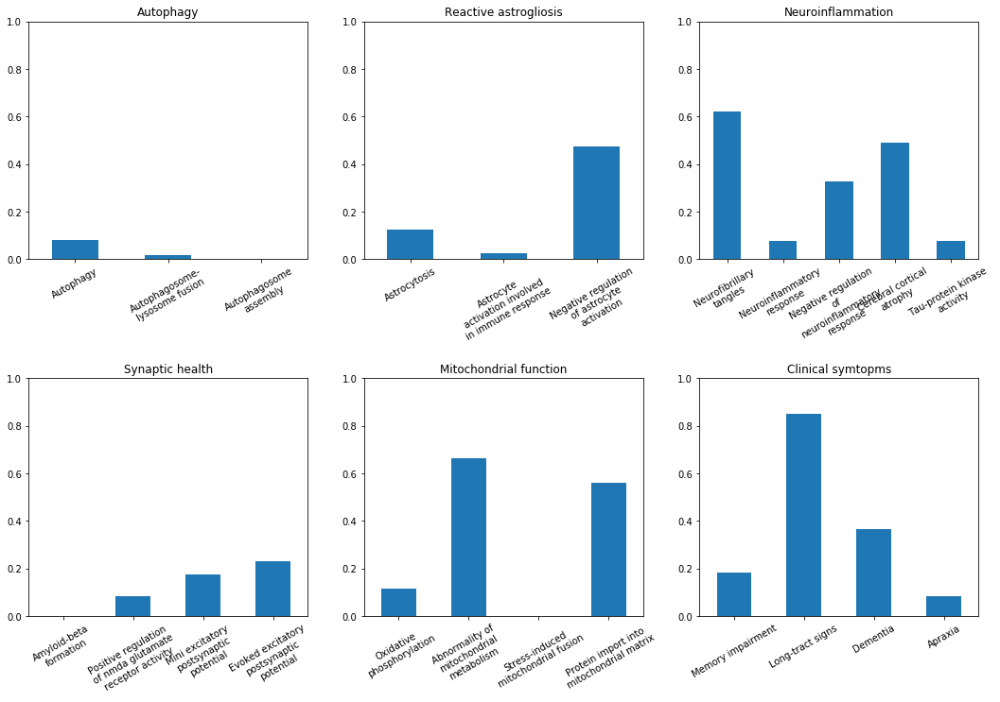

<Figure size 432x432 with 0 Axes>

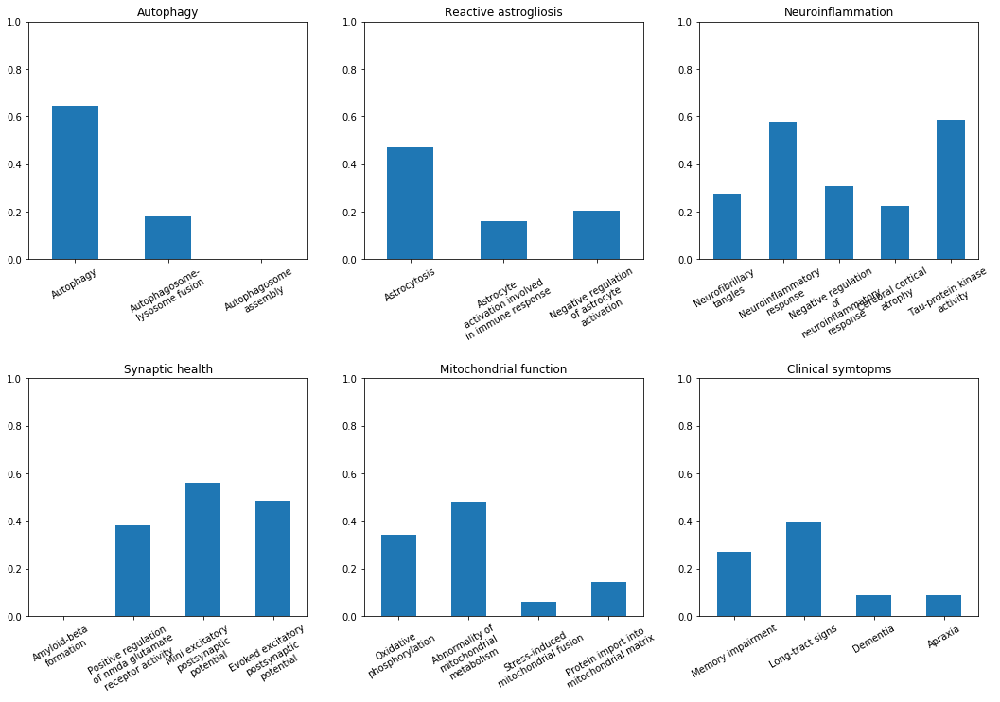

<Figure size 432x432 with 0 Axes>

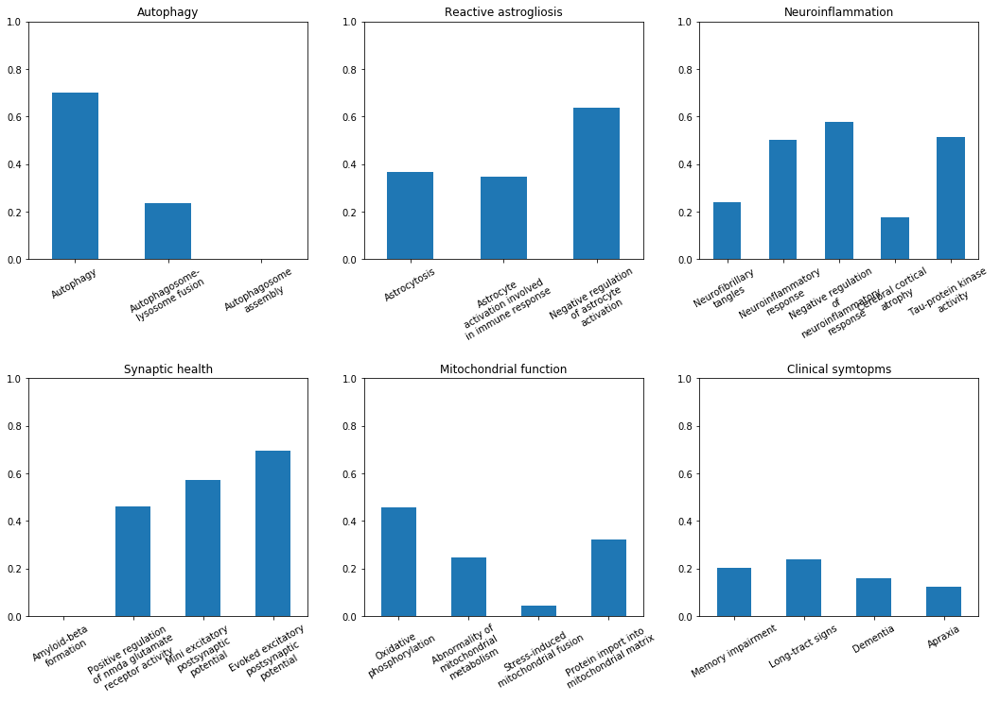

<Figure size 432x432 with 0 Axes>

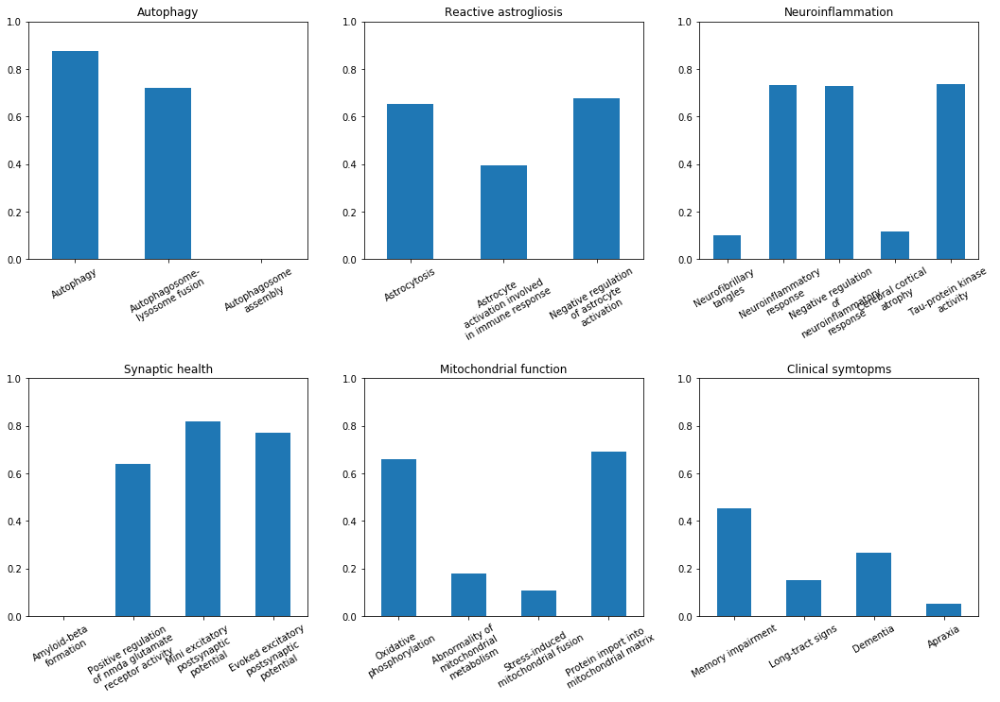

<Figure size 432x432 with 0 Axes>

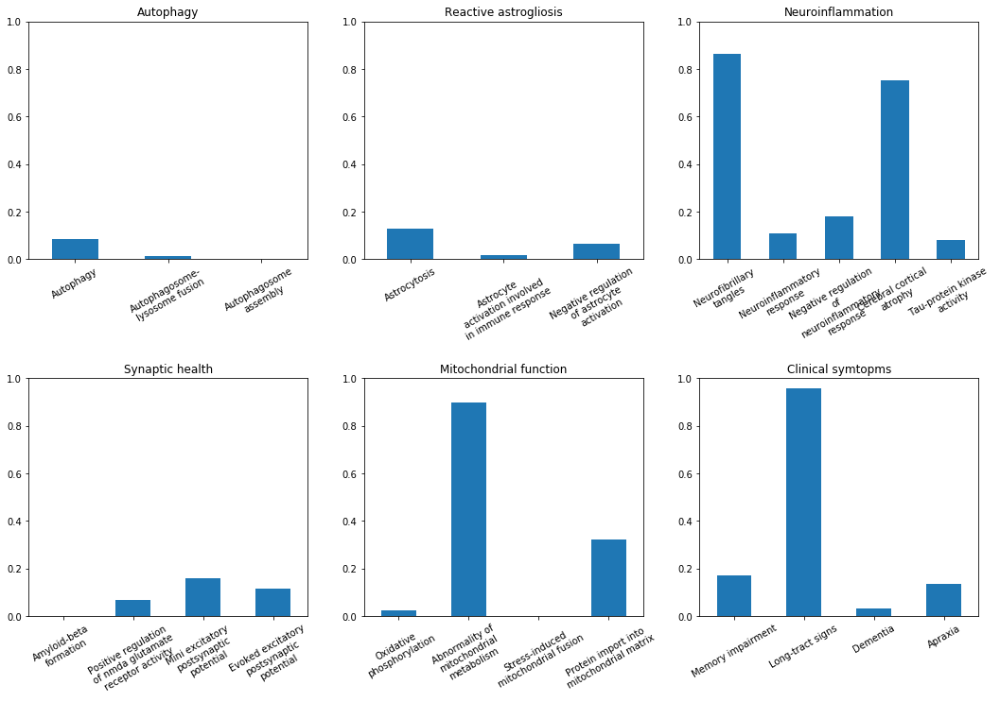

<Figure size 432x432 with 0 Axes>

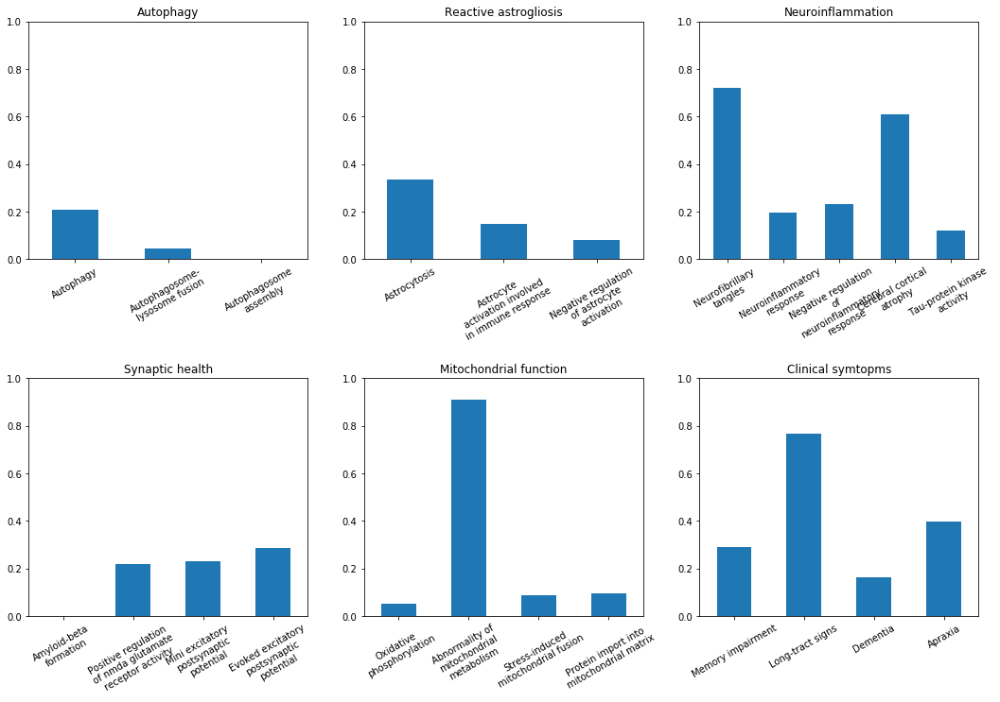

<Figure size 432x432 with 0 Axes>

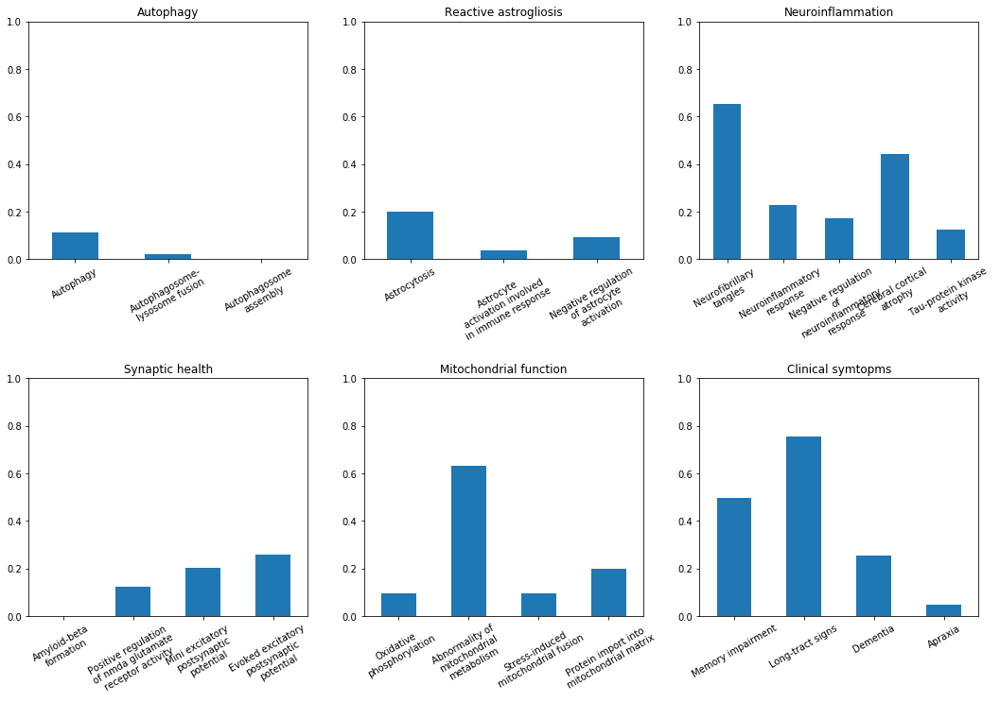

<Figure size 432x432 with 0 Axes>

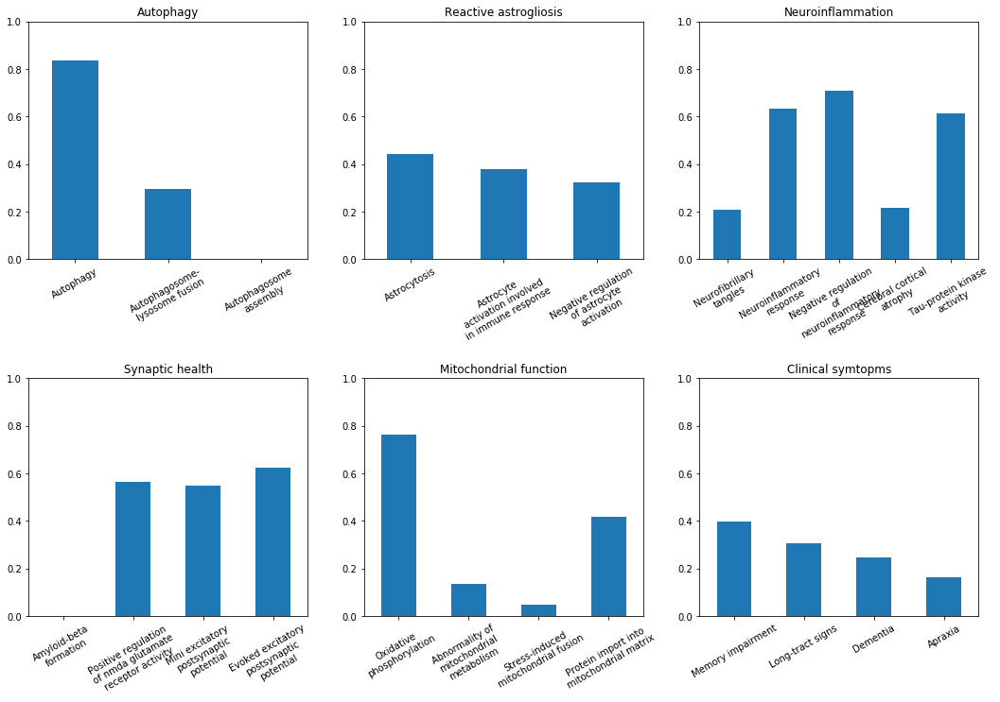

<Figure size 432x432 with 0 Axes>

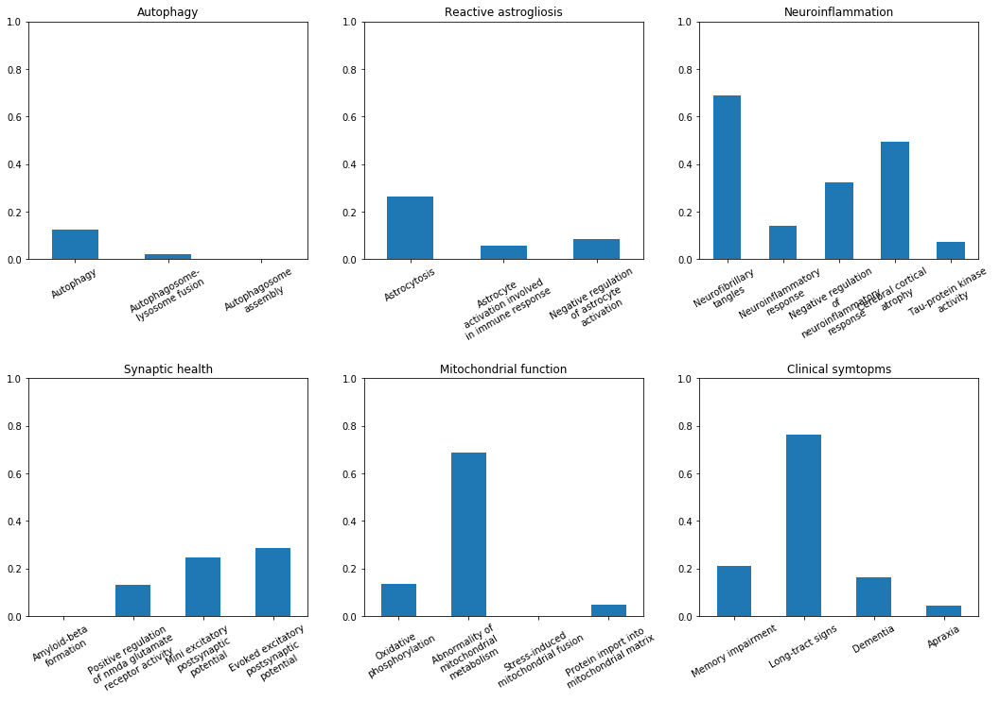

<Figure size 432x432 with 0 Axes>

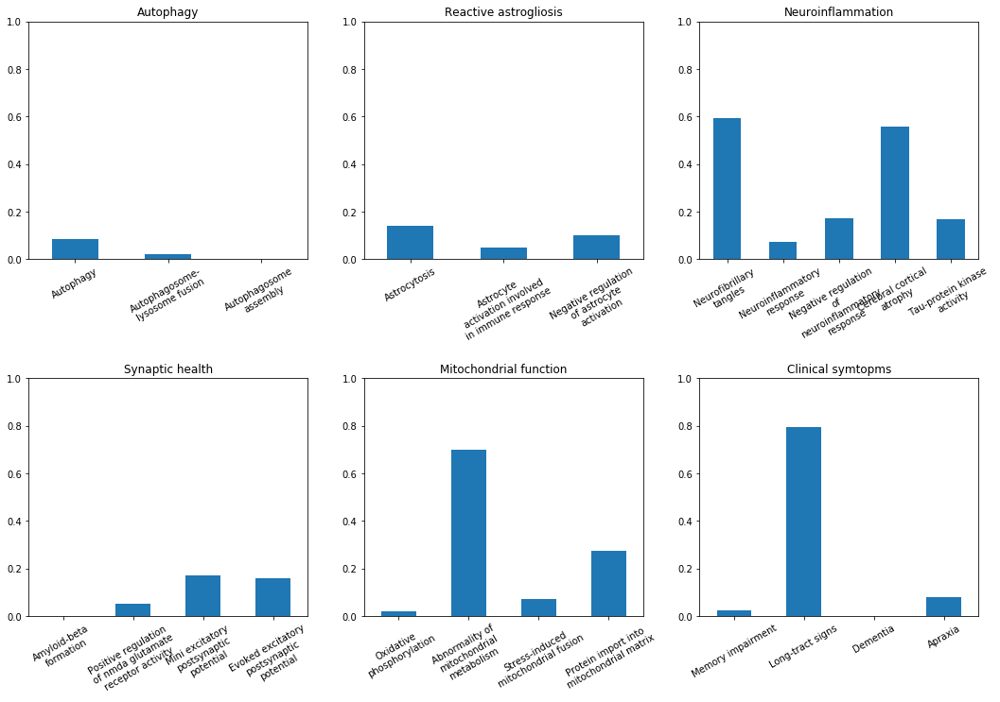

<Figure size 432x432 with 0 Axes>

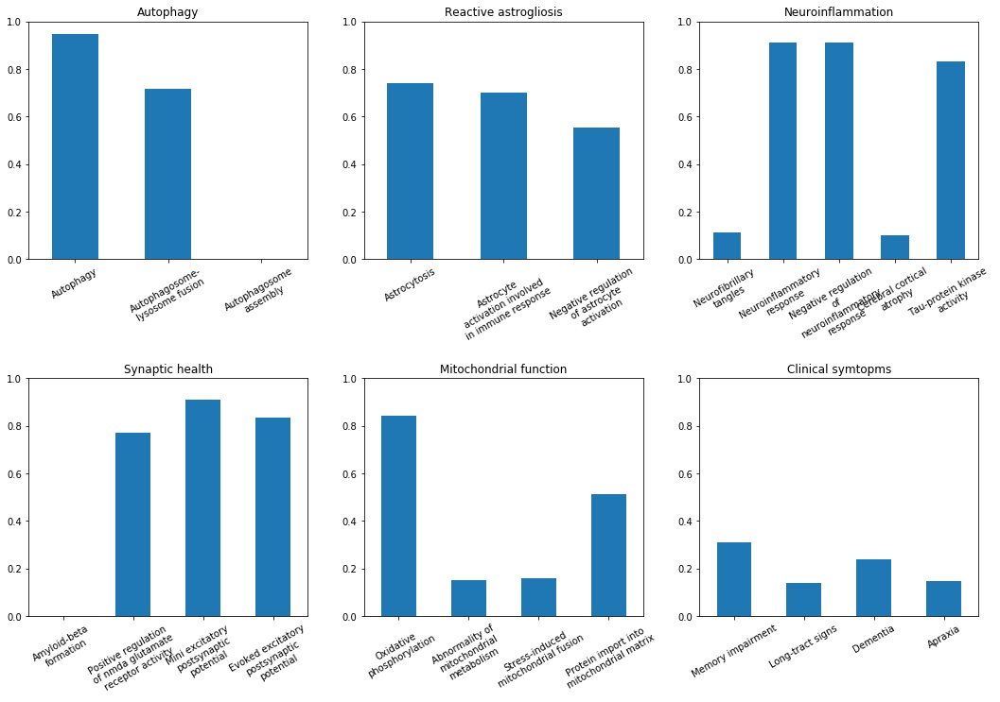

<Figure size 432x432 with 0 Axes>

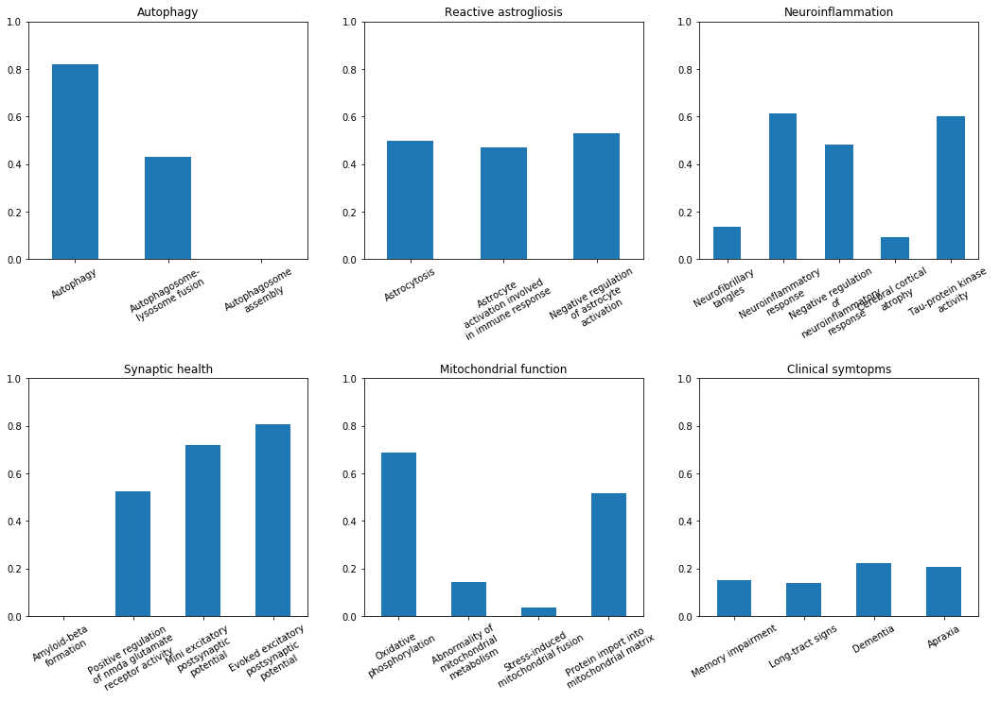

<Figure size 432x432 with 0 Axes>

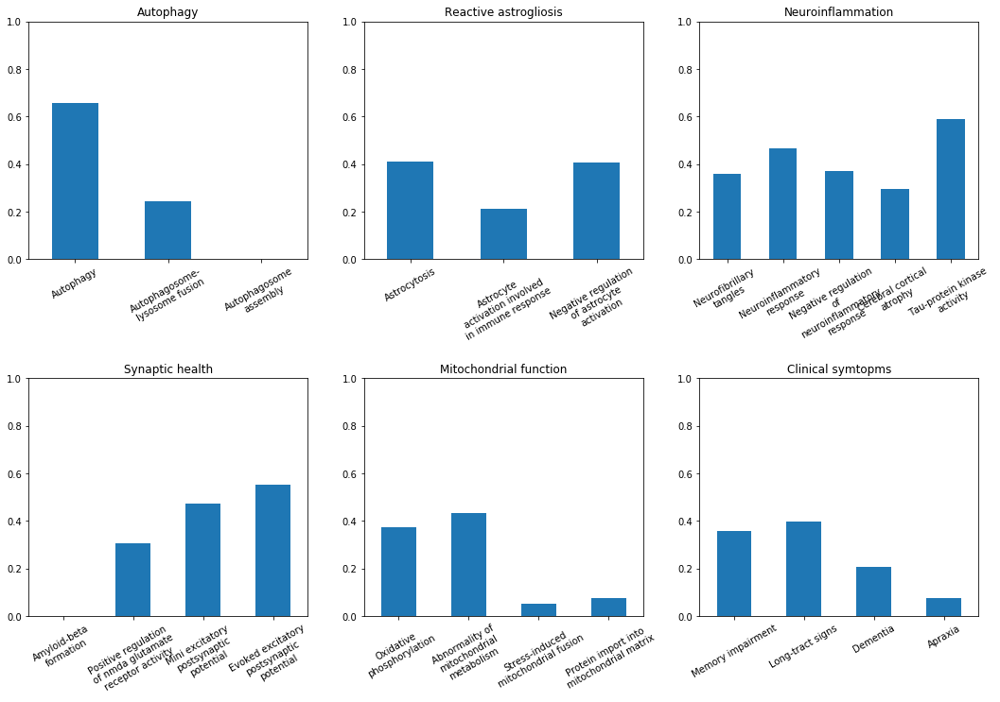

<Figure size 432x432 with 0 Axes>

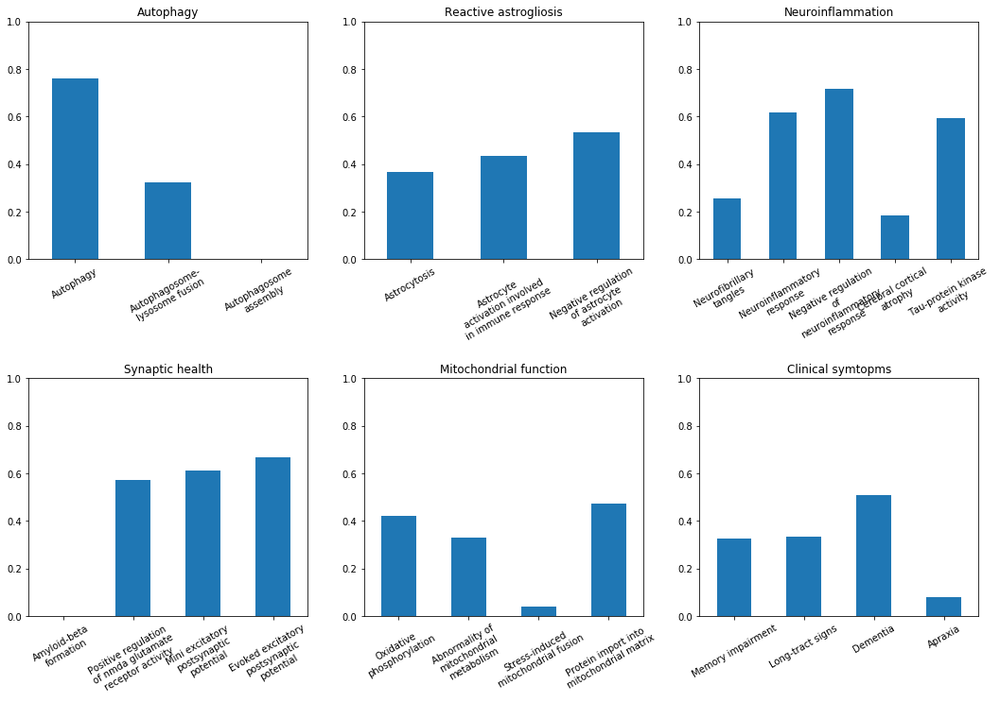

<Figure size 432x432 with 0 Axes>

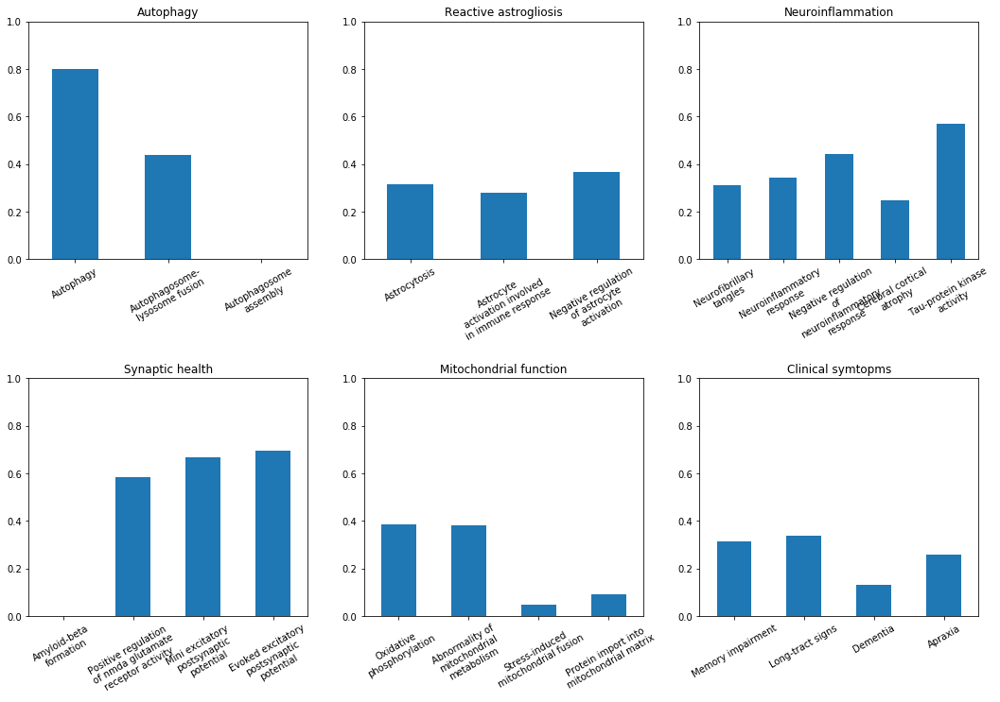

<Figure size 432x432 with 0 Axes>

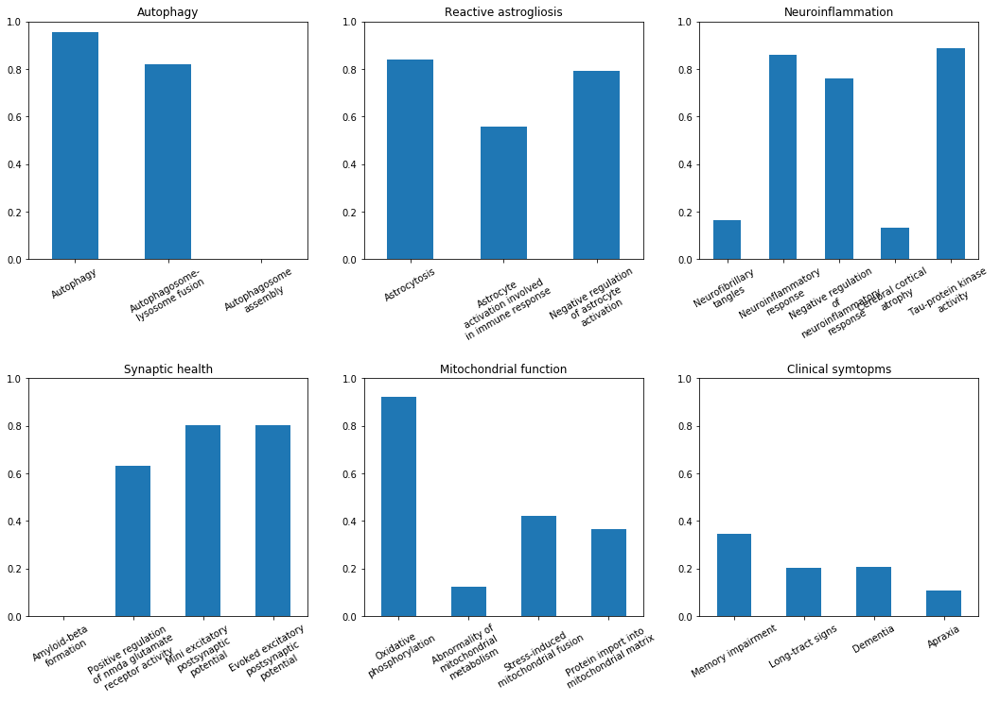

<Figure size 432x432 with 0 Axes>

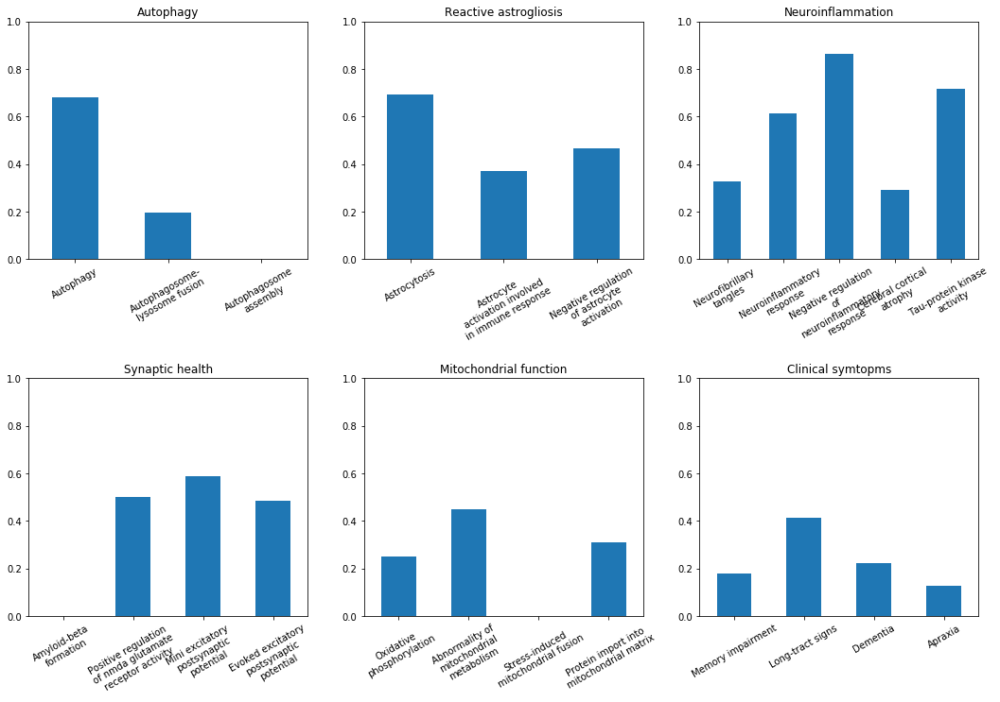

<Figure size 432x432 with 0 Axes>

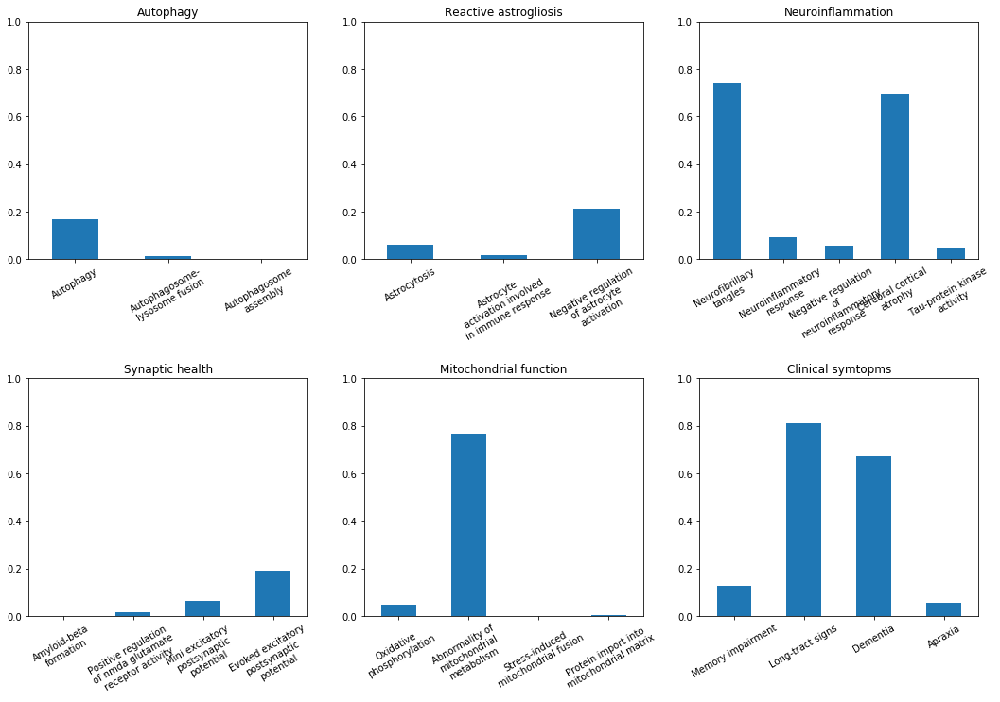

<Figure size 432x432 with 0 Axes>

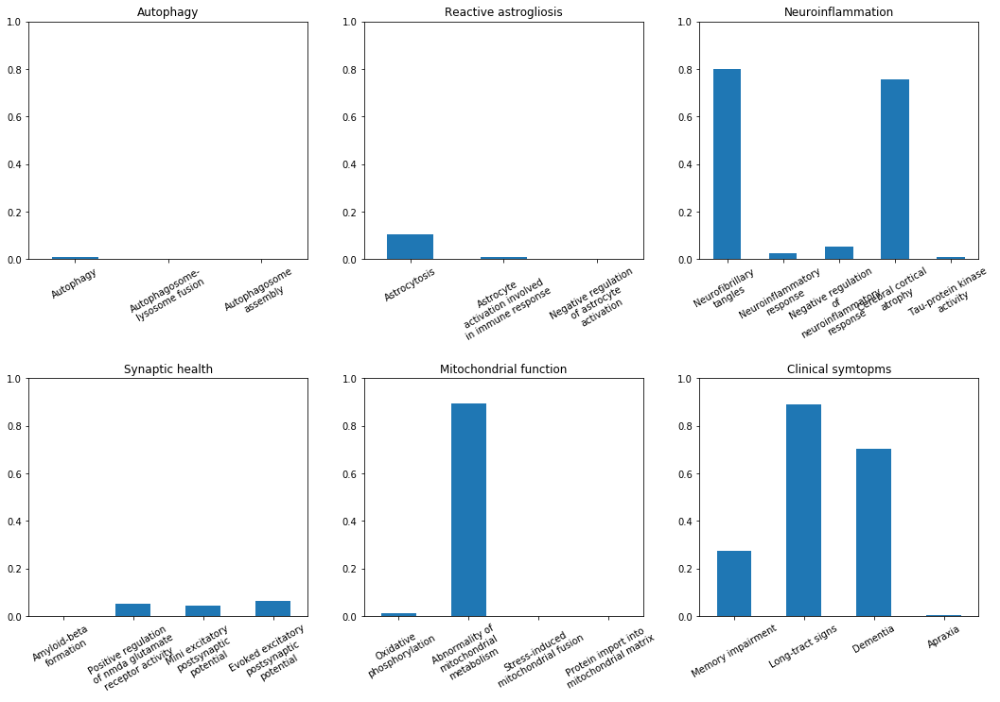

<Figure size 432x432 with 0 Axes>

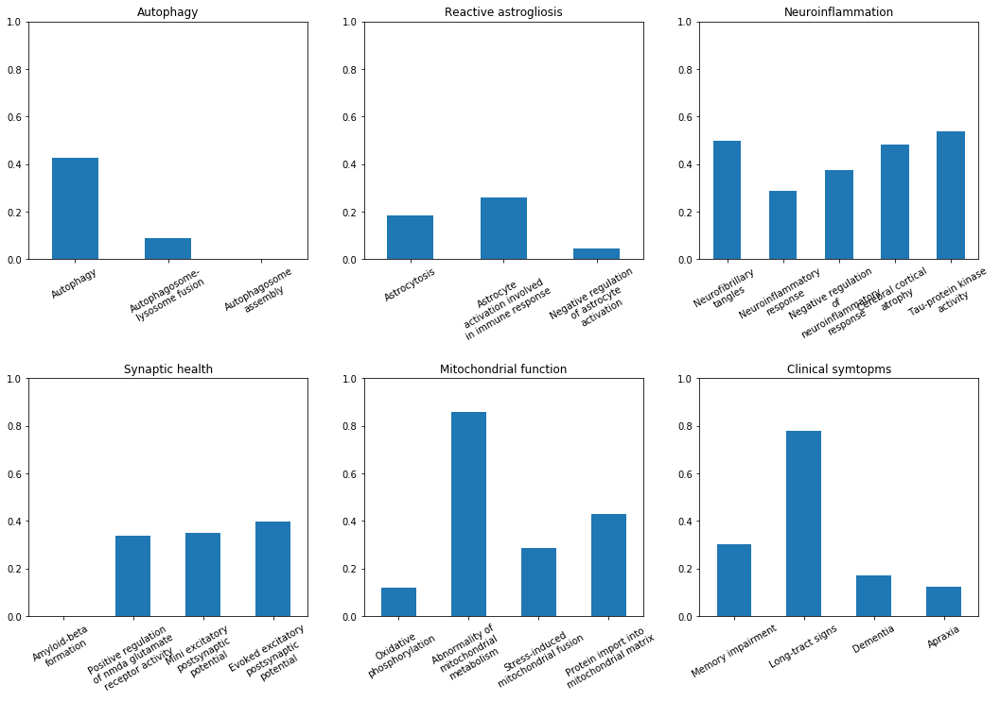

<Figure size 432x432 with 0 Axes>

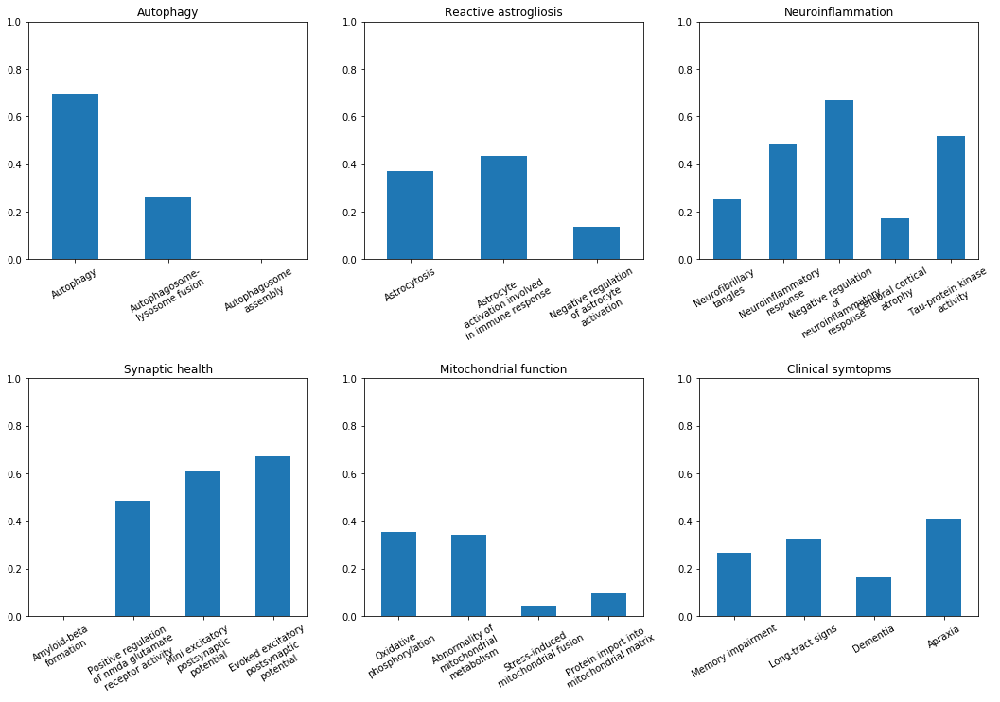

<Figure size 432x432 with 0 Axes>

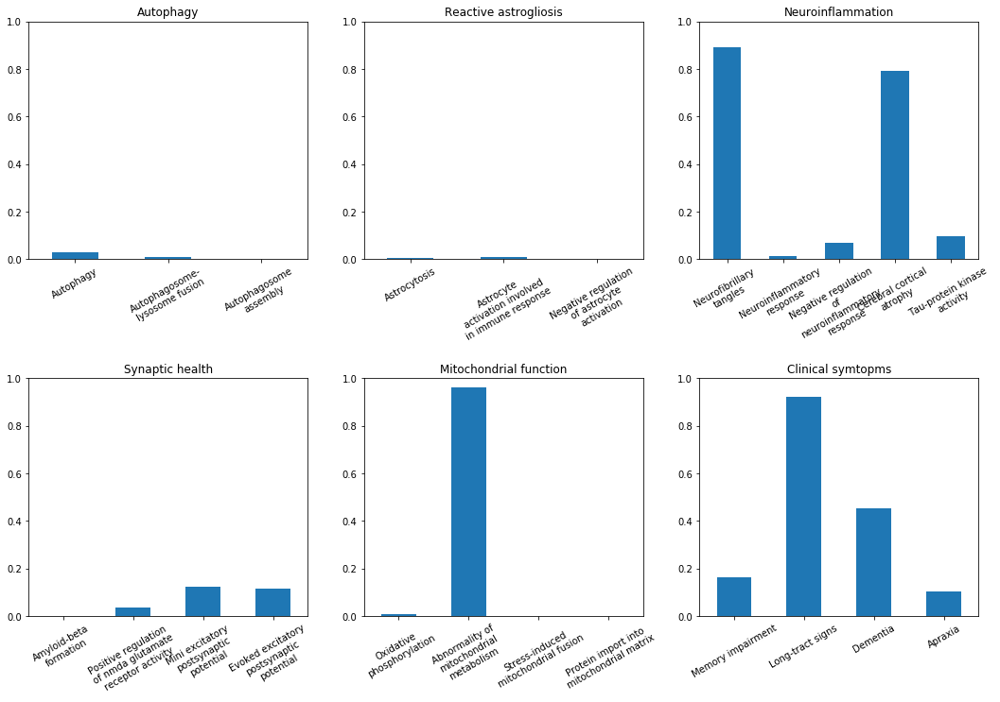

<Figure size 432x432 with 0 Axes>

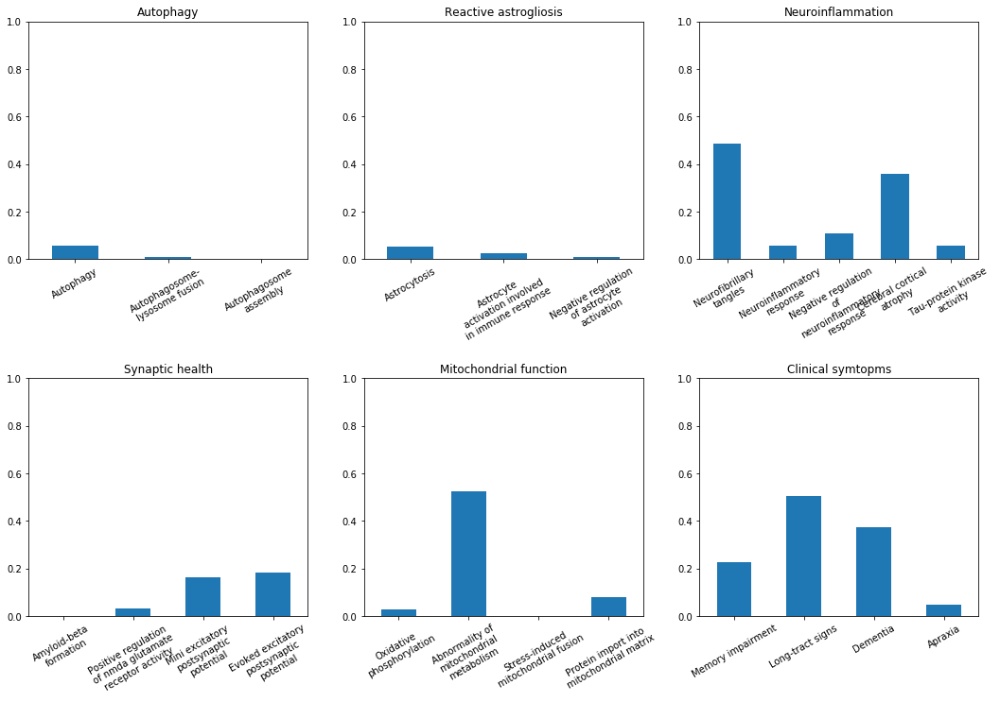

<Figure size 432x432 with 0 Axes>

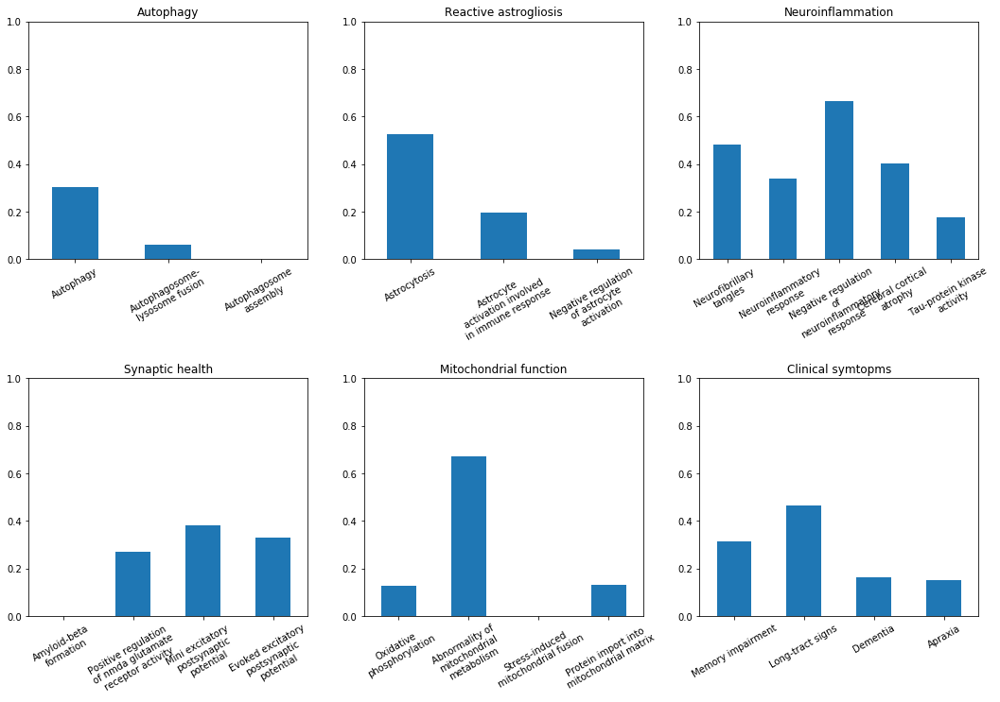

In [32]:
for idx in range(len(probs)):

    chem_id = probs.loc[idx, 'chemicalsubstance_id']

    n_genes = len(c.query('start_id == @chem_id and end_label == "MacromolecularMachine"'))
    n_treats = len(c.query('start_id == @chem_id and type == "treats_CtD"'))


    spoke_labels, data = list(cats.keys()), list(cats.values())
    spoke_labels = [s.replace(' ', '\n') for s in spoke_labels]
    data = [probs.loc[idx].reindex([sg+'_proba' for sg in subgroups]).mean() for subgroups in data] 

    theta = radar_factory(len(data), 'polygon')

    fig, ax = plt.subplots(1, 1, figsize=(6, 6), subplot_kw=dict(projection='radar'))

    ax.set_rgrids([0.2, 0.4, 0.6, 0.8, 1])
    ax.set_ylim(0, 1.2)
    ax.plot(theta, data, color=sns.color_palette()[0])
    ax.fill(theta, data, facecolor=sns.color_palette()[0], alpha=0.25)
    ax.set_varlabels(spoke_labels)
    ax.spines['polar'].set_visible(False) 
    plt.savefig(tmp_dir.joinpath('rad.png'))

    plt.clf()



    row = 2
    col = (len(cats) // 2)

    fig, ax = plt.subplots(row, col)
    fig.set_size_inches(6*col, 4*row+3)

    name = probs.loc[idx, 'cid']
    prob = probs.loc[idx, 'proba']

    gene_info = pd.read_csv(gene_dir.joinpath(name.lower().replace(' ', '_') + '_tgt_genes.csv'))

    #plt.suptitle('Report for {}: {:0.3}'.format(name, prob), size=16)
    plt.subplots_adjust(top=.92, hspace=.5)

    for i, (cat, vals) in enumerate(cats.items()):

        gene_vals = gene_info.set_index('node_name').reindex(columns=[v + '_metric' for v in vals])
        # genes = gene_vals[gene_vals > gene_cutoff].stack().index
        # if type(genes) == pd.MultiIndex:
        #     genes = [g[0] for g in genes.tolist()]
        # else:
        #     genes = genes.tolist()

        # genes = prep_node_labels(', '.join(genes), 40)

        sub = (i%row, i%col)
        ax[sub].set_title(cat)
        probs.loc[idx].reindex([v+'_proba' for v in vals]).plot(kind='bar', ax=ax[sub])
        ax[sub].set_ylim(0, 1)
        #ax[sub].text(.1, .85, genes, transform=ax[sub].transAxes)


        names = [prep_node_labels(v.replace('_', ' ').capitalize(), 20) for v in vals]

        ax[sub].set_xticklabels(names, rotation=30)


    plt.savefig(tmp_dir.joinpath('full.png'))

    out_dat = dict()

    for i, (cat, vals) in enumerate(cats.items()):

        gene_vals = gene_info.set_index('node_name').reindex(columns=[v + '_metric' for v in vals])


        genes = (gene_vals[gene_vals > gene_cutoff].stack()
                                                   .sort_values(ascending=False)
                                                   .reset_index()
                                                   .drop_duplicates(['node_name'])['node_name']
                                                   .tolist())

        genes = ', '.join(genes)

        out_dat[cat] = [genes]



    pdf = FPDF(orientation='P', unit='in', format='letter')
    pdf.add_page()

    pdf.set_xy(0, 0)
    pdf.set_font('arial', 'B', 18)
    pdf.cell(0.5)
    pdf.cell(7.5, h=.8, txt=name.title(), ln=1, align='L')
    pdf.cell(3.5, .4, " ", 0, 2, 'C')

    headers = ['Treatment Probability', '# of Gene interactions', '# of other Diseases Treated']
    values = ['{:1.3f}'.format(prob), '{:,}'.format(n_genes), '{:,}'.format(n_treats)]


    for header, val in zip(headers, values):
        pdf.set_font('arial', 'B', 12)
        pdf.cell(2.9, .4, header, 1, 0, 'L')
        pdf.set_font('arial', '', 12)
        pdf.cell(.85, .4, val, 1, 1, 'R')

    # Bottom picture before top, so top can overlap some whitespace from bottom...
    pdf.set_xy(.4, 3)
    pdf.image(str(tmp_dir.joinpath('full.png')), w = 7, h = 0, type = '', link = '')

    pdf.set_xy(4.75, 0)
    pdf.image(str(tmp_dir.joinpath('rad.png')), w = 3.25, h = 0, type = '', link = '')

    # Reset the pointer
    pdf.set_xy(.4, 7.25)

    pdf.set_font('arial', '', 14)
    pdf.cell(7.5, h=.4, txt='Significant Gene Interactions', ln=1, align='C')

    for k, v in out_dat.items():
        val =  prep_node_labels(', '.join(v), 60).split('\n')
        h_val = .25

        h = len(val) * h_val

        pdf.set_font('arial', 'B', 10)
        pdf.cell(2, h, k, 1, 0, 'L')

        pdf.set_font('arial', '', 10)
        pdf.cell(5.5, h, '', 1, 0)
        pdf.cell(-5.5)
        for value in val[:-1]:
            pdf.cell(5.5, h_val, value, 0, 2, 'L')
        else:
            pdf.cell(5.5, h_val, val[-1], 0, 1, 'L')



    pdf.output(str(out_dir.joinpath('{}.pdf'.format(name))), 'F')

#  I believe everything below this is old code... but don't want to delete just in case

In [232]:
probs.head(2)

,chemicalsubstance_id,disease_id,status,proba,cid,did,treat_proba,dementia_proba,apraxia_proba,abnormality_of_mitochondrial_metabolism_proba,...,negative_regulation_of_neuroinflammatory_response_proba,protein_import_into_mitochondrial_matrix_proba,mini_excitatory_postsynaptic_potential_proba,evoked_excitatory_postsynaptic_potential_proba,negative_regulation_of_astrocyte_activation_proba,neuroinflammatory_response_proba,stress-induced_mitochondrial_fusion_proba,positive_regulation_of_nmda_glutamate_receptor_activity_proba,tau-protein_kinase_activity_proba,astrocyte_activation_involved_in_immune_response_proba
0,CHEBI:8354,DOID:10652,0,0.777562,pralidoxime,Alzheimer's disease,1.000000,1.000000,0.038108,0.894264,...,0.001266,0.000000,0.107494,0.090951,0.016399,0.040318,0.000000,0.050407,0.198083,0.058200
1,CHEBI:8892,DOID:10652,0,0.741301,rosiglitazone maleate,Alzheimer's disease,0.916298,0.590014,0.166400,0.060238,...,0.001502,0.437979,0.579645,0.676068,0.508406,0.667096,0.046816,0.469879,0.567980,0.468558


In [233]:
name = probs.loc[37, 'cid']

In [234]:
name

'(R)-nicotine'

In [236]:
gene_info = pd.read_csv(gene_dir.joinpath(name.lower().replace(' ', '_') + '_tgt_genes.csv'))

In [240]:
gene_info[['node_id', 'node_name'] + [c for c in gene_info.columns if c.endswith('_metric')]].head(10)

,node_id,node_name,autophagy_metric,autophagosome-lysosome_fusion_metric,autophagy_of_mitochondrion_metric,oxidative_phosphorylation_metric,negative_regulation_of_neuroinflammatory_response_metric,protein_import_into_mitochondrial_matrix_metric,mini_excitatory_postsynaptic_potential_metric,evoked_excitatory_postsynaptic_potential_metric,...,tau-protein_kinase_activity_metric,astrocyte_activation_involved_in_immune_response_metric,abnormality_of_mitochondrial_metabolism_metric,neurofibrillary_tangles_metric,cerebral_cortical_atrophy_metric,memory_impairment_metric,long-tract_signs_metric,astrocytosis_metric,dementia_metric,apraxia_metric
0,NCBIGene:351,APP,0.004119,0.001813,0.003165,0.002291,NaN,NaN,0.000249,0.000715,...,NaN,0.197698,NaN,0.009286,0.00301,0.118411,0.047048,0.005467,0.941726,0.005831
1,NCBIGene:43,ACHE,0.000902,0.000228,0.000544,0.000645,NaN,NaN,0.000042,0.000154,...,NaN,0.000044,NaN,NaN,NaN,0.113941,NaN,0.003561,0.967874,0.000157
2,NCBIGene:6531,SLC6A3,0.001042,0.000334,0.000769,0.000768,NaN,NaN,0.000598,0.000549,...,NaN,0.000065,NaN,NaN,NaN,0.095836,NaN,0.000606,0.749890,0.001154
3,NCBIGene:1106,CHD2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.000247,NaN,0.000279,0.002452,0.219001
4,NCBIGene:1786,DNMT1,0.000959,0.000291,0.000396,0.000527,NaN,NaN,0.000174,0.000271,...,NaN,0.000157,0.025309,NaN,NaN,0.005859,NaN,0.000904,0.632391,0.001530
5,NCBIGene:185004,acr-21,NaN,NaN,NaN,0.001479,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.015259,NaN,0.016661,0.200391,0.010801
6,NCBIGene:2247,FGF2,0.004469,0.002520,0.003155,0.002108,NaN,NaN,0.000241,0.000587,...,NaN,0.000961,NaN,NaN,NaN,0.008106,NaN,0.605820,0.004812,0.001635
7,NCBIGene:6474,SHOX2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.002361,NaN,0.000295,0.000619,0.184153
8,NCBIGene:1139,CHRNA7,0.001593,0.000442,0.000722,0.001003,NaN,NaN,0.000414,0.001932,...,NaN,0.000281,NaN,NaN,NaN,0.435964,NaN,0.002526,0.020908,0.004125
9,NCBIGene:627,BDNF,0.000808,0.000604,0.000425,0.000518,NaN,NaN,0.000109,0.000178,...,NaN,0.000015,NaN,NaN,NaN,0.001476,NaN,0.404223,0.003684,0.012581


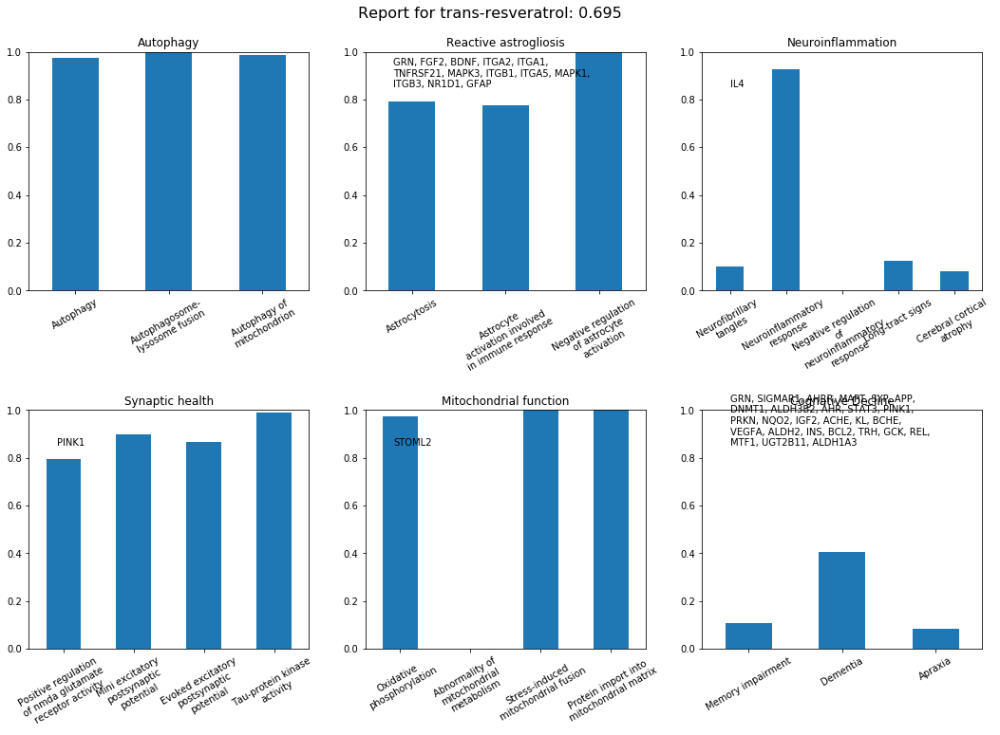

In [24]:
idx = 2

row = 2
col = (len(cats) // 2)

fig, ax = plt.subplots(row, col)
fig.set_size_inches(6*col, 4*row+3)

name = probs.loc[idx, 'cid']
prob = probs.loc[idx, 'proba']

gene_info = pd.read_csv(gene_dir.joinpath(name.replace(' ', '_') + '_tgt_genes.csv'))

plt.suptitle('Report for {}: {:0.3}'.format(name, prob), size=16)
plt.subplots_adjust(top=.92, hspace=.5)

for i, (cat, vals) in enumerate(cats.items()):
    
    gene_vals = gene_info.set_index('node_name').loc[:, [v + '_metric' for v in vals]]
    genes = gene_vals[gene_vals > gene_cutoff].stack().index
    if type(genes) == pd.MultiIndex:
        genes = [g[0] for g in genes.tolist()]
    else:
        genes = genes.tolist()
        
    genes = prep_node_labels(', '.join(genes), 40)
    
    sub = (i%row, i%col)
    ax[sub].set_title(cat)
    probs.loc[idx, [v+'_proba' for v in vals]].plot(kind='bar', ax=ax[sub])
    ax[sub].set_ylim(0, 1)
    ax[sub].text(.1, .85, genes, transform=ax[sub].transAxes)
    
    
    names = [prep_node_labels(v.replace('_', ' ').capitalize(), 20) for v in vals]
    
    ax[sub].set_xticklabels(names, rotation=30)
    



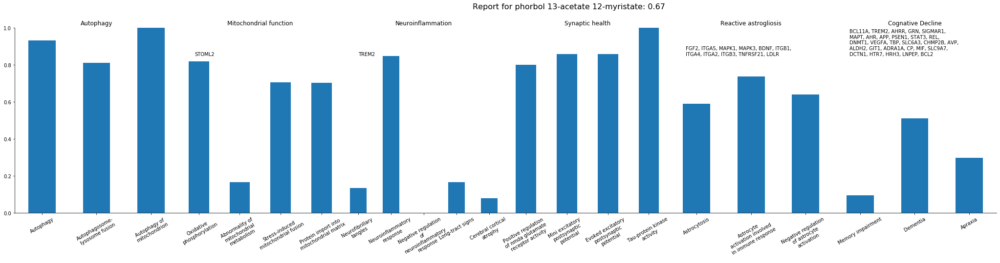

In [29]:
idx = 3

row = 1
col = (len(cats) // row) + 1

fig, ax = plt.subplots(row, col, sharey=True)
fig.set_size_inches(6*col, 4*row+3)

name = probs.loc[idx, 'cid']
prob = probs.loc[idx, 'proba']

gene_info = pd.read_csv(gene_dir.joinpath(name.replace(' ', '_') + '_tgt_genes.csv'))

plt.suptitle('Report for {}: {:0.3}'.format(name, prob), size=16)
plt.subplots_adjust(top=.88, hspace=.5, wspace=0)

for i, (cat, vals) in enumerate(cats.items()):
    
    gene_vals = gene_info.set_index('node_name').loc[:, [v + '_metric' for v in vals]]
    genes = gene_vals[gene_vals > gene_cutoff].stack().index
    if type(genes) == pd.MultiIndex:
        genes = [g[0] for g in genes.tolist()]
    else:
        genes = genes.tolist()
        
    genes = prep_node_labels(', '.join(genes), 40)
    
    if row == 1:
        sub = i
    else:
        sub = (i%row, i%col)
    ax[sub].set_title(cat)
    probs.loc[idx, [v+'_proba' for v in vals]].plot(kind='bar', ax=ax[sub])
    ax[sub].set_ylim(0, 1)
    ax[sub].text(.1, .85, genes, transform=ax[sub].transAxes)
    
    
    if (row != 1 and sub[1] != 0) or (row == 1 and sub != 0):
        ax[sub].yaxis.set_visible(False)
        ax[sub].spines['left'].set_color('none')
    
    names = [prep_node_labels(v.replace('_', ' ').capitalize(), 20) for v in vals]
    
    ax[sub].set_xticklabels(names, rotation=30)
    
    
if row == 1:
    fig.delaxes(ax[-1])    
else:
    fig.delaxes(ax[-1][-1])    
sns.despine()
    
    

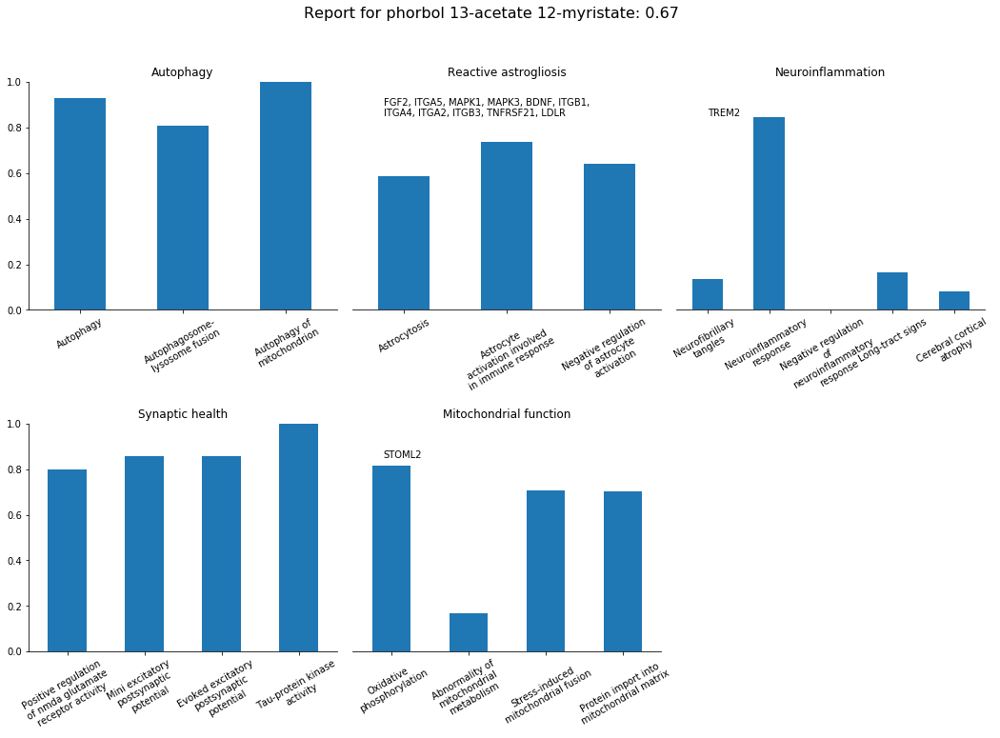

In [34]:
idx = 3

row = 2
col = (len(cats) // row)

fig, ax = plt.subplots(row, col, sharey=True)
fig.set_size_inches(6*col, 4*row+3)

name = probs.loc[idx, 'cid']
prob = probs.loc[idx, 'proba']

gene_info = pd.read_csv(gene_dir.joinpath(name.replace(' ', '_') + '_tgt_genes.csv'))

plt.suptitle('Report for {}: {:0.3}'.format(name, prob), size=16)
plt.subplots_adjust(top=.88, hspace=.5, wspace=0.05)

for i, (cat, vals) in enumerate(cats.items()):
    
    gene_vals = gene_info.set_index('node_name').loc[:, [v + '_metric' for v in vals]]
    genes = gene_vals[gene_vals > gene_cutoff].stack().index
    if type(genes) == pd.MultiIndex:
        genes = [g[0] for g in genes.tolist()]
    else:
        genes = genes.tolist()
        
    genes = prep_node_labels(', '.join(genes), 40)
    
    if row == 1:
        sub = i
    else:
        sub = (i%row, i%col)
        
    #if row != 1 and sub[0] == row-1:
        
        
    ax[sub].set_title(cat)
    probs.loc[idx, [v+'_proba' for v in vals]].plot(kind='bar', ax=ax[sub])
    ax[sub].set_ylim(0, 1)
    ax[sub].text(.1, .85, genes, transform=ax[sub].transAxes)
    
    
    if (row != 1 and sub[1] != 0) or (row == 1 and sub != 0):
        ax[sub].yaxis.set_visible(False)
        ax[sub].spines['left'].set_color('none')
    
    names = [prep_node_labels(v.replace('_', ' ').capitalize(), 20) for v in vals]
    
    ax[sub].set_xticklabels(names, rotation=30)
    
    
if row == 1:
    fig.delaxes(ax[-1])    
else:
    fig.delaxes(ax[-1][-1])    
sns.despine()
    
plt.savefig('test.png')

In [33]:
from fpdf import FPDF

In [36]:
probs.head(4)

,chemicalsubstance_id,disease_id,status,proba,cid,did,treat_proba,dementia_proba,apraxia_proba,abnormality_of_mitochondrial_metabolism_proba,...,negative_regulation_of_neuroinflammatory_response_proba,protein_import_into_mitochondrial_matrix_proba,mini_excitatory_postsynaptic_potential_proba,evoked_excitatory_postsynaptic_potential_proba,negative_regulation_of_astrocyte_activation_proba,neuroinflammatory_response_proba,stress-induced_mitochondrial_fusion_proba,positive_regulation_of_nmda_glutamate_receptor_activity_proba,tau-protein_kinase_activity_proba,astrocyte_activation_involved_in_immune_response_proba
0,CHEBI:8354,DOID:10652,0,0.777562,pralidoxime,Alzheimer's disease,1.000000,1.000000,0.038108,0.894264,...,0.001266,0.000000,0.107494,0.090951,0.016399,0.040318,0.000000,0.050407,0.198083,0.058200
1,CHEBI:8892,DOID:10652,0,0.741301,rosiglitazone maleate,Alzheimer's disease,0.916298,0.590014,0.166400,0.060238,...,0.001502,0.437979,0.579645,0.676068,0.508406,0.667096,0.046816,0.469879,0.567980,0.468558
2,CHEBI:45713,DOID:10652,0,0.695434,trans-resveratrol,Alzheimer's disease,0.810423,0.405086,0.085300,0.000000,...,0.001618,1.000000,0.896252,0.865794,1.000000,0.926290,1.000000,0.792862,0.989514,0.775957
3,CHEBI:37537,DOID:10652,0,0.669816,phorbol 13-acetate 12-myristate,Alzheimer's disease,0.751288,0.510366,0.298958,0.167707,...,0.001643,0.703354,0.858391,0.858541,0.640551,0.846217,0.705818,0.798969,1.000000,0.736774


IndexError: GridSpec slice would result in no space allocated for subplot

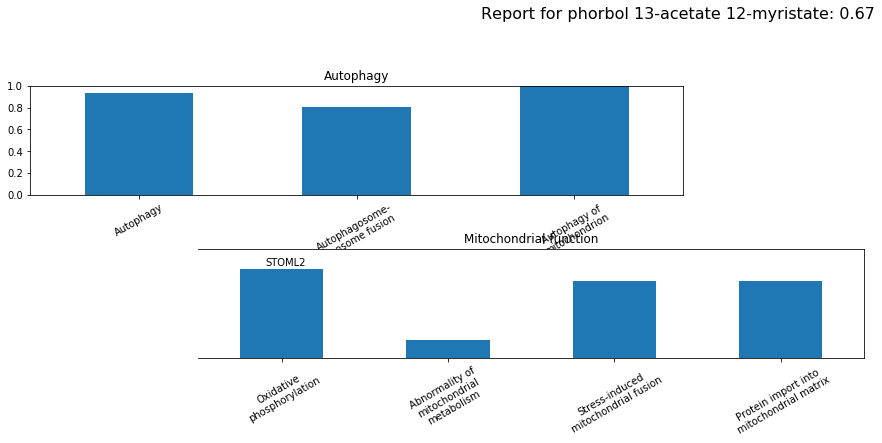

In [31]:
idx = 3

row = 2
col = (len(cats) // row) + 1

fig = plt.figure(figsize=(6*col, 4*row+3))

name = probs.loc[idx, 'cid']
prob = probs.loc[idx, 'proba']

gene_info = pd.read_csv(gene_dir.joinpath(name.replace(' ', '_') + '_tgt_genes.csv'))

plt.suptitle('Report for {}: {:0.3}'.format(name, prob), size=16)
plt.subplots_adjust(top=.88, hspace=.5, wspace=0.05)

for i, (cat, vals) in enumerate(cats.items()):
    
    # Prep data on genes
    gene_vals = gene_info.set_index('node_name').loc[:, [v + '_metric' for v in vals]]
    genes = gene_vals[gene_vals > gene_cutoff].stack().index
    if type(genes) == pd.MultiIndex:
        genes = [g[0] for g in genes.tolist()]
    else:
        genes = genes.tolist()
    genes = prep_node_labels(', '.join(genes), 40)
    
    sub = (i%row, i%col)
        
    if sub[0] == row-1:
        ax = plt.subplot2grid((4, 8), sub, colspan=4)
    else:
        ax = plt.subplot2grid((4, 2), sub)
    
    ax.set_title(cat)
    probs.loc[idx, [v+'_proba' for v in vals]].plot(kind='bar', ax=ax)
    ax.set_ylim(0, 1)
    ax.text(.1, .85, genes, transform=ax.transAxes)
    
    
    if sub[1] != 0:
        ax.yaxis.set_visible(False)
        ax.spines['left'].set_color('none')
    
    names = [prep_node_labels(v.replace('_', ' ').capitalize(), 20) for v in vals]
    
    ax.set_xticklabels(names, rotation=30)
    
    
#if row == 1:
#    fig.delaxes(ax[-1])    
#else:
#    fig.delaxes(ax[-1][-1])    
sns.despine()
    
    

In [26]:
gene_info

,Unnamed: 0,node_id,node_name,mean,total,zero_fill_mean,autophagy_metric,negative_regulation_of_neuroinflammatory_response_metric,regulation_of_autophagy_of_mitochondrion_metric,stress-induced_mitochondrial_fusion_metric,neuroinflammatory_response_metric,neurofibrillary_tangles_metric,cerebral_cortical_atrophy_metric,memory_impairment_metric,long-tract_signs_metric,dementia_metric,apraxia_metric
0,0,NCBIGene:53335,BCL11A,0.927778,3,2.530305e-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000740,NaN,0.000849,2.781747
1,1,NCBIGene:54209,TREM2,0.240310,7,1.529247e-01,0.003568,NaN,NaN,NaN,0.126062,0.009264,0.001410,0.004353,NaN,1.520944,0.016571
2,2,NCBIGene:57491,AHRR,0.177506,5,8.068455e-02,0.000797,NaN,NaN,NaN,0.000064,NaN,NaN,0.002194,NaN,0.883731,0.000745
3,3,NCBIGene:2896,GRN,0.126585,7,8.055429e-02,0.000255,NaN,NaN,NaN,0.000038,0.005152,0.000784,0.002096,NaN,0.833237,0.044535
4,4,NCBIGene:4137,MAPT,0.095534,5,4.342456e-02,0.001055,NaN,NaN,NaN,0.000103,NaN,NaN,0.036081,NaN,0.404349,0.036083
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4815,4815,NCBIGene:255104,TMCO4,0.000006,1,5.474312e-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000006,NaN
4816,4816,NCBIGene:85025,TMEM60,0.000005,1,4.775188e-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000005,NaN
4817,4817,NCBIGene:200634,KRTCAP3,0.000005,1,4.592133e-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000005,NaN
4818,4818,NCBIGene:222166,MTURN,0.000004,1,3.682200e-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000004,NaN,NaN,NaN
